In [ ]:
!unzip /content/drive/MyDrive/formula-1/data.zip -d /content/drive/MyDrive/formula-1

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import os
folder_path = '/content/drive/MyDrive/formula-1'
os.chdir(folder_path)

Mounted at /content/drive


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import gc
import seaborn as sns
import os
import warnings
warnings.filterwarnings("ignore")


In [ ]:
black = '\033[30m'
red = '\033[31m'
green = '\033[32m'
yellow = '\033[33m'
blue = '\033[34m'
magenta = '\033[35m'
cyan = '\033[36m'
white = '\033[37m'
orange = "\033[38;5;208m"
bold = '\033[1m'
reset = '\033[0m'


In [ ]:
colors = {
    "Bold Red": "#FF0000",
    "Bold Green": "#00FF00",
    "Bold Blue": "#0000FF",
    "Bold Yellow": "#FFFF00",
    "Bold Cyan": "#00FFFF",
    "Bold Magenta": "#FF00FF",
    "Bold Orange": "#FFA500",
    "Bold Purple": "#800080",
    "Bold Pink": "#FFC0CB",
    "Bold Brown": "#A52A2A",
    "Bold Grey": "#808080",
    "Bold Black": "#000000",
    "Bold Light Blue": "#ADD8E6",
    "Bold Light Green": "#90EE90",
    "Bold Light Yellow": "#FFFFE0",
    "Bold Light Cyan": "#E0FFFF",
    "Bold Light Magenta": "#FFB6C1",
    "Bold Dark Red": "#8B0000",
    "Bold Dark Green": "#006400",
    "Bold Dark Blue": "#00008B",
    "Bold Dark Orange": "#FF8C00",
    "Bold Dark Purple": "#4B0082",
    "Bold Dark Pink": "#FF1493",
    "Bold Dark Brown": "#654321",
    "Bold Dark Grey": "#A9A9A9",
    "Bold Neon Green": "#39FF14",
    "Bold Neon Pink": "#FF6EC7",
    "Bold Neon Blue": "#1B03A3",
    "Bold Neon Yellow": "#FFFF33",
    "Bold Neon Orange": "#FF5F1F"
}

In [ ]:
def convert_to_timedelta(df , columns_name):
    for col in columns_name:
        df[col] = pd.to_timedelta(df[col])
    return df

def conver_to_datetime(df , columns_name):
    for col in columns_name:
        df[col] = pd.to_datetime(df[col])
    return df

def conver_deltatime_to_second (df , columns_name):
    for col in columns_name:
        df[f'{col}_in_sec'] = df[col].dt.total_seconds()
    return df

In [ ]:
yellow= '\033[3m\033[1m\033[33m'
reset = '\033[0m'
path = 'ocean_data_challenge_F1_data/races_2024/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    print(f'{yellow}{name} : {reset} {df.shape} ')
    print (df.info())
    print(df.isnull().sum())

car_data_2024 :  (6064741, 12) 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6064741 entries, 0 to 6064740
Data columns (total 12 columns):
 #   Column       Dtype 
---  ------       ----- 
 0   EventName    object
 1   DriverName   object
 2   Date         object
 3   RPM          int64 
 4   Speed        int64 
 5   nGear        int64 
 6   Throttle     int64 
 7   Brake        bool  
 8   DRS          int64 
 9   Source       object
 10  Time         object
 11  SessionTime  object
dtypes: bool(1), int64(5), object(6)
memory usage: 514.8+ MB
None
EventName      0
DriverName     0
Date           0
RPM            0
Speed          0
nGear          0
Throttle       0
Brake          0
DRS            0
Source         0
Time           0
SessionTime    0
dtype: int64
circuit_2024 :  (810, 8) 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 810 entries, 0 to 809
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Eve

In [ ]:
yellow= '\033[3m\033[1m\033[33m'
reset = '\033[0m'
path = 'ocean_data_challenge_F1_data/races_2024/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    print(f'{yellow}{name} : {reset} {df.shape} ')
    print (df.describe())


lap_2024 :  (17123, 32) 
       DriverNumber     LapNumber         Stint       SpeedI1       SpeedI2  \
count  17123.000000  17123.000000  17123.000000  14364.000000  17107.000000   
mean      27.785552     31.176079      2.096011    256.498816    248.072368   
std       23.935130     18.652285      0.861789     41.524611     40.018006   
min        1.000000      1.000000      1.000000     65.000000     57.000000   
25%       11.000000     15.000000      1.000000    216.000000    225.000000   
50%       22.000000     30.000000      2.000000    272.000000    256.000000   
75%       44.000000     46.000000      3.000000    286.000000    273.000000   
max       81.000000     78.000000      5.000000    357.000000    336.000000   

            SpeedFL      SpeedST      TyreLife   TrackStatus      Position  
count  16552.000000  15833.00000  17123.000000  17123.000000  17108.000000  
mean     268.854459    296.23211     14.804006      6.322724      9.917407  
std       26.271023     27.24270

In [ ]:

path = 'ocean_data_challenge_F1_data/races_2024/'
for full_name in os.listdir(path):
    name = full_name.split(".")[0]
    df = pd.read_csv(path+full_name)
    print(f'{orange}{bold}{name} : {reset} {df.shape} ')
    for col in df.columns:
      print(f'{bold}{col} : {reset} | {green}{df[col].nunique()} {reset} | {red}{df[col].dtype} {reset}|{blue}{list (df[col].head(5))} {reset} ' )

lap_2024 :  (17123, 32) 
EventName :  | 15  | object |['Bahrain Grand Prix', 'Bahrain Grand Prix', 'Bahrain Grand Prix', 'Bahrain Grand Prix', 'Bahrain Grand Prix']  
Time :  | 17097  | object |['0 days 01:01:37.510000', '0 days 01:03:13.806000', '0 days 01:04:50.559000', '0 days 01:06:27.206000', '0 days 01:08:04.379000']  
Driver :  | 21  | object |['VER', 'VER', 'VER', 'VER', 'VER']  
DriverNumber :  | 21  | int64 |[1, 1, 1, 1, 1]  
LapTime :  | 13266  | object |['0 days 00:01:37.284000', '0 days 00:01:36.296000', '0 days 00:01:36.753000', '0 days 00:01:36.647000', '0 days 00:01:37.173000']  
LapNumber :  | 78  | float64 |[1.0, 2.0, 3.0, 4.0, 5.0]  
Stint :  | 5  | float64 |[1.0, 1.0, 1.0, 1.0, 1.0]  
PitOutTime :  | 554  | object |[nan, nan, nan, nan, nan]  
PitInTime :  | 556  | object |[nan, nan, nan, nan, nan]  
Sector1Time :  | 9847  | object |[nan, '0 days 00:00:30.916000', '0 days 00:00:30.999000', '0 days 00:00:30.931000', '0 days 00:00:31.255000']  
Sector2Time :  | 10662  


*   15 event
*   21 driver
*   75 lap max







In [ ]:
lap_2024 = pd.read_csv('ocean_data_challenge_F1_data/races_2024/lap_2024.csv')
result_2024 = pd.read_csv('ocean_data_challenge_F1_data/races_2024/result_2024.csv')
weather_2024 = pd.read_csv('ocean_data_challenge_F1_data/races_2024/weather_2024.csv')
car_2024 = pd.read_csv('ocean_data_challenge_F1_data/races_2024/car_data_2024.csv')
result_2024['event_driverNum'] = result_2024['EventName'] + '_' + result_2024['DriverNumber'].astype(str)
result_2024['event_driverid'] = result_2024['EventName'] + '_' + result_2024['DriverId']
result_2024['event_driverAbr'] = result_2024['EventName'] + '_' + result_2024['Abbreviation']
lap_2024['event_driverAbr'] = lap_2024['EventName'] + '_' + lap_2024['Driver']
res_lap_2024 = pd.merge(result_2024, lap_2024, on=['event_driverAbr'])
we_res_lap_2024 = pd.merge(res_lap_2024, weather_2024, left_on=['EventName_x'], right_on=['EventName'])
we_res_lap_2024

,EventName_x,DriverNumber_x,BroadcastName,Abbreviation,DriverId,TeamName,TeamColor,TeamId,FirstName,LastName,...,IsAccurate,EventName,Time,AirTemp,Humidity,Pressure,Rainfall,TrackTemp,WindDirection,WindSpeed
0,Bahrain Grand Prix,1,M VERSTAPPEN,VER,max_verstappen,Red Bull Racing,3671c6,red_bull,Max,Verstappen,...,False,Bahrain Grand Prix,0 days 00:00:14.093000,18.9,46.0,1017.1,False,26.5,162,0.9
1,Bahrain Grand Prix,1,M VERSTAPPEN,VER,max_verstappen,Red Bull Racing,3671c6,red_bull,Max,Verstappen,...,False,Bahrain Grand Prix,0 days 00:01:14.084000,18.9,46.0,1017.0,False,26.5,55,1.0
2,Bahrain Grand Prix,1,M VERSTAPPEN,VER,max_verstappen,Red Bull Racing,3671c6,red_bull,Max,Verstappen,...,False,Bahrain Grand Prix,0 days 00:02:14.093000,18.9,46.0,1017.0,False,26.5,55,1.0
3,Bahrain Grand Prix,1,M VERSTAPPEN,VER,max_verstappen,Red Bull Racing,3671c6,red_bull,Max,Verstappen,...,False,Bahrain Grand Prix,0 days 00:03:14.090000,18.9,45.0,1017.0,False,26.2,85,1.1
4,Bahrain Grand Prix,1,M VERSTAPPEN,VER,max_verstappen,Red Bull Racing,3671c6,red_bull,Max,Verstappen,...,False,Bahrain Grand Prix,0 days 00:04:14.091000,18.9,46.0,1017.0,False,26.2,178,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2609115,Dutch Grand Prix,24,G ZHOU,ZHO,zhou,Kick Sauber,52e252,sauber,Guanyu,Zhou,...,True,Dutch Grand Prix,0 days 02:28:40.944000,19.3,57.0,1019.9,False,31.8,203,4.3
2609116,Dutch Grand Prix,24,G ZHOU,ZHO,zhou,Kick Sauber,52e252,sauber,Guanyu,Zhou,...,True,Dutch Grand Prix,0 days 02:29:40.939000,19.3,57.0,1019.9,False,31.8,203,4.3
2609117,Dutch Grand Prix,24,G ZHOU,ZHO,zhou,Kick Sauber,52e252,sauber,Guanyu,Zhou,...,True,Dutch Grand Prix,0 days 02:30:40.913000,19.3,57.0,1019.9,False,31.8,203,4.3
2609118,Dutch Grand Prix,24,G ZHOU,ZHO,zhou,Kick Sauber,52e252,sauber,Guanyu,Zhou,...,True,Dutch Grand Prix,0 days 02:31:40.918000,19.5,57.0,1020.0,False,30.8,233,4.5


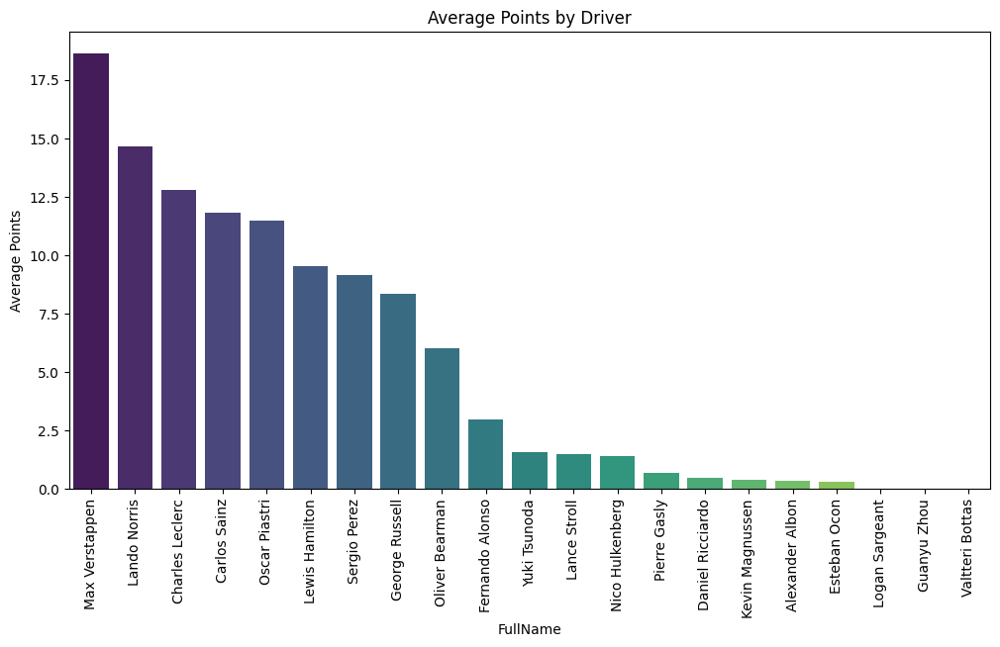

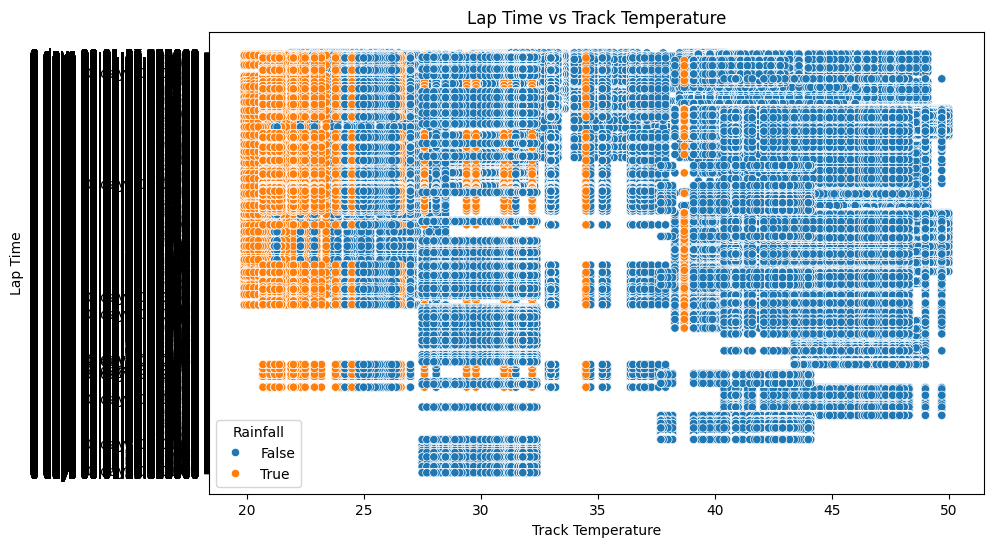

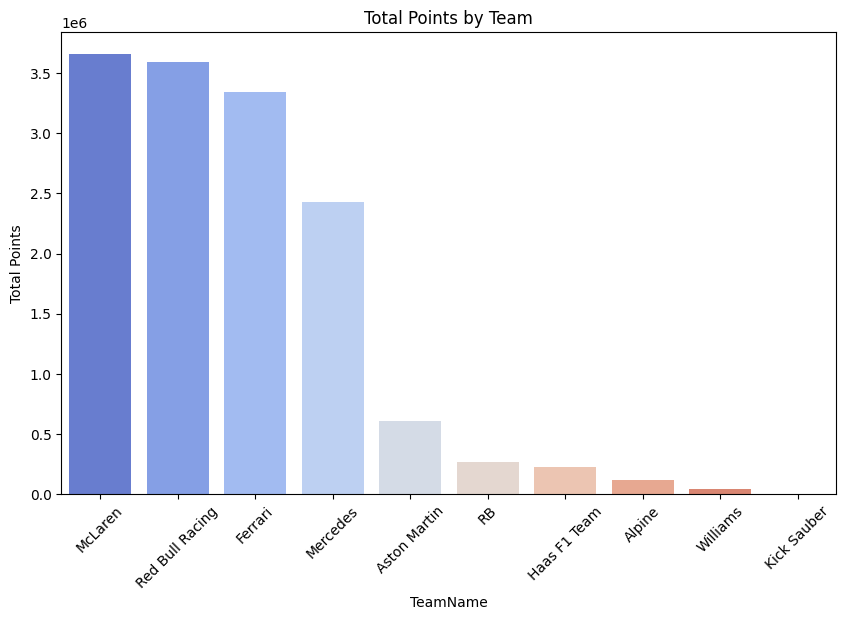

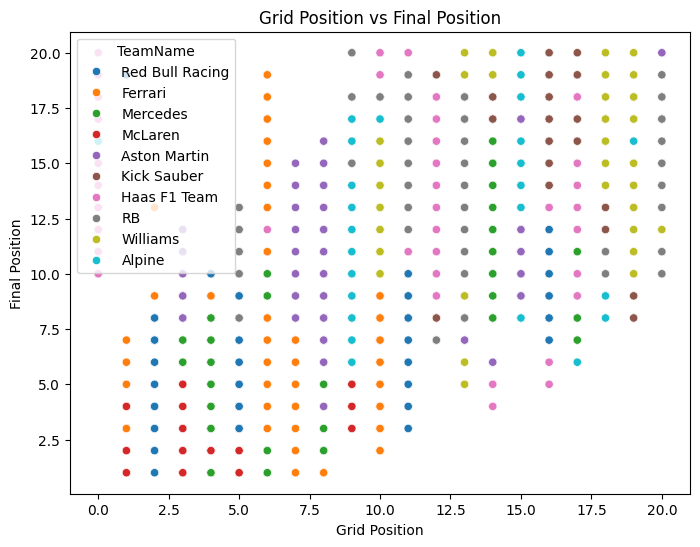

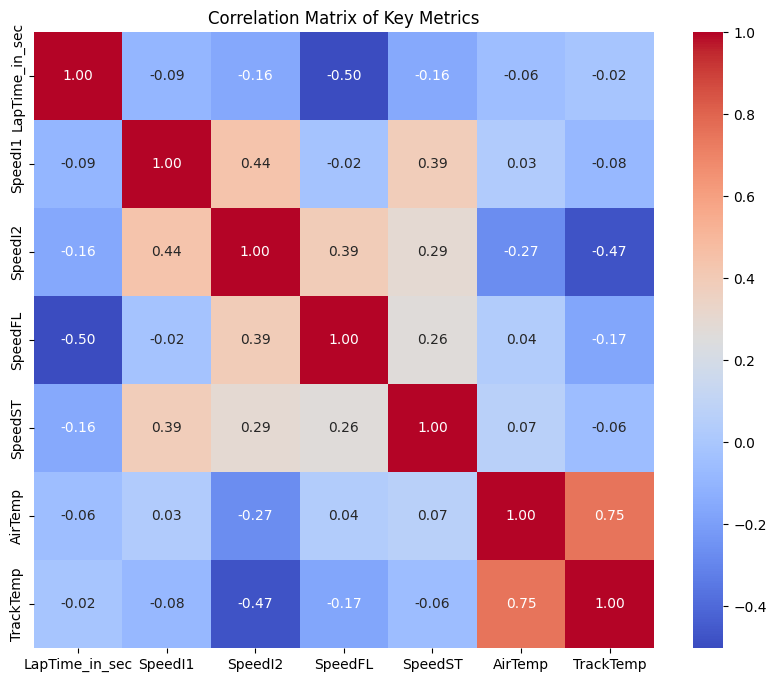

In [ ]:
data = we_res_lap_2024.copy()
# Average points by driver
avg_points_driver = data.groupby('FullName')['Points'].mean().reset_index()
avg_points_driver = avg_points_driver.sort_values(by='Points', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(data=avg_points_driver, x='FullName', y='Points', palette='viridis')
plt.title('Average Points by Driver')
plt.xticks(rotation=90)
plt.ylabel('Average Points')
plt.show()

# **3. Weather Impact Analysis**
# Analyze how weather conditions affect lap times
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='TrackTemp', y='LapTime', hue='Rainfall')
plt.title('Lap Time vs Track Temperature')
plt.xlabel('Track Temperature')
plt.ylabel('Lap Time')
plt.show()

# **4. Team Performance Comparison**
team_performance = data.groupby('TeamName')['Points'].sum().reset_index()
team_performance = team_performance.sort_values(by='Points', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=team_performance, x='TeamName', y='Points', palette='coolwarm')
plt.title('Total Points by Team')
plt.xticks(rotation=45)
plt.ylabel('Total Points')
plt.show()

# **5. Grid Position vs Final Position**
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data, x='GridPosition', y='Position_y', hue='TeamName')
plt.title('Grid Position vs Final Position')
plt.xlabel('Grid Position')
plt.ylabel('Final Position')
plt.show()


deltaTime_cols = ['LapTime']
data= convert_to_timedelta(data , deltaTime_cols)
data = conver_deltatime_to_second (data , deltaTime_cols)
# **6. Correlation Analysis**
correlation_matrix = data[['LapTime_in_sec', 'SpeedI1', 'SpeedI2', 'SpeedFL', 'SpeedST', 'AirTemp', 'TrackTemp']].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Key Metrics')
plt.show()

### **car data** 2024

In [ ]:
df  = pd.read_csv('/content/drive/MyDrive/formula-1/ocean_data_challenge_F1_data/races_2024/car_data_2024.csv')
df.head(5)

,EventName,DriverName,Date,RPM,Speed,nGear,Throttle,Brake,DRS,Source,Time,SessionTime
0,Bahrain Grand Prix,VER,2024-03-02 15:03:42.390,9963,0,1,15,True,1,car,0 days 00:00:00.048000,0 days 00:59:59.959000
1,Bahrain Grand Prix,VER,2024-03-02 15:03:42.630,9755,0,1,15,True,1,car,0 days 00:00:00.288000,0 days 01:00:00.199000
2,Bahrain Grand Prix,VER,2024-03-02 15:03:42.870,8495,3,1,15,False,1,car,0 days 00:00:00.528000,0 days 01:00:00.439000
3,Bahrain Grand Prix,VER,2024-03-02 15:03:43.110,6815,11,1,15,False,1,car,0 days 00:00:00.768000,0 days 01:00:00.679000
4,Bahrain Grand Prix,VER,2024-03-02 15:03:43.270,5695,17,1,15,False,1,car,0 days 00:00:00.928000,0 days 01:00:00.839000


In [ ]:
df.describe()

,RPM,Speed,nGear,Throttle,DRS
count,6.064741e+06,6.064741e+06,6.064741e+06,6.064741e+06,6.064741e+06
mean,9.511771e+03,1.888952e+02,4.887386e+00,5.961247e+01,7.535504e-01
std,2.587596e+03,8.293295e+01,2.149779e+00,4.352776e+01,2.420758e+00
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,8.742000e+03,1.260000e+02,3.000000e+00,0.000000e+00,0.000000e+00
50%,1.050300e+04,1.970000e+02,5.000000e+00,8.000000e+01,0.000000e+00
75%,1.110200e+04,2.590000e+02,7.000000e+00,1.000000e+02,0.000000e+00
max,1.349400e+04,3.560000e+02,1.280000e+02,1.040000e+02,1.500000e+01


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6064741 entries, 0 to 6064740
Data columns (total 12 columns):
 #   Column       Dtype 
---  ------       ----- 
 0   EventName    object
 1   DriverName   object
 2   Date         object
 3   RPM          int64 
 4   Speed        int64 
 5   nGear        int64 
 6   Throttle     int64 
 7   Brake        bool  
 8   DRS          int64 
 9   Source       object
 10  Time         object
 11  SessionTime  object
dtypes: bool(1), int64(5), object(6)
memory usage: 514.8+ MB


In [ ]:
print(f'{orange}{bold}car_data_2024 : {reset} {df.shape} ')
for col in df.columns:
    print(f'{bold}{col} : {reset} |nnull: {yellow}{df[col].isnull().sum()} {reset} |nunique: {green}{df[col].nunique()} {reset} | {red}{df[col].dtype} {reset}|{blue}{list (df[col].head(5))} {reset} ' )

car_data_2024 :  (6064741, 12) 
EventName :  |nnull: 0  |nunique: 15  | object |['Bahrain Grand Prix', 'Bahrain Grand Prix', 'Bahrain Grand Prix', 'Bahrain Grand Prix', 'Bahrain Grand Prix']  
DriverName :  |nnull: 0  |nunique: 21  | object |['VER', 'VER', 'VER', 'VER', 'VER']  
Date :  |nnull: 0  |nunique: 325127  | object |['2024-03-02 15:03:42.390', '2024-03-02 15:03:42.630', '2024-03-02 15:03:42.870', '2024-03-02 15:03:43.110', '2024-03-02 15:03:43.270']  
RPM :  |nnull: 0  |nunique: 10870  | int64 |[9963, 9755, 8495, 6815, 5695]  
Speed :  |nnull: 0  |nunique: 357  | int64 |[0, 0, 3, 11, 17]  
nGear :  |nnull: 0  |nunique: 110  | int64 |[1, 1, 1, 1, 1]  
Throttle :  |nnull: 0  |nunique: 100  | int64 |[15, 15, 15, 15, 15]  
Brake :  |nnull: 0  |nunique: 2  | bool |[True, True, False, False, False]  
DRS :  |nnull: 0  |nunique: 11  | int64 |[1, 1, 1, 1, 1]  
Source :  |nnull: 0  |nunique: 1  | object |['car', 'car', 'car', 'car', 'car']  
Time :  |nnull: 0  |nunique: 315731  | objec

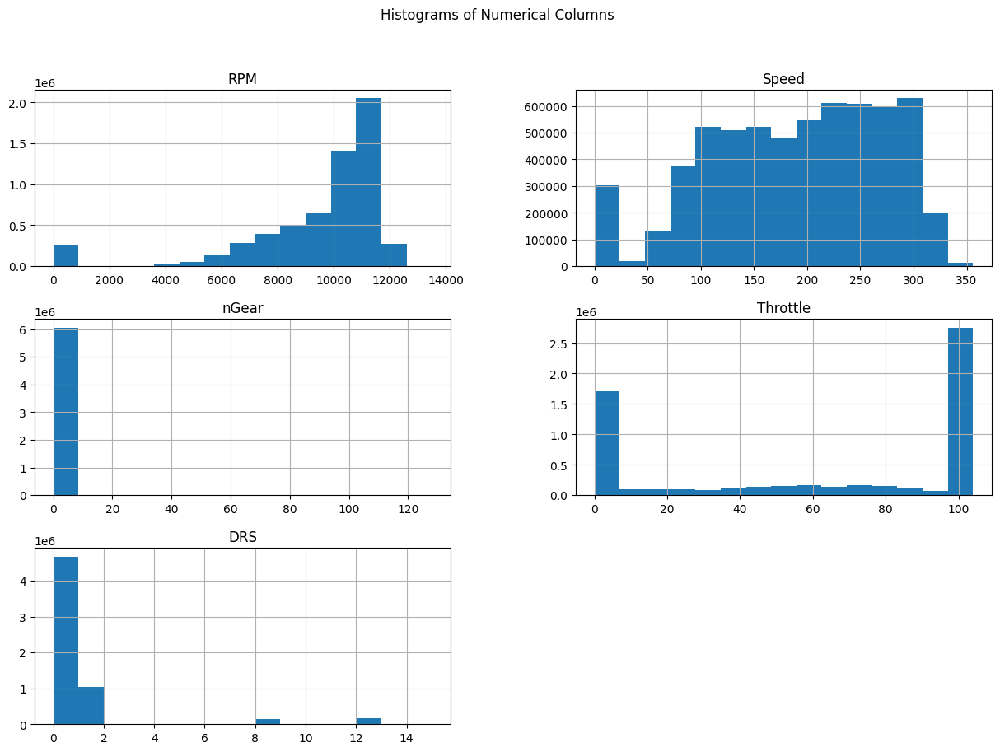

In [ ]:
df[['RPM', 'Speed', 'nGear', 'Throttle', 'DRS']].hist(bins=15, figsize=(15, 10))
plt.suptitle('Histograms of Numerical Columns')
plt.show()


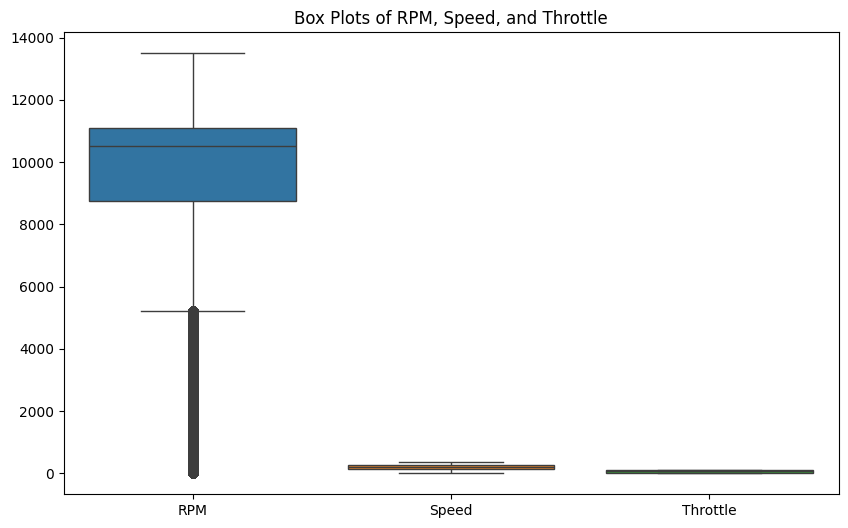

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df[['RPM', 'Speed', 'Throttle']])
plt.title('Box Plots of RPM, Speed, and Throttle')
plt.show()

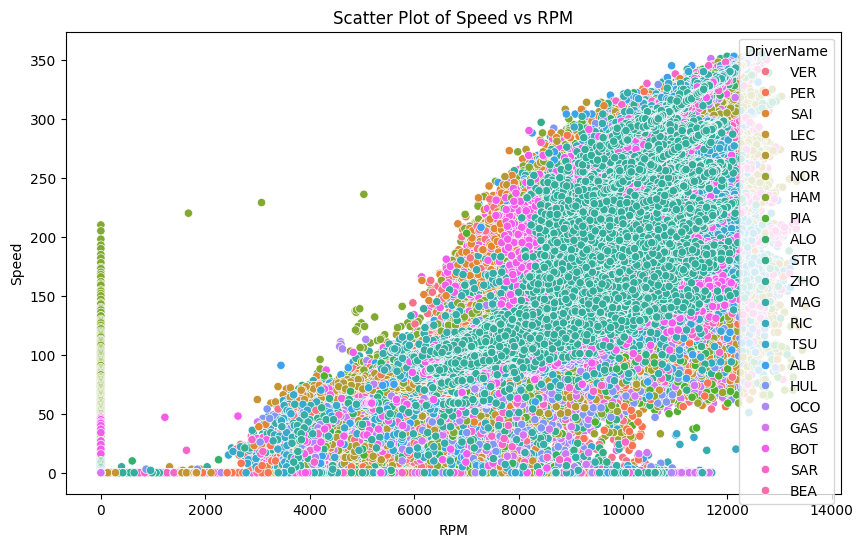

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='RPM', y='Speed', hue='DriverName')
plt.title('Scatter Plot of Speed vs RPM')
plt.show()


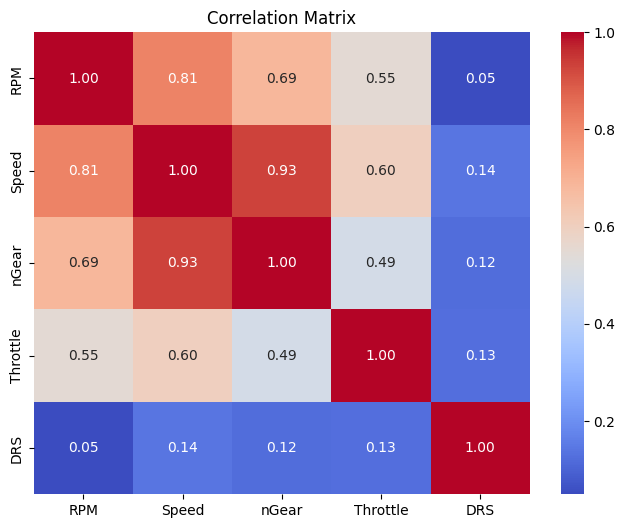

In [ ]:
correlation_matrix = df[['RPM', 'Speed', 'nGear', 'Throttle', 'DRS']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()



Driver Performance Metrics:
   DriverName       Speed           RPM   Throttle  Brake
0         ALB  189.794344   9594.451418  55.321693  60764
1         ALO  188.323283   9565.765316  58.016434  61913
2         BEA  225.109657  10413.495362  73.496809   2908
3         BOT  187.920864   9338.858570  61.269206  71177
4         GAS  183.706896   9456.157418  58.333715  53119
5         HAM  188.438951   9271.361677  59.025701  62753
6         HUL  191.901582   9585.933586  62.496696  66795
7         LEC  190.256359   9615.831125  63.139345  64072
8         MAG  191.201857   9405.051176  61.915837  67507
9         NOR  190.311406   9715.014624  58.173333  58750
10        OCO  190.821780   9417.198354  63.865256  71423
11        PER  192.658561   9468.971354  63.009587  65735
12        PIA  190.243279   9672.328016  57.827224  58680
13        RIC  190.131325   9779.143724  59.493217  54722
14        RUS  189.409510   9593.339171  59.323956  58575
15        SAI  188.390926   9516.686229  61

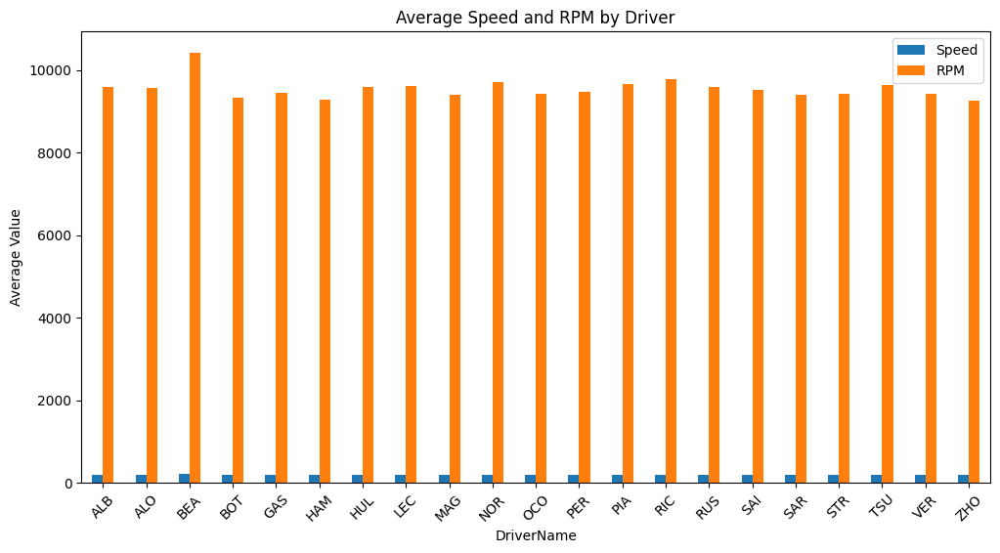


DRS Analysis:
                 EventName DRS       Speed                   RPM
                                      mean   count          mean
0    Australian Grand Prix   0  221.647671  266796  10340.292917
1    Australian Grand Prix   1  175.611010   19764   9630.127302
2    Australian Grand Prix   2  240.529412      51  10370.941176
3    Australian Grand Prix   3  223.000000       4   9713.250000
4    Australian Grand Prix   8  224.805772   13237  10515.073204
..                     ...  ..         ...     ...           ...
121     Spanish Grand Prix   2  289.044444      45  11053.022222
122     Spanish Grand Prix   8  250.153314    3757  10775.192973
123     Spanish Grand Prix  10  279.607143     112  11001.991071
124     Spanish Grand Prix  12  300.776400    8712  11248.770087
125     Spanish Grand Prix  14  288.584016    1464  11166.336066

[126 rows x 5 columns]


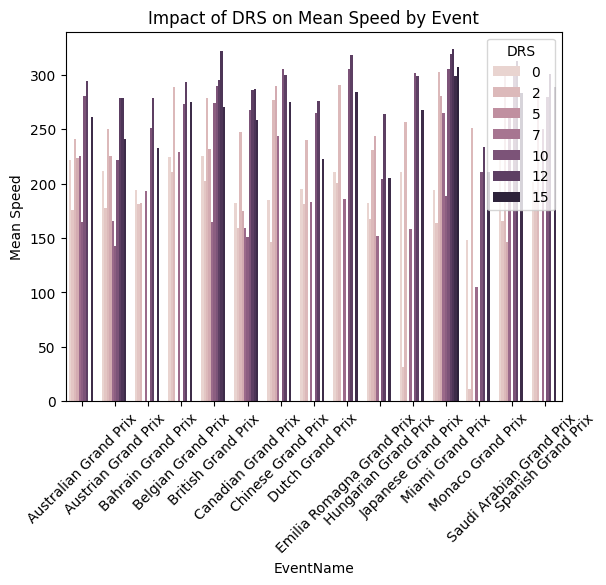

In [ ]:
# **5. Driver Performance Analysis**
driver_performance = df.groupby('DriverName').agg({
    'Speed': 'mean',
    'RPM': 'mean',
    'Throttle': 'mean',
    'Brake': 'sum'  # Count of brake usage
}).reset_index()

print("\nDriver Performance Metrics:")
print(driver_performance)

# Bar chart for driver performance
driver_performance.plot(x='DriverName', y=['Speed', 'RPM'], kind='bar', figsize=(12, 6))
plt.title('Average Speed and RPM by Driver')
plt.ylabel('Average Value')
plt.xticks(rotation=45)
plt.show()

# **6. DRS Analysis**
drs_analysis = df.groupby(['EventName', 'DRS']).agg({
    'Speed': ['mean', 'count'],
    'RPM': ['mean']
}).reset_index()

print("\nDRS Analysis:")
print(drs_analysis)

# Bar plot for DRS usage impact on speed
drs_analysis.columns = ['EventName', 'DRS', 'Mean Speed', 'Count', 'Mean RPM']
sns.barplot(data=drs_analysis, x='EventName', y='Mean Speed', hue='DRS')
plt.title('Impact of DRS on Mean Speed by Event')
plt.xticks(rotation=45)
plt.show()

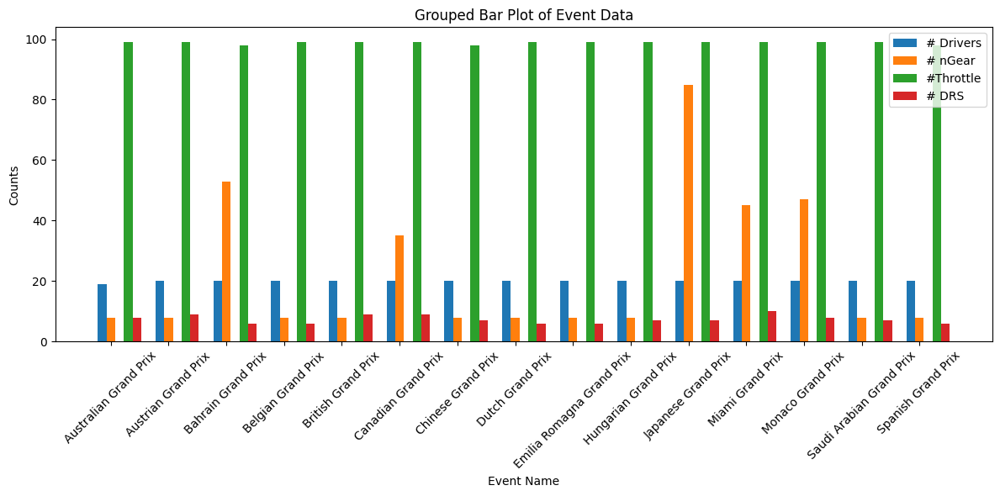

In [ ]:
grouped_data = df.groupby('EventName').agg({
            'DriverName': lambda x: np.count_nonzero(np.unique(x)),
            'nGear': lambda x: np.count_nonzero(np.unique(x)),
            'RPM': lambda x: np.count_nonzero(np.unique(x)),
            'Throttle': lambda x: np.count_nonzero(np.unique(x)),
            'DRS': lambda x: np.count_nonzero(np.unique(x)),
        }, dropna=False).reset_index()

categories = grouped_data['EventName']
n = len(categories)

bar_width = 0.15
index = np.arange(n)
plt.figure(figsize=(12, 6))
plt.bar(index, grouped_data['DriverName'], bar_width, label='# Drivers')
plt.bar(index + bar_width, grouped_data['nGear'], bar_width, label='# nGear')
# plt.bar(index + 2 * bar_width, grouped_data['RPM'], bar_width, label='# RPM')
plt.bar(index + 3 * bar_width, grouped_data['Throttle'], bar_width, label='#Throttle')
plt.bar(index + 4 * bar_width, grouped_data['DRS'], bar_width, label='# DRS')

plt.xlabel('Event Name')
plt.ylabel('Counts')
plt.title('Grouped Bar Plot of Event Data')
plt.xticks(index + bar_width, categories, rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
df= conver_to_datetime(df, ['Date'])

grouped_data = df.groupby([pd.Grouper(key='Date', freq='S'), 'EventName']).agg({
        'nGear': lambda x: len(x.unique()),
        'RPM': 'mean',
        'Throttle': 'mean',
        'DRS': 'sum',
        'Speed': 'mean'
        }, dropna=False).reset_index()



In [ ]:
grouped_data['EventName'].unique()

array(['Bahrain Grand Prix', 'Saudi Arabian Grand Prix',
       'Australian Grand Prix', 'Japanese Grand Prix',
       'Chinese Grand Prix', 'Miami Grand Prix',
       'Emilia Romagna Grand Prix', 'Monaco Grand Prix',
       'Canadian Grand Prix', 'Spanish Grand Prix', 'Austrian Grand Prix',
       'British Grand Prix', 'Hungarian Grand Prix', 'Belgian Grand Prix',
       'Dutch Grand Prix'], dtype=object)

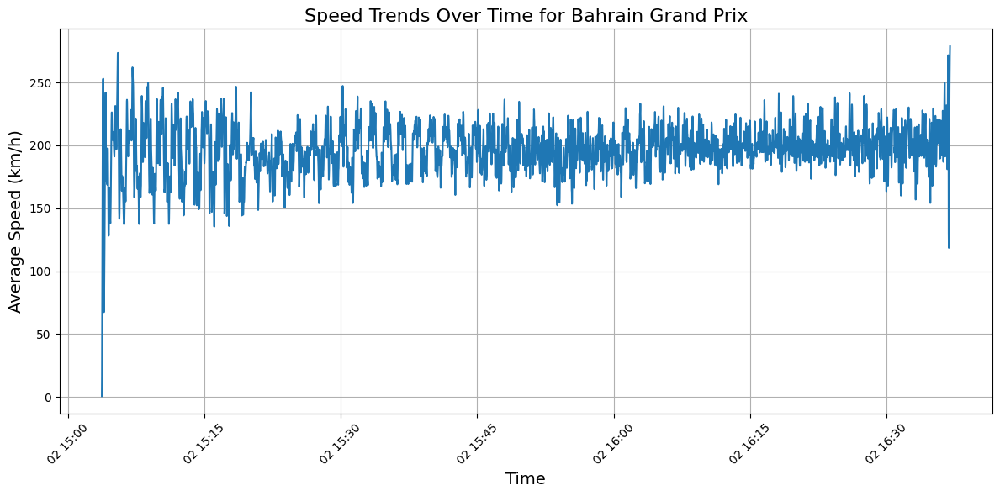

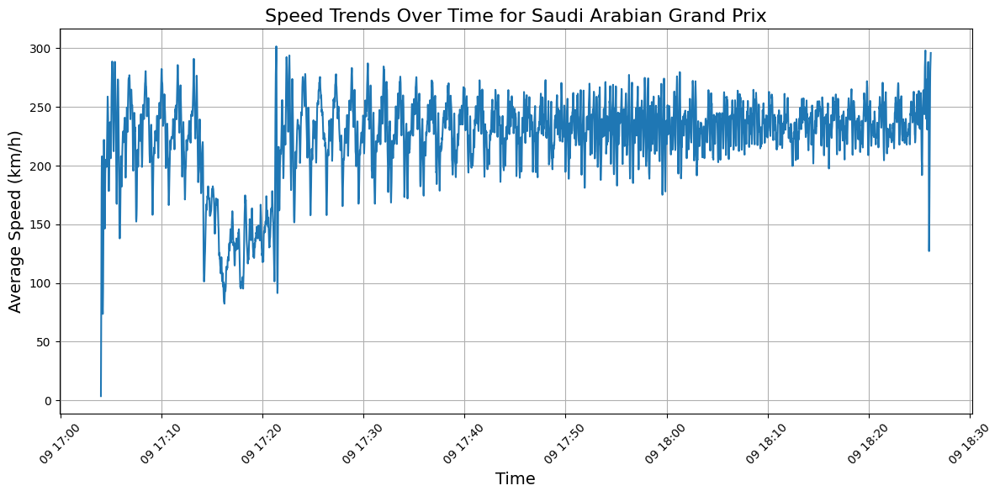

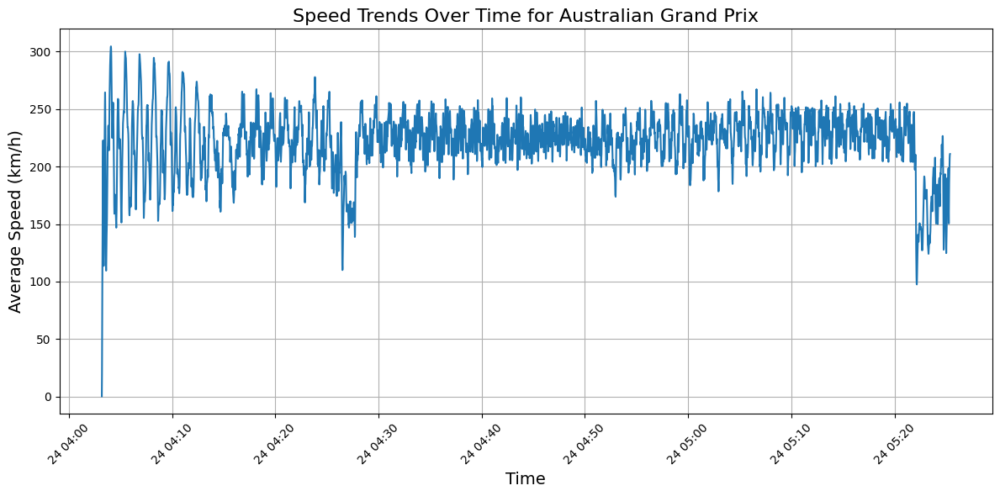

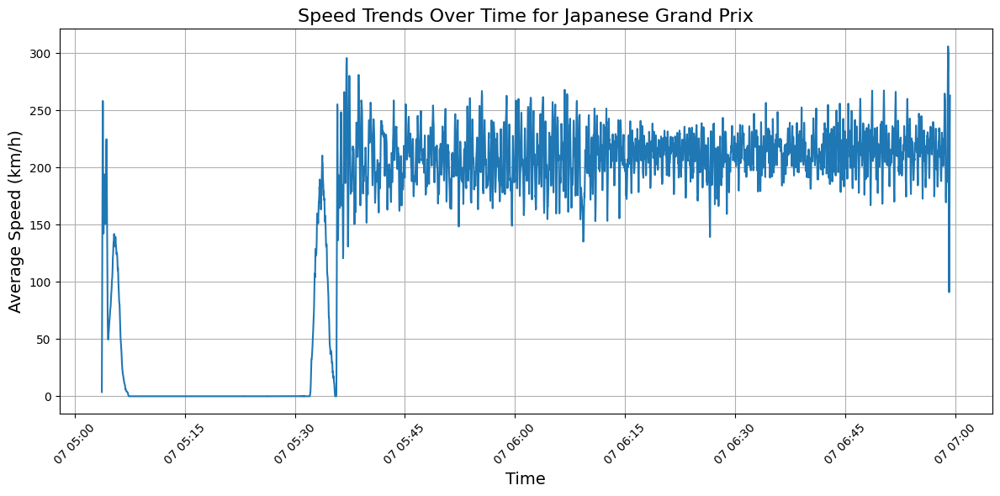

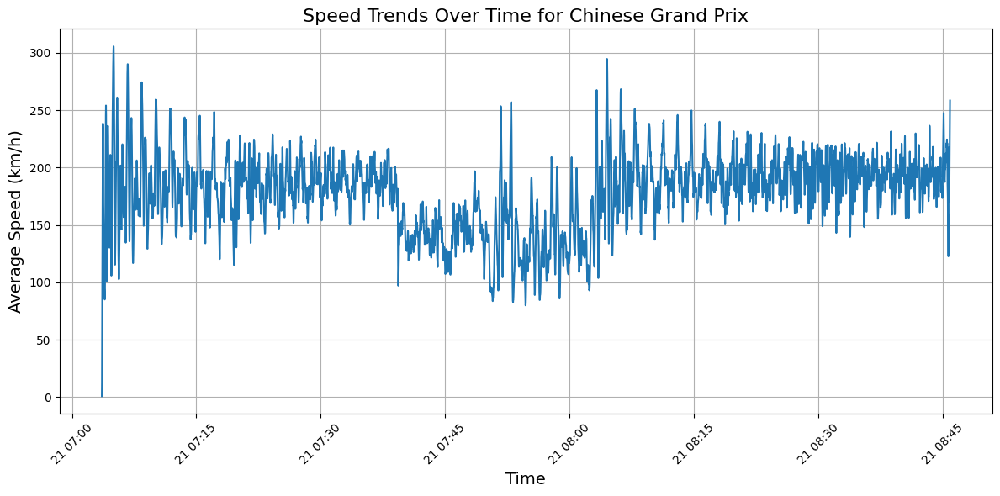

...

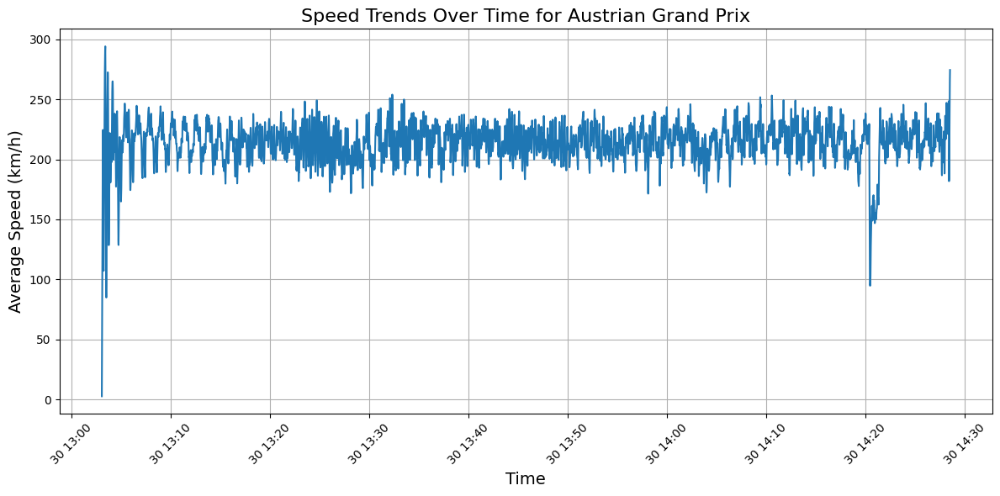

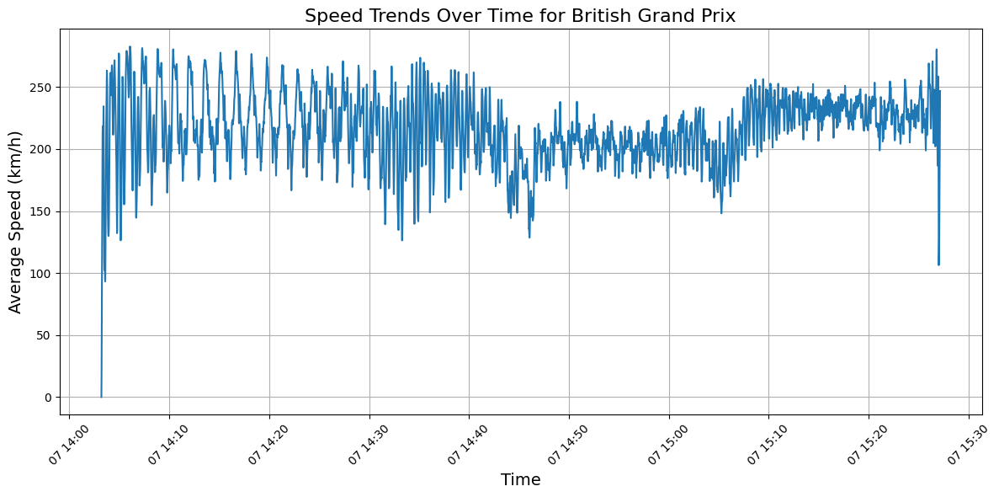

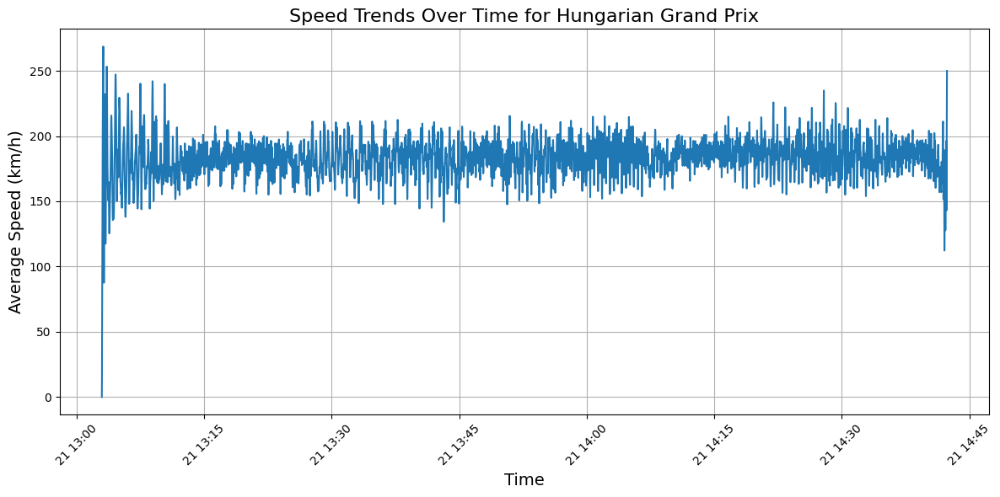

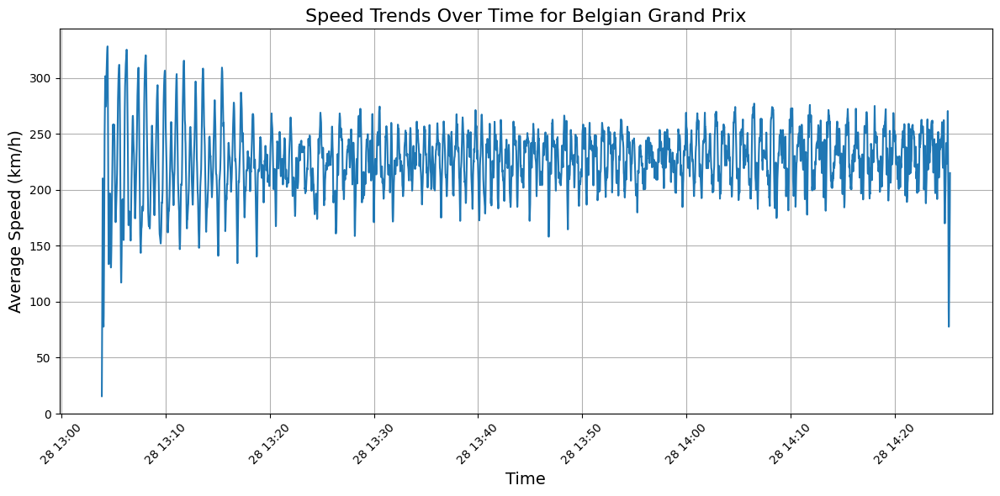

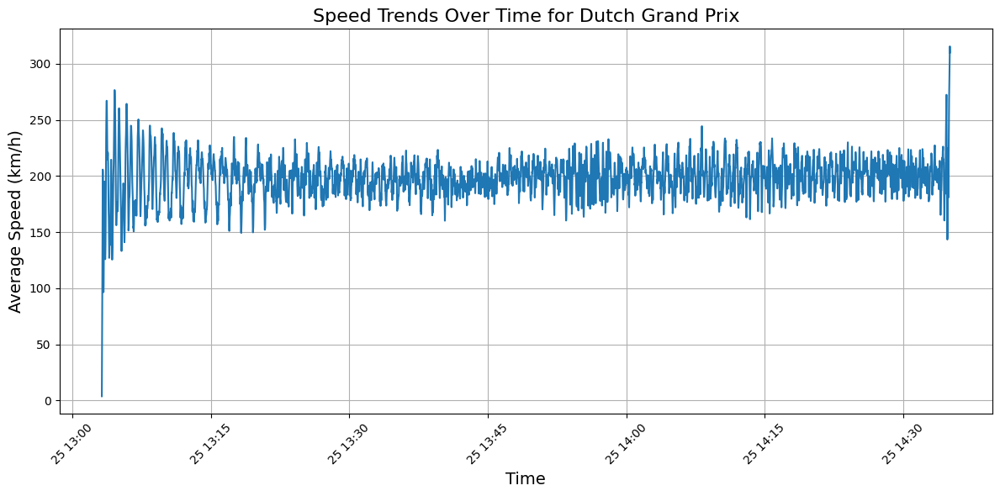

In [ ]:
import matplotlib.pyplot as plt


for event in grouped_data['EventName'].unique():
    plt.figure(figsize=(12, 6))

    subset = grouped_data[grouped_data['EventName'] == event]
    plt.plot(subset['Date'], subset['Speed'], label=event)
    plt.title(f'Speed Trends Over Time for {event}', fontsize=16)
    plt.xlabel('Time', fontsize=14)
    plt.ylabel('Average Speed (km/h)', fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid()
    plt.show()

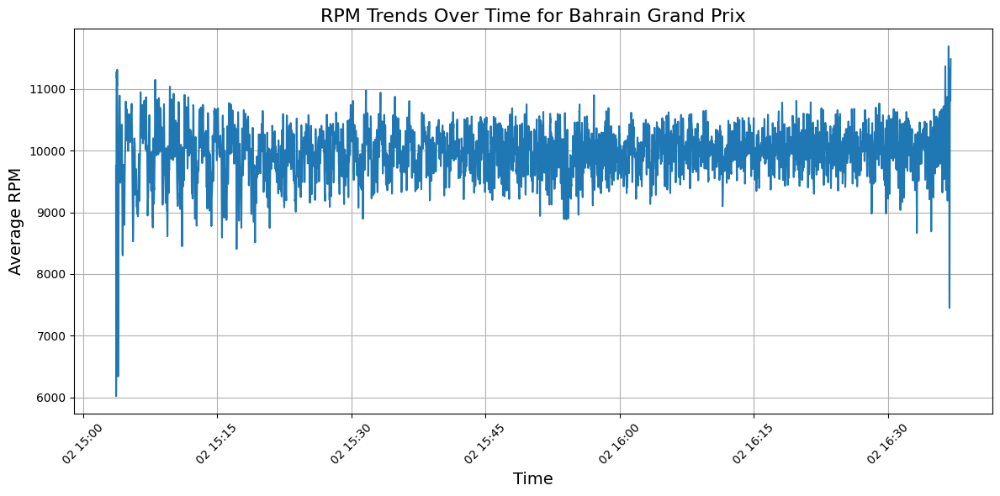

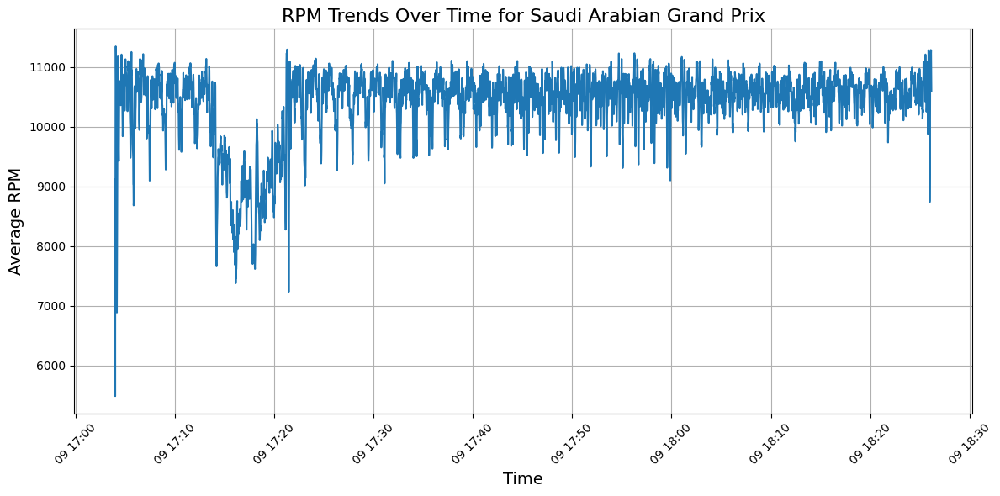

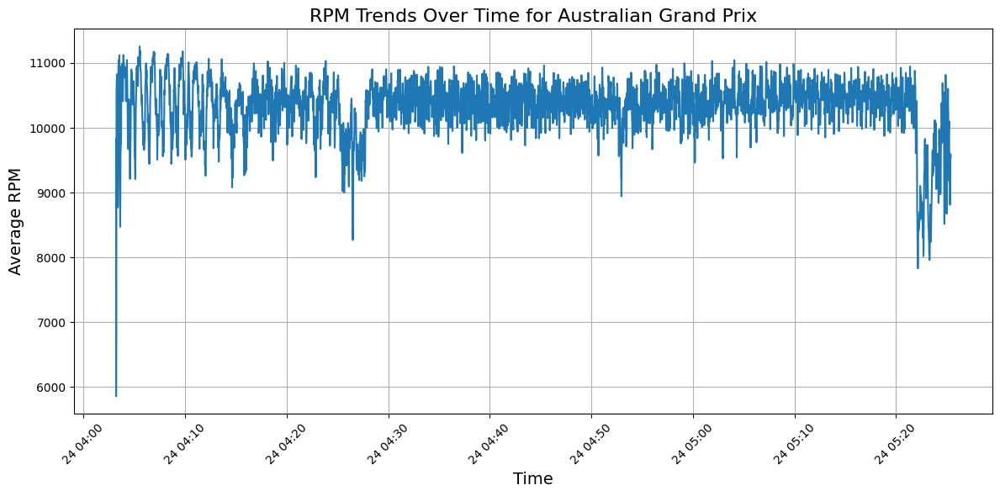

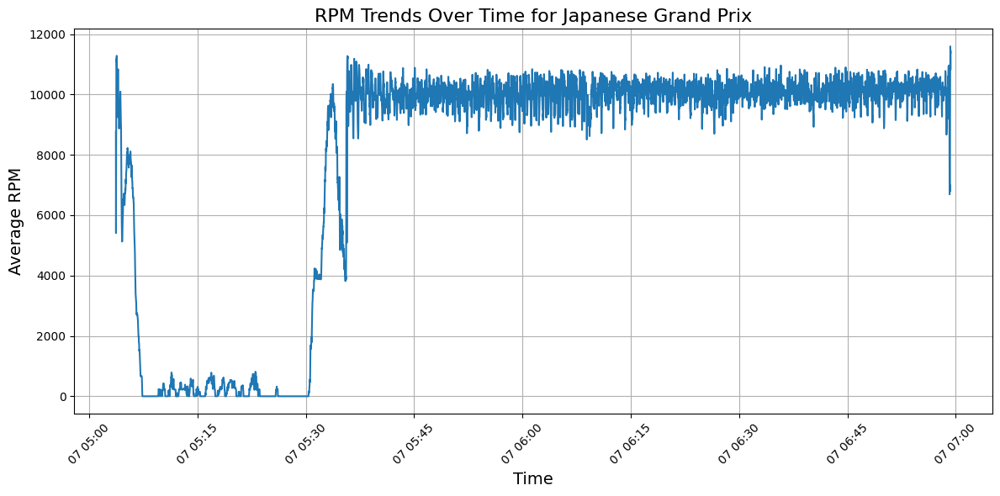

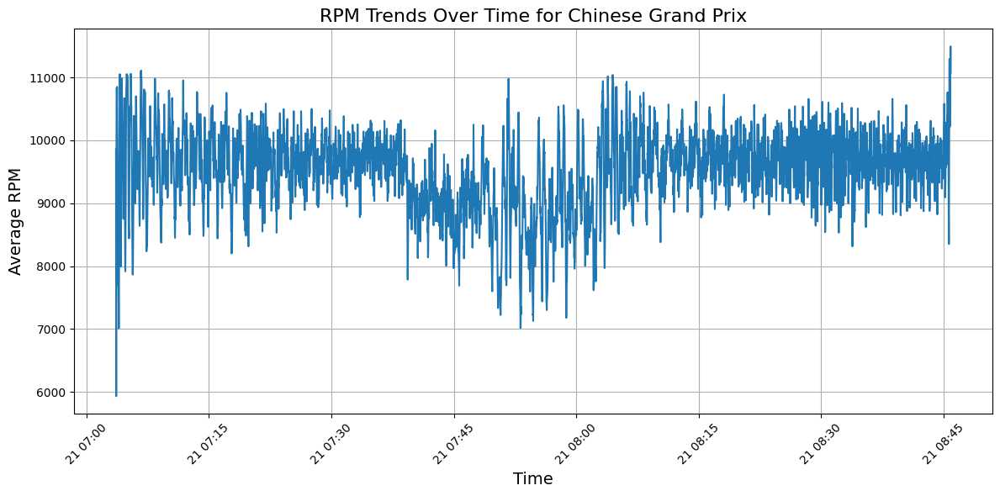

...

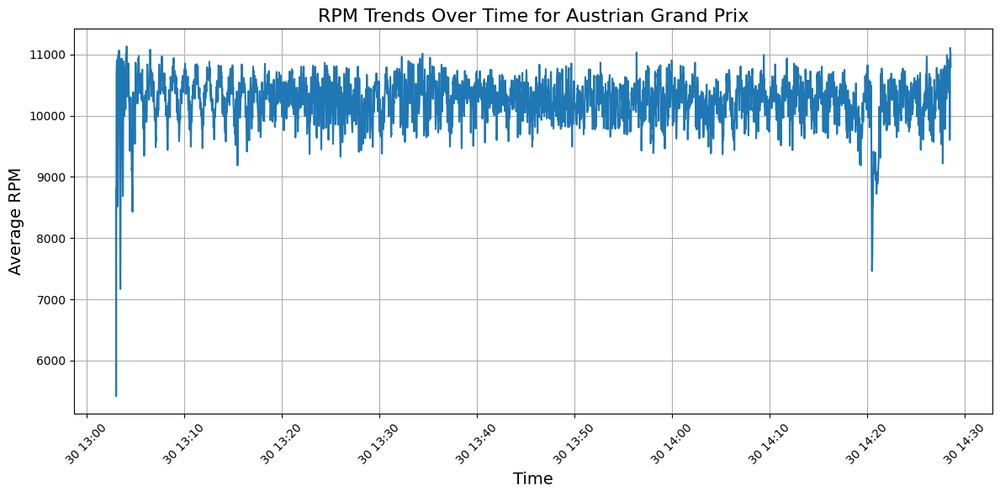

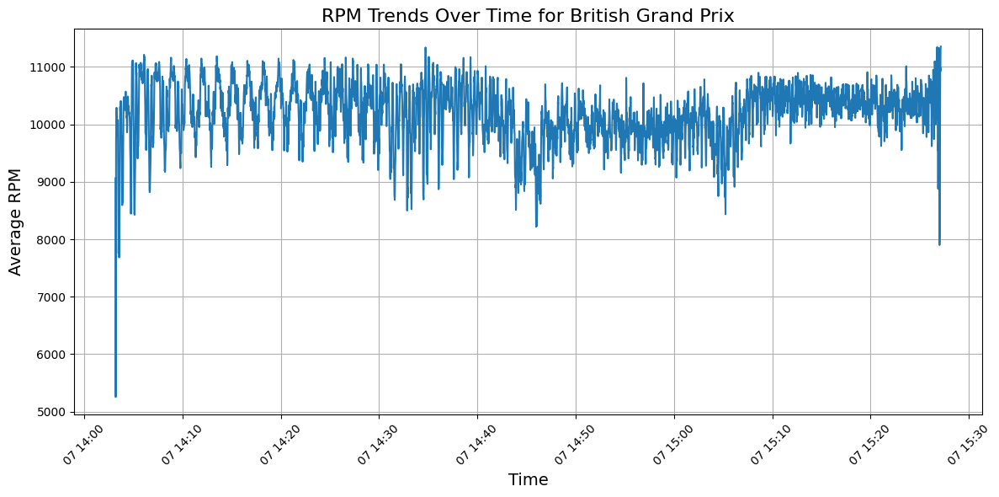

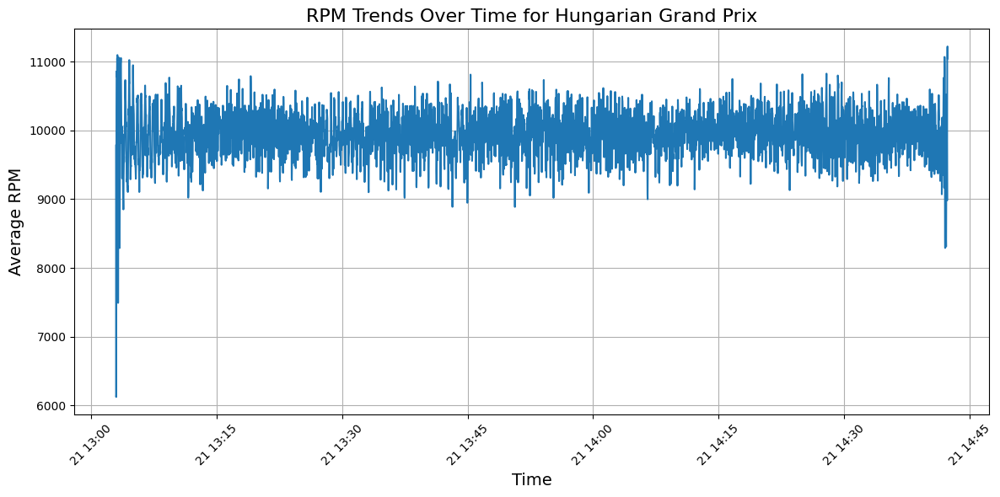

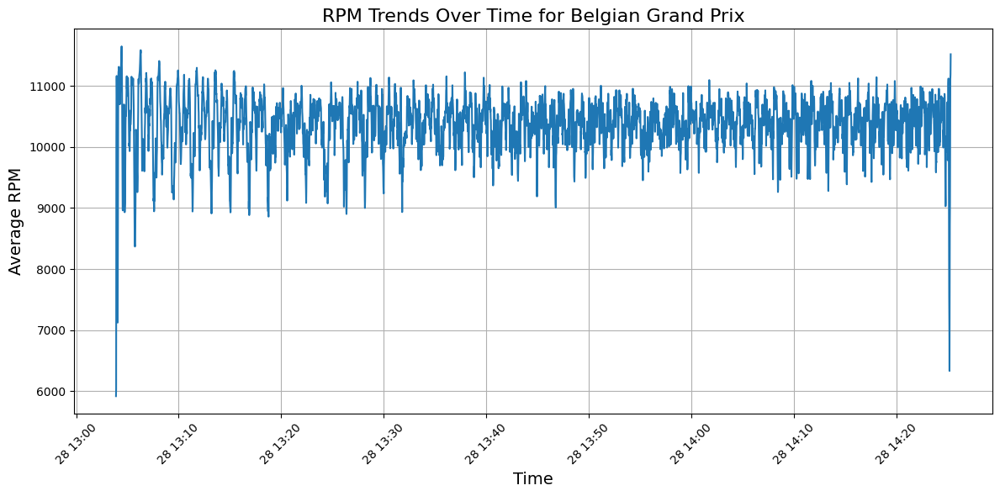

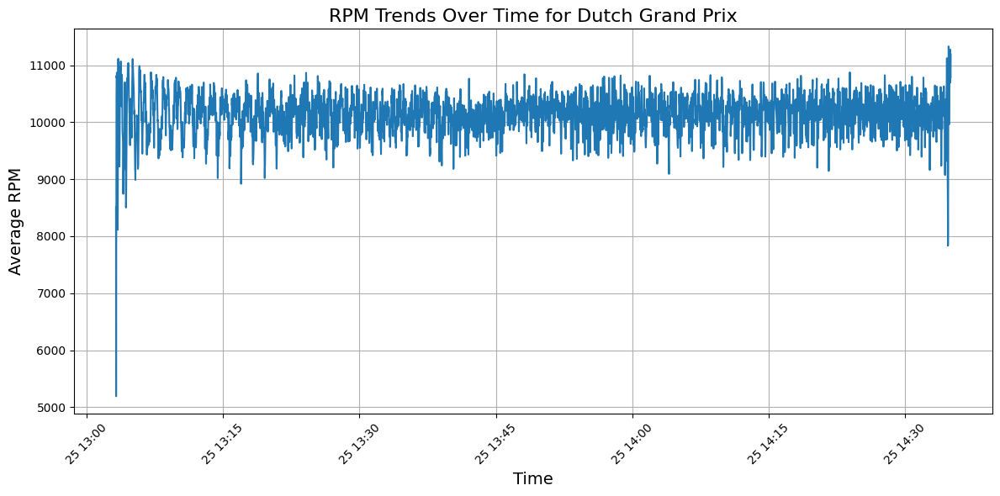

In [ ]:
for event in grouped_data['EventName'].unique():
    plt.figure(figsize=(12, 6))
    subset = grouped_data[grouped_data['EventName'] == event]
    plt.plot(subset['Date'], subset['RPM'], label=event)
    plt.title(f'RPM Trends Over Time for {event}', fontsize=16)
    plt.xlabel('Time', fontsize=14)
    plt.ylabel('Average RPM', fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid()
    plt.show()

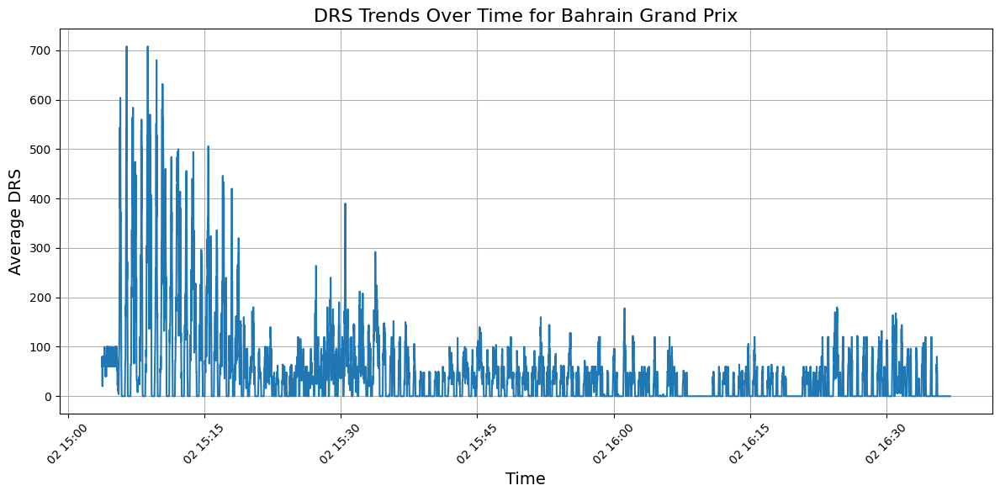

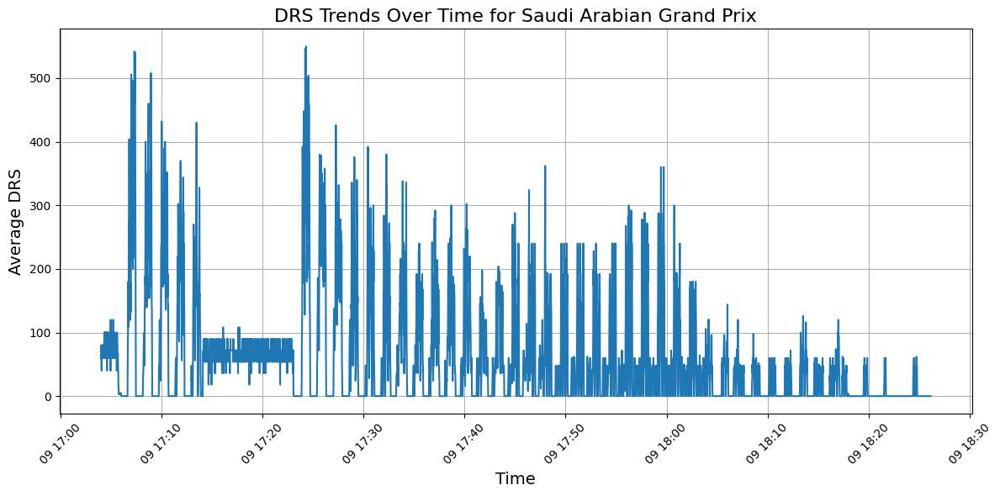

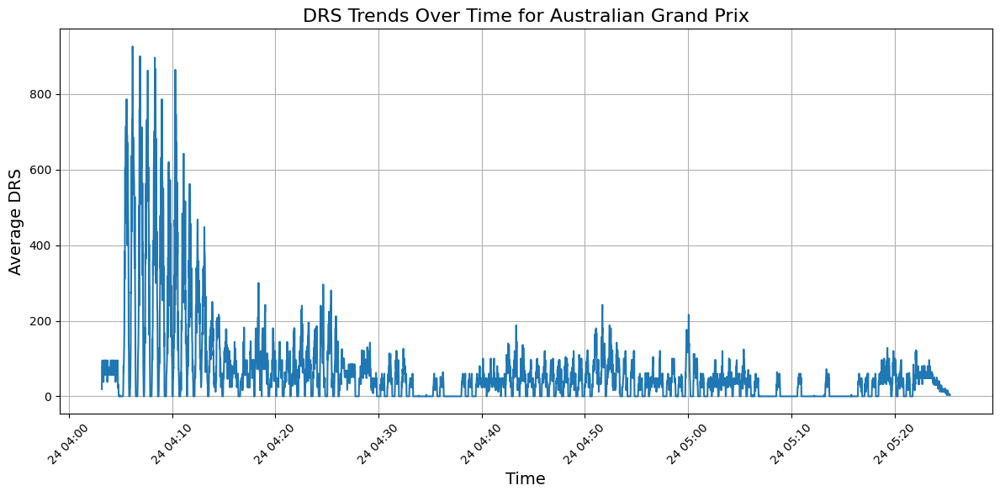

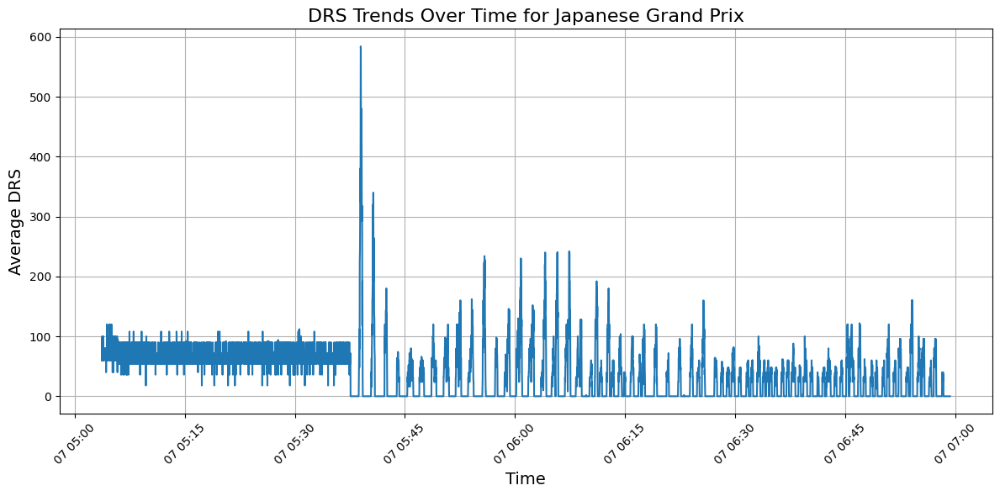

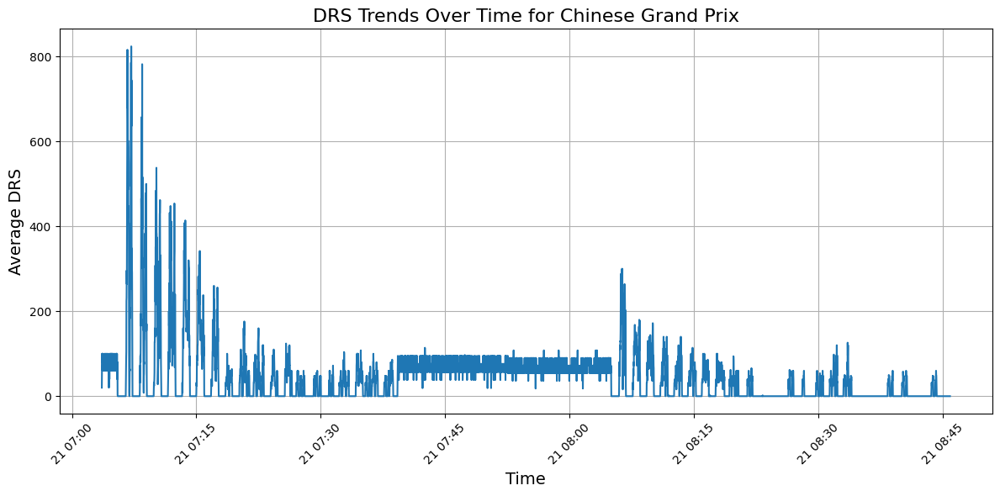

...

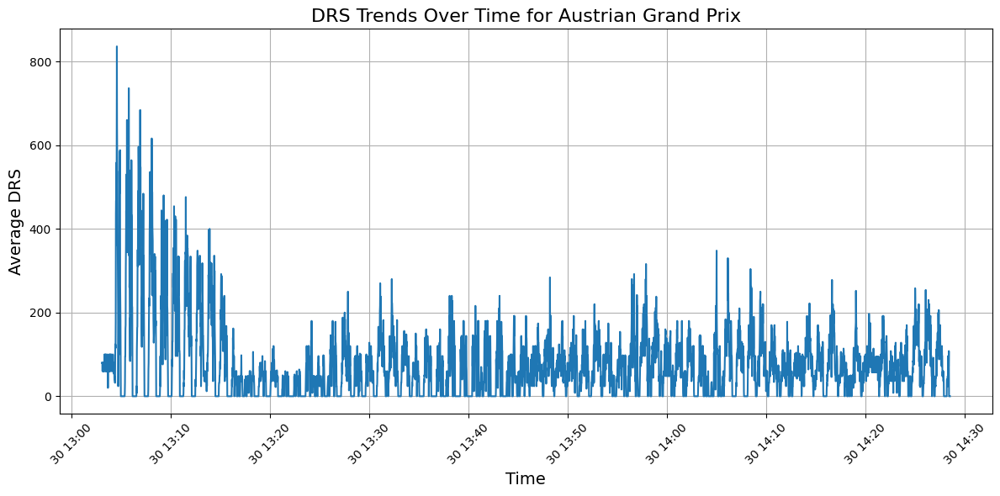

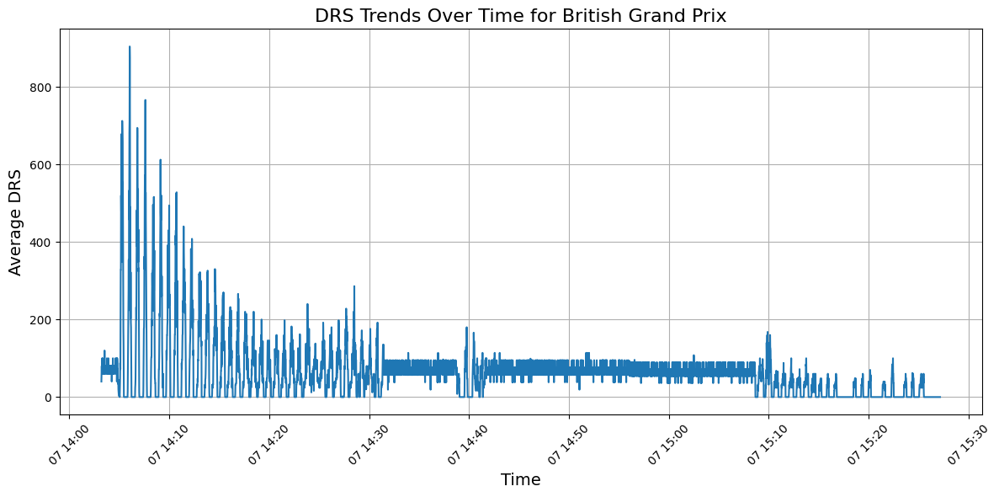

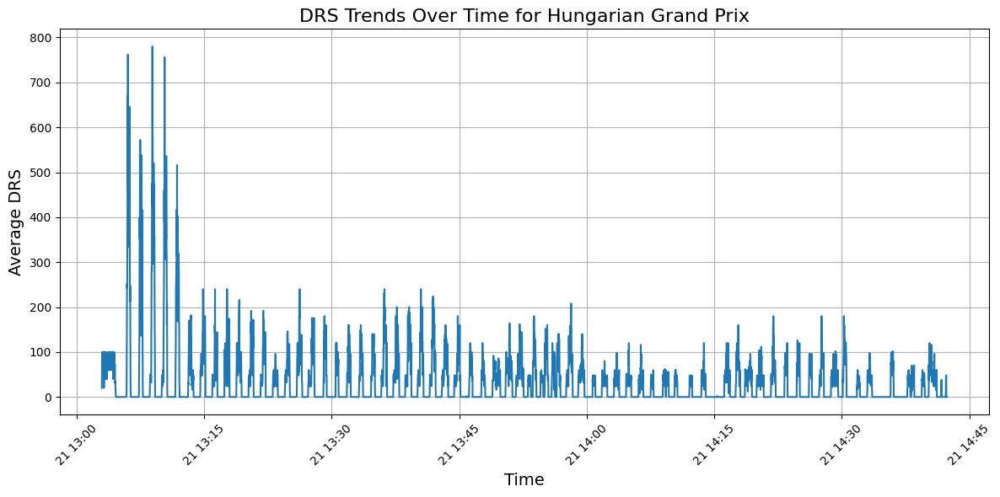

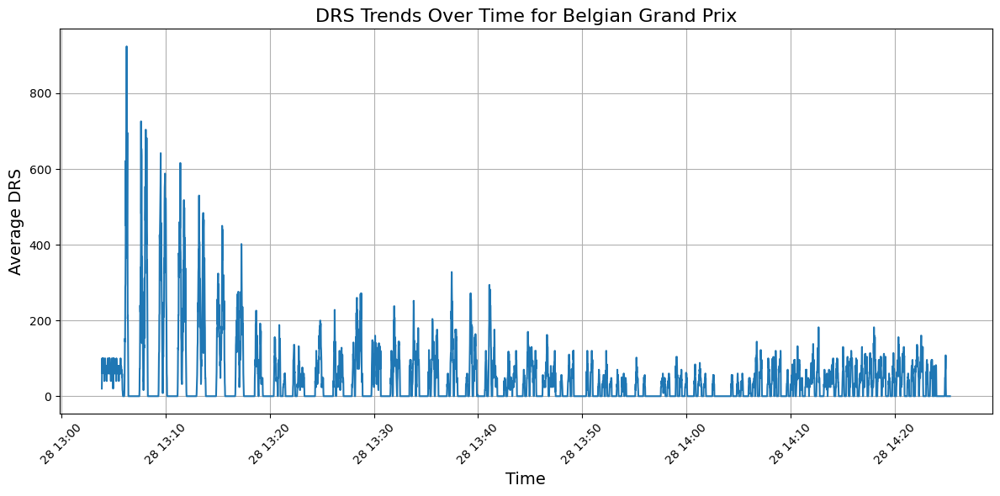

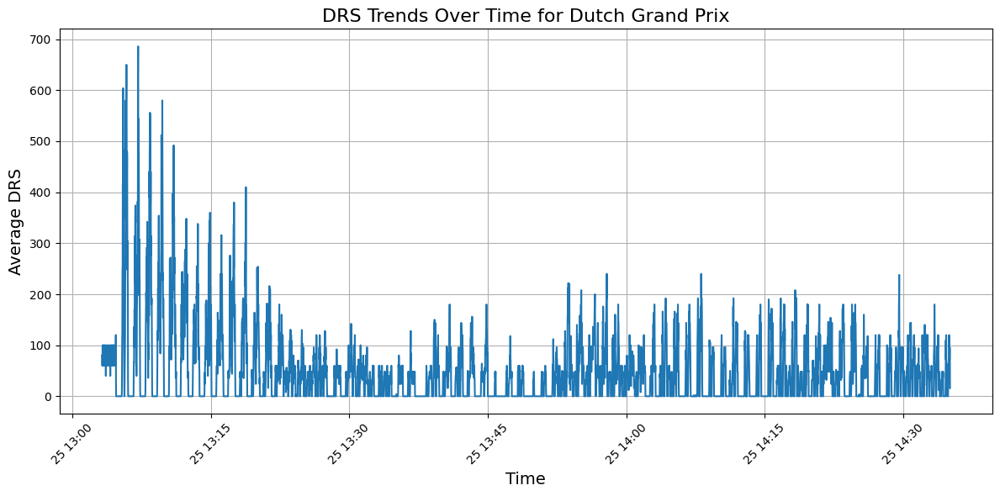

In [ ]:
for event in grouped_data['EventName'].unique():
    plt.figure(figsize=(12, 6))
    subset = grouped_data[grouped_data['EventName'] == event]
    plt.plot(subset['Date'], subset['DRS'], label=event)
    plt.title(f'DRS Trends Over Time for {event}', fontsize=16)
    plt.xlabel('Time', fontsize=14)
    plt.ylabel('Average DRS', fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid()
    plt.show()

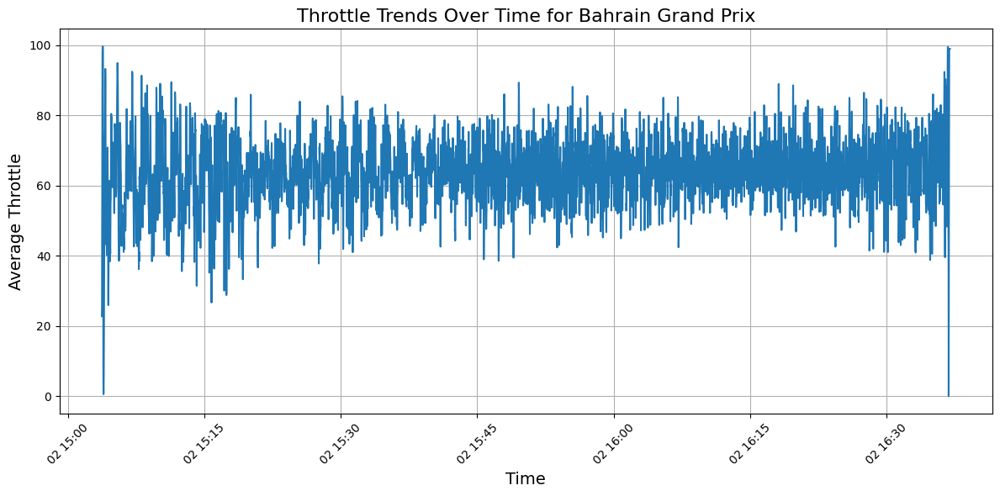

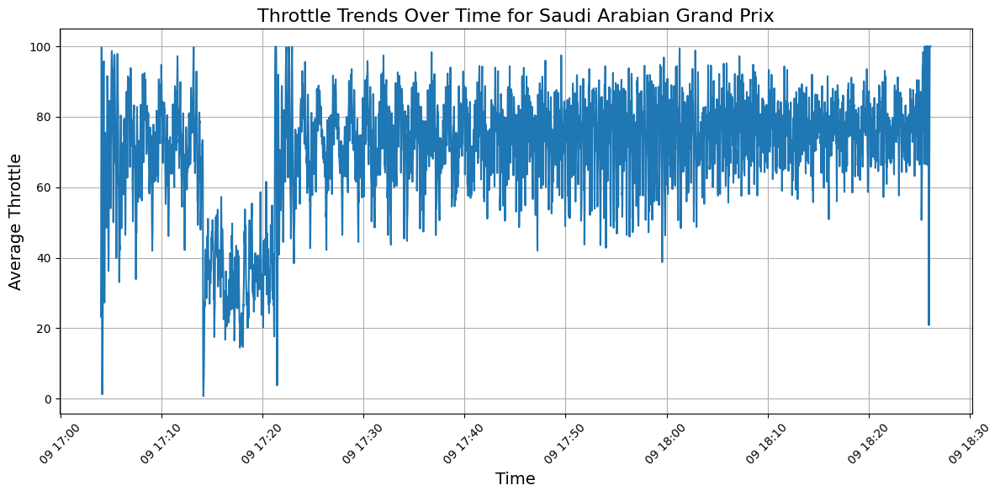

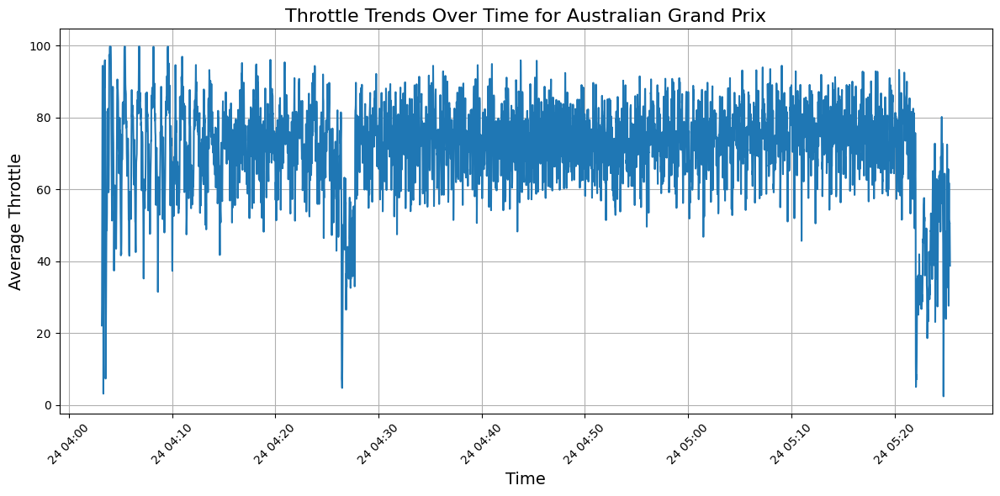

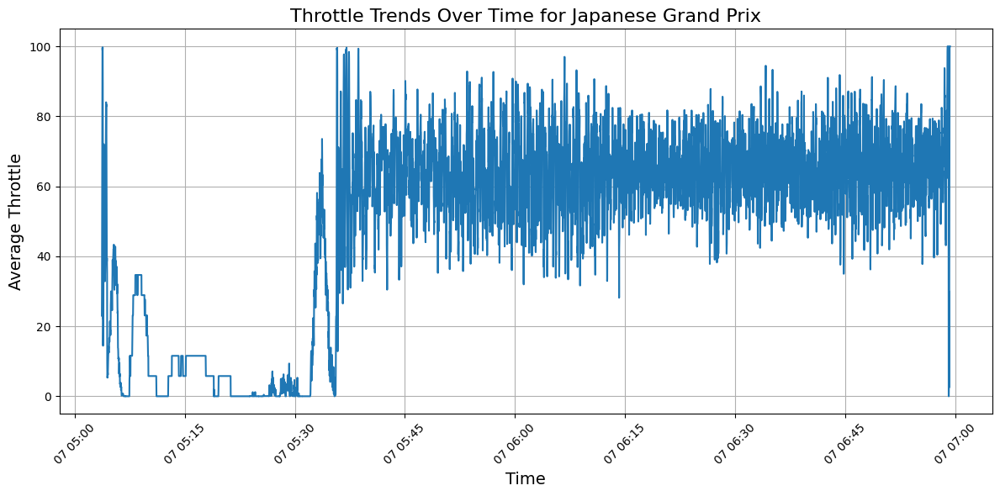

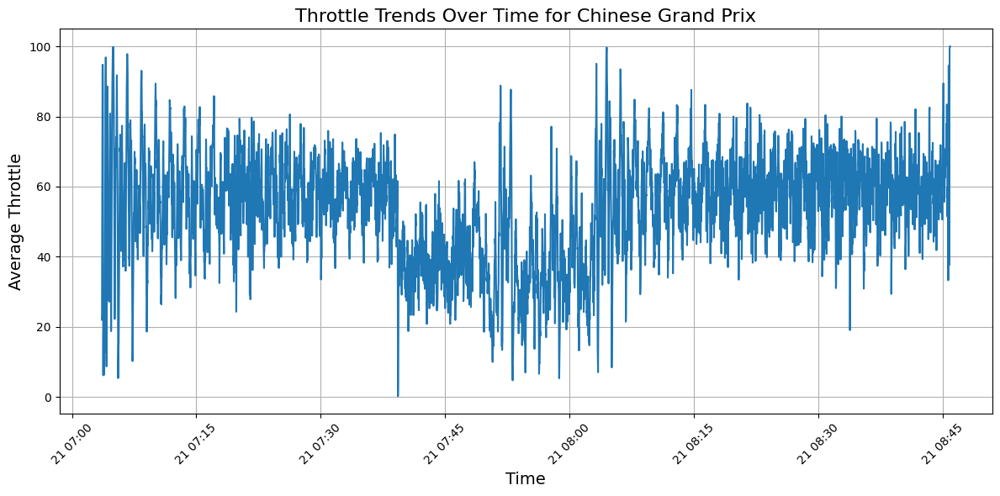

...

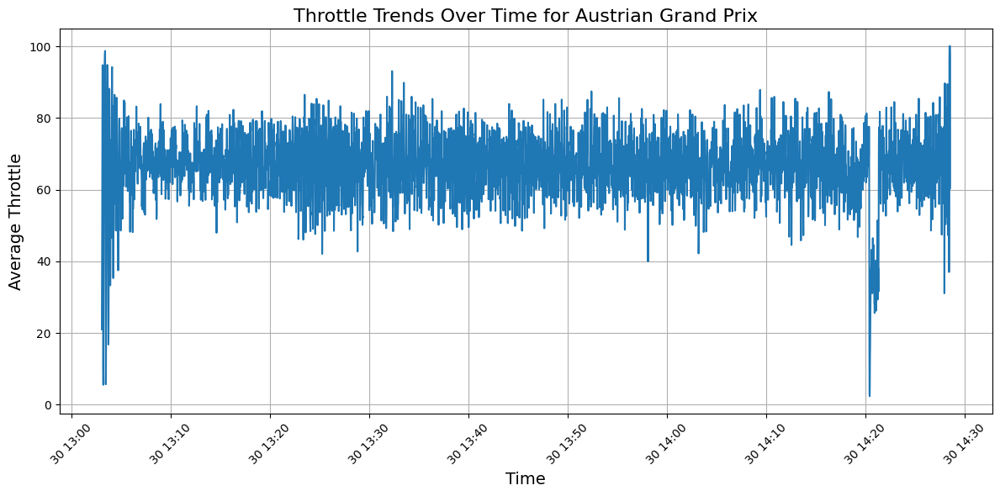

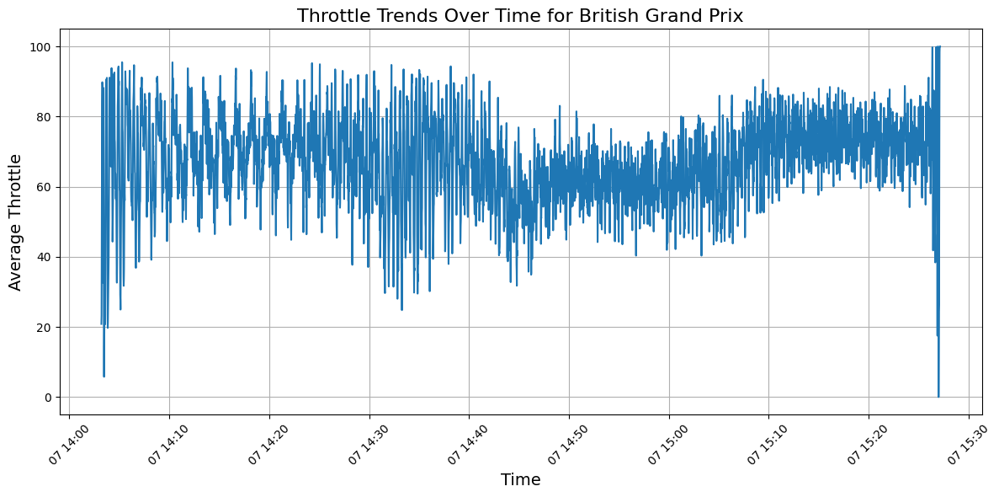

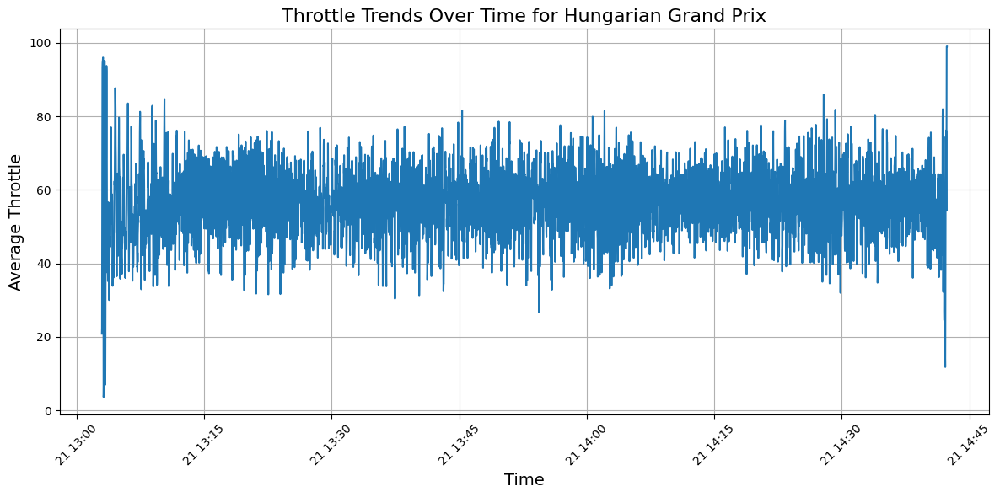

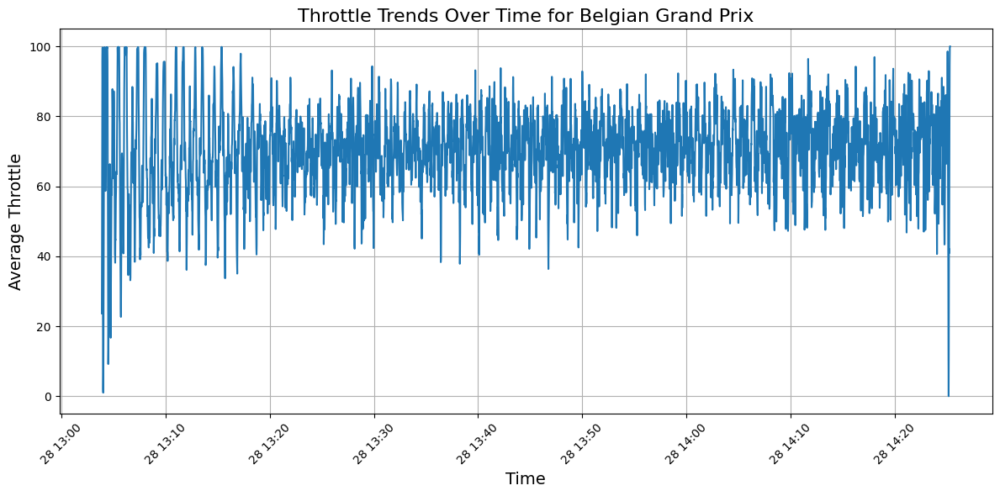

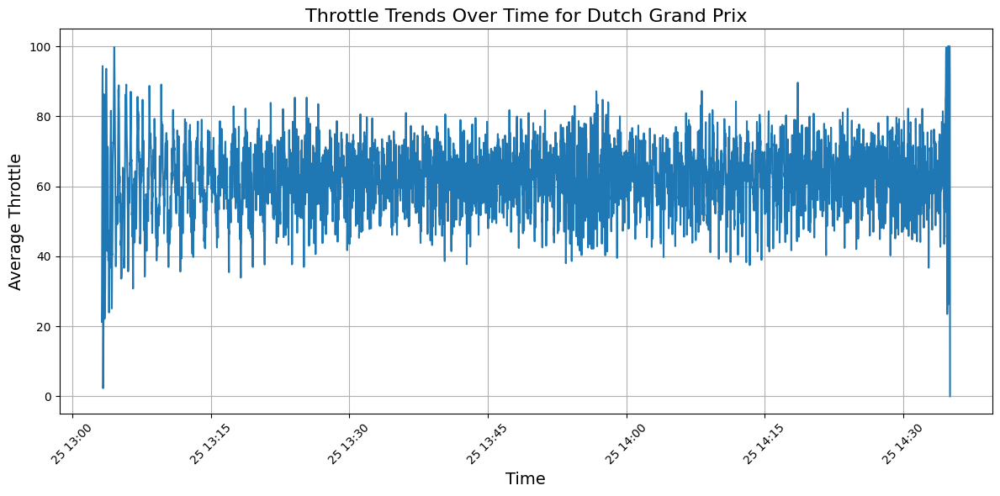

In [ ]:
for event in grouped_data['EventName'].unique():
    plt.figure(figsize=(12, 6))
    subset = grouped_data[grouped_data['EventName'] == event]
    plt.plot(subset['Date'], subset['Throttle'], label=event)
    plt.title(f'Throttle Trends Over Time for {event}', fontsize=16)
    plt.xlabel('Time', fontsize=14)
    plt.ylabel('Average Throttle', fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid()
    plt.show()

##### groupby event and date by Minute

In [ ]:
df= conver_to_datetime(df, ['Date'])

grouped_data = df.groupby([pd.Grouper(key='Date', freq='T'), 'EventName']).agg({
        'nGear': lambda x: len(x.unique()),
        'RPM': 'mean',
        'Throttle': 'mean',
        'DRS': 'sum',
        'Speed': 'mean'
        }, dropna=False).reset_index()



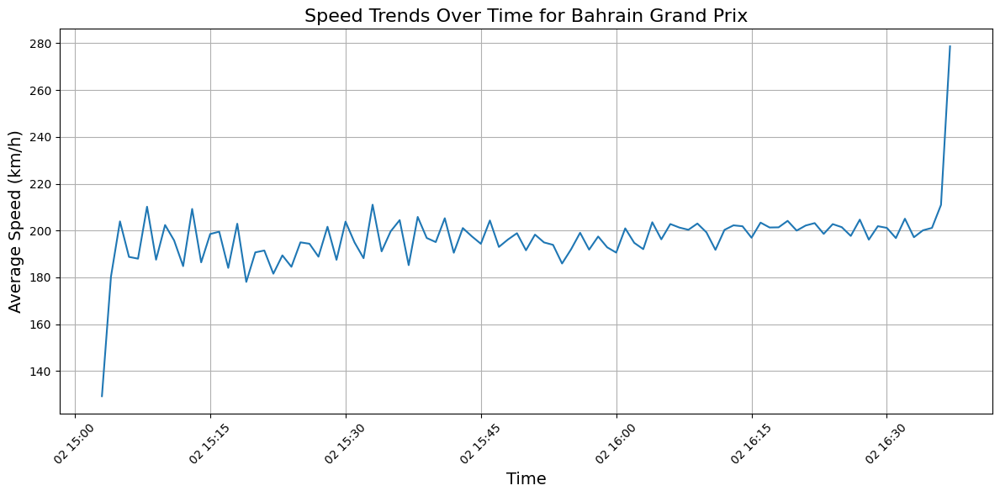

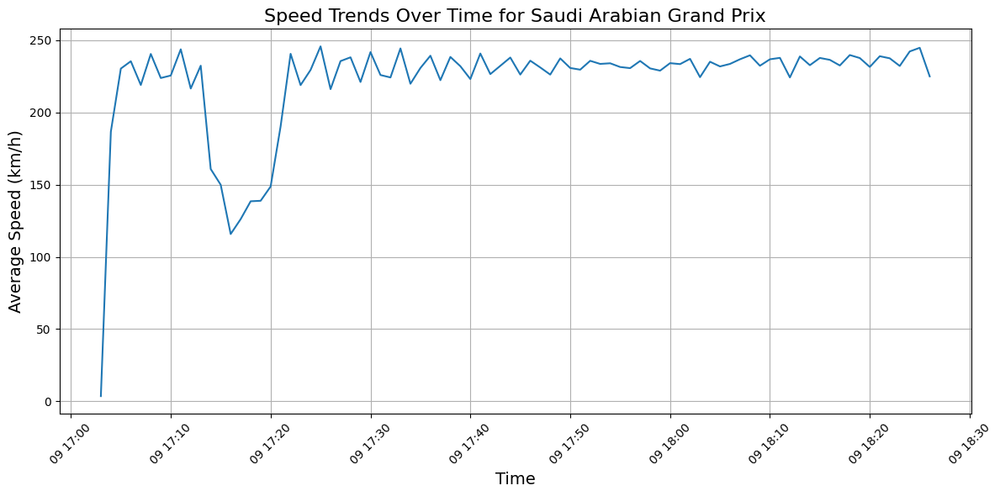

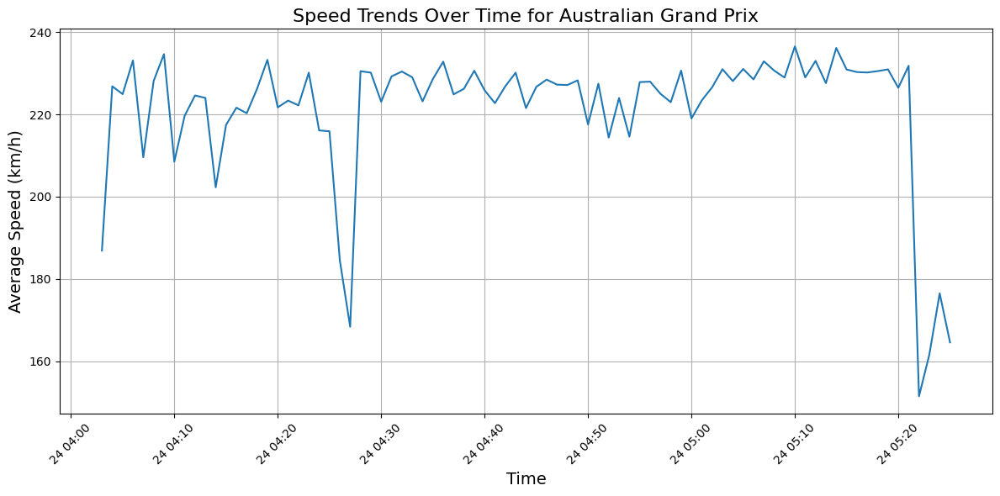

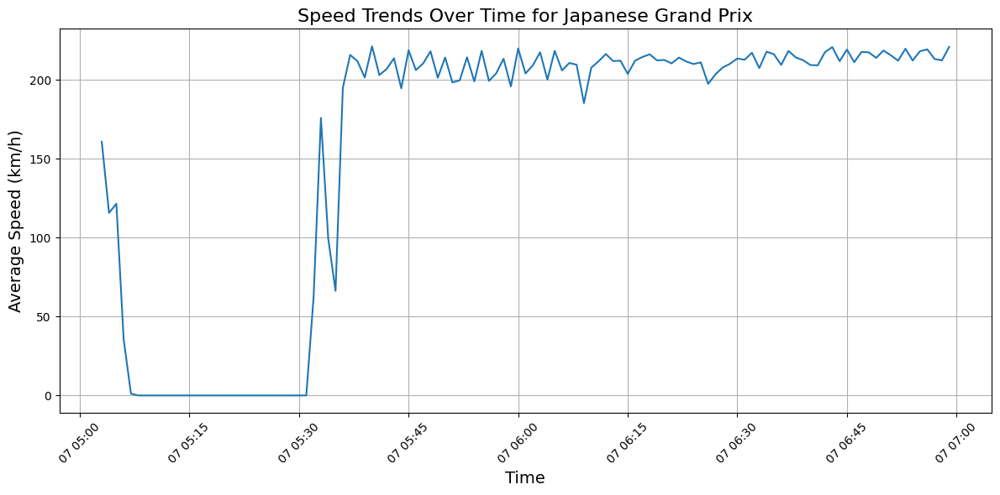

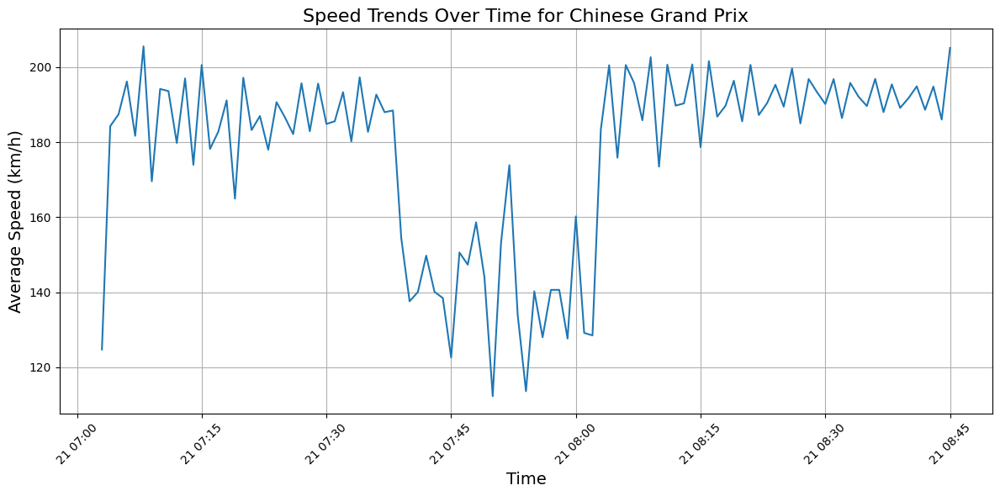

...

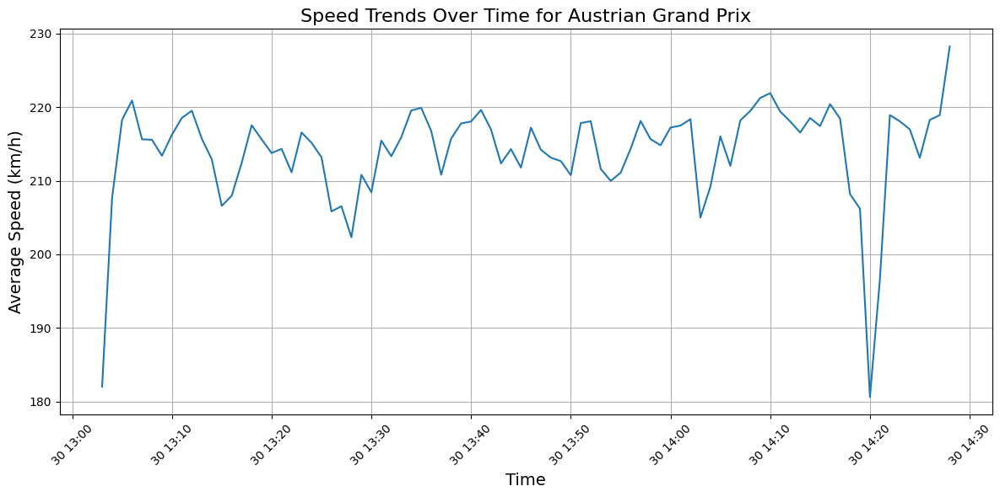

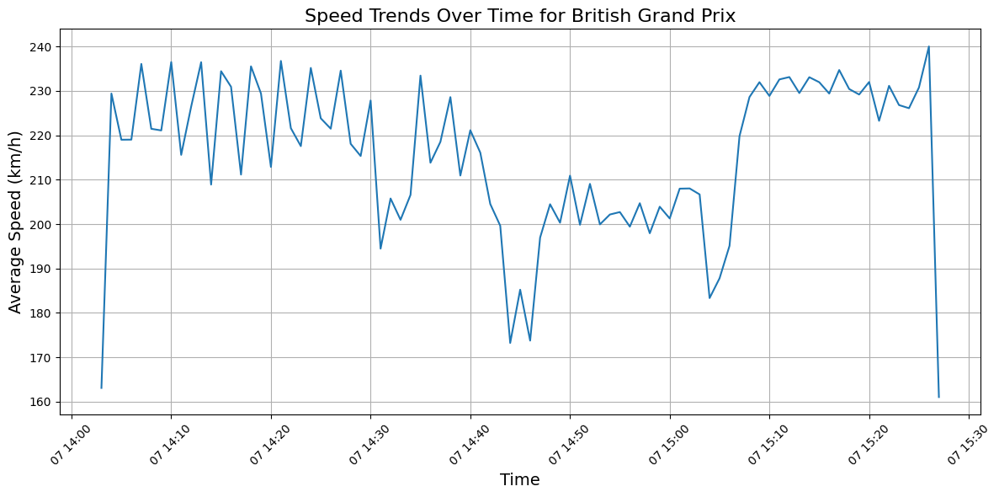

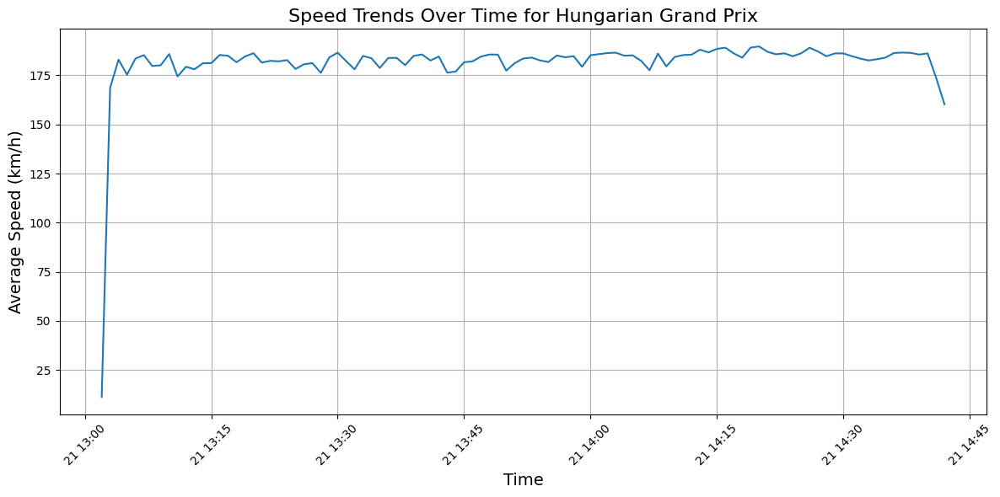

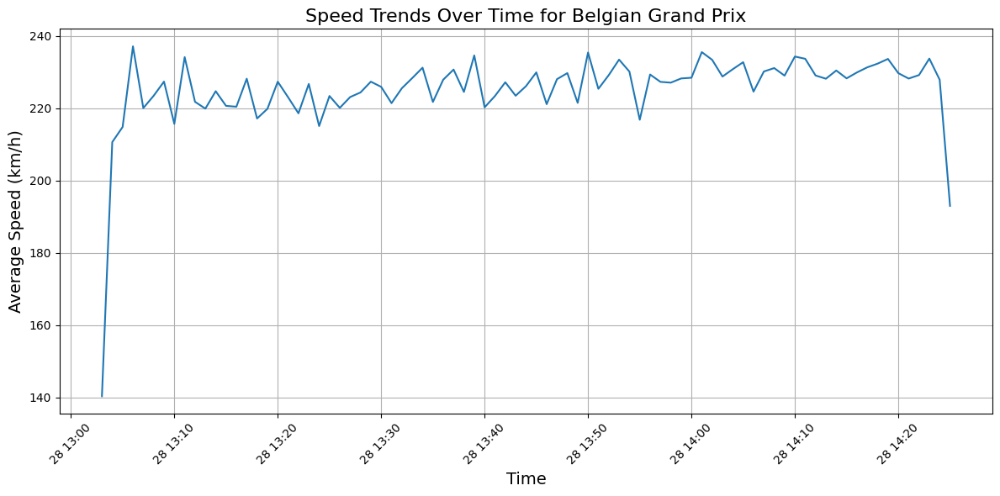

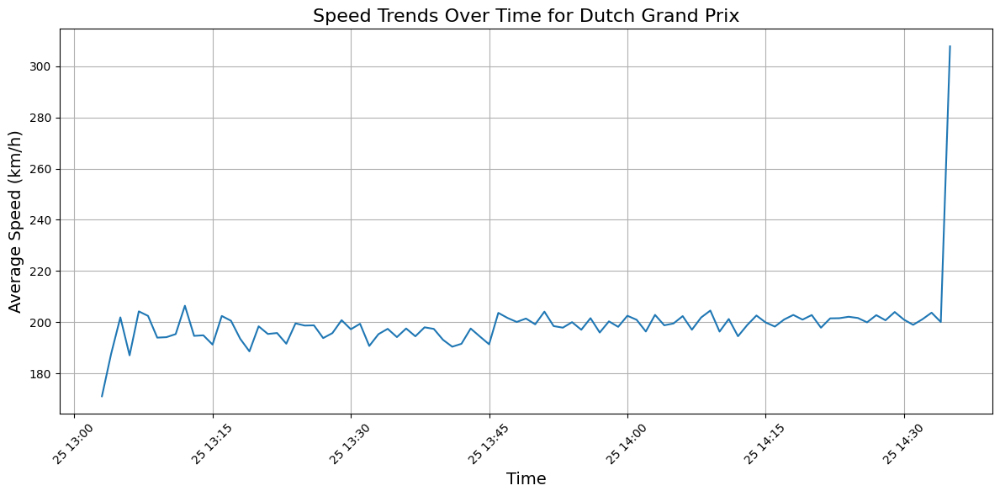

In [ ]:
import matplotlib.pyplot as plt


for event in grouped_data['EventName'].unique():
    plt.figure(figsize=(12, 6))

    subset = grouped_data[grouped_data['EventName'] == event]
    plt.plot(subset['Date'], subset['Speed'], label=event)
    plt.title(f'Speed Trends Over Time for {event}', fontsize=16)
    plt.xlabel('Time', fontsize=14)
    plt.ylabel('Average Speed (km/h)', fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid()
    plt.show()

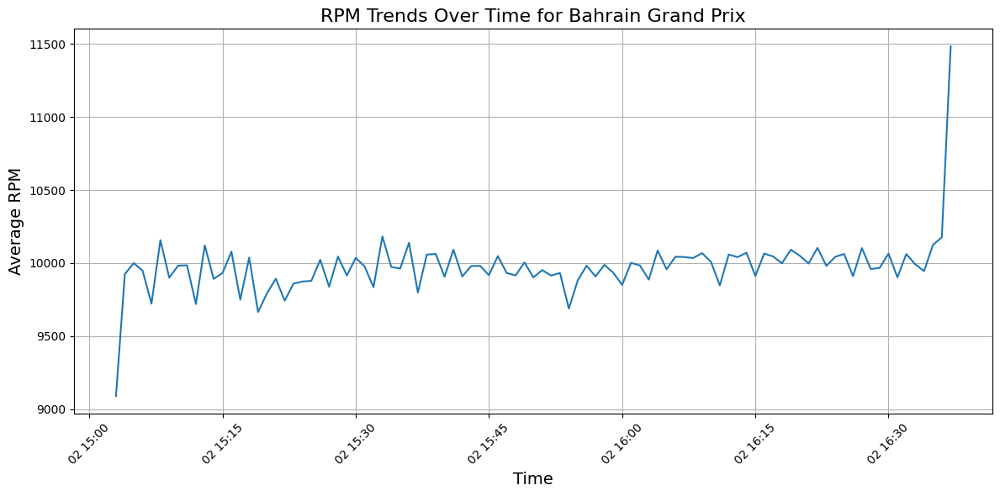

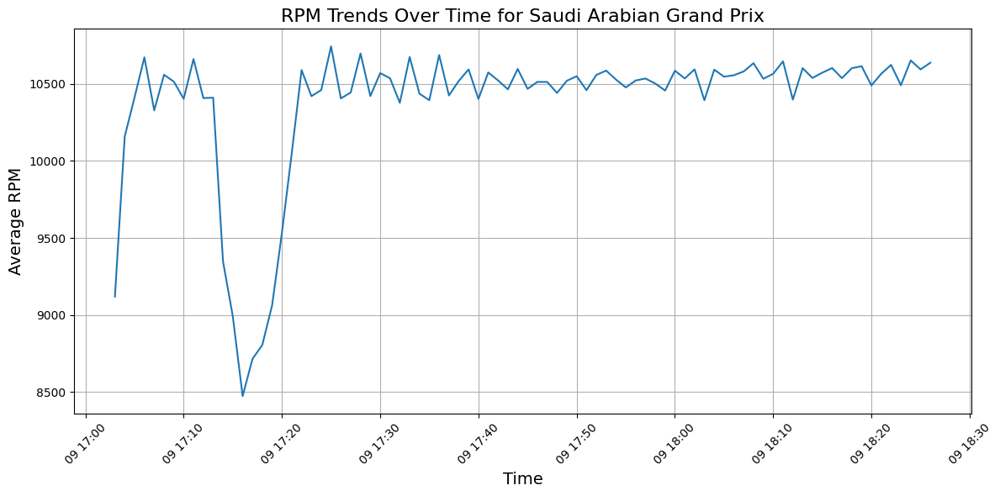

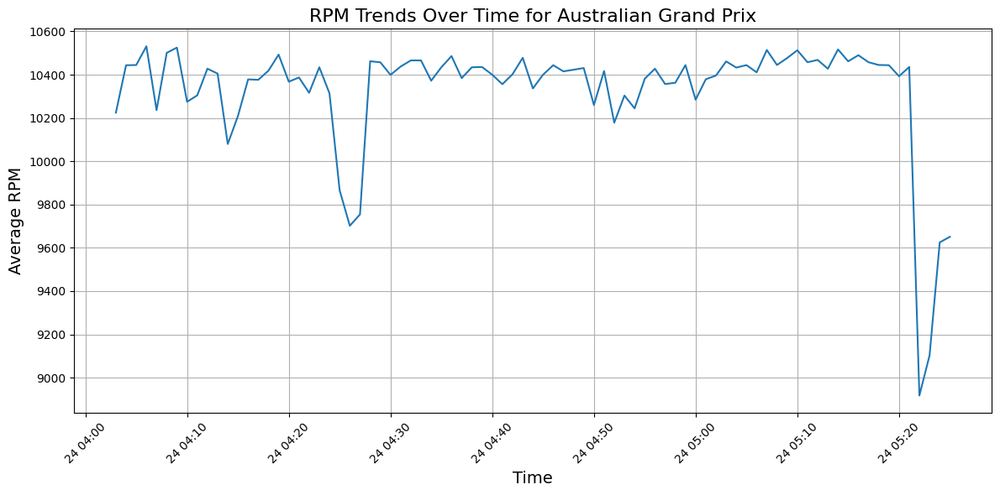

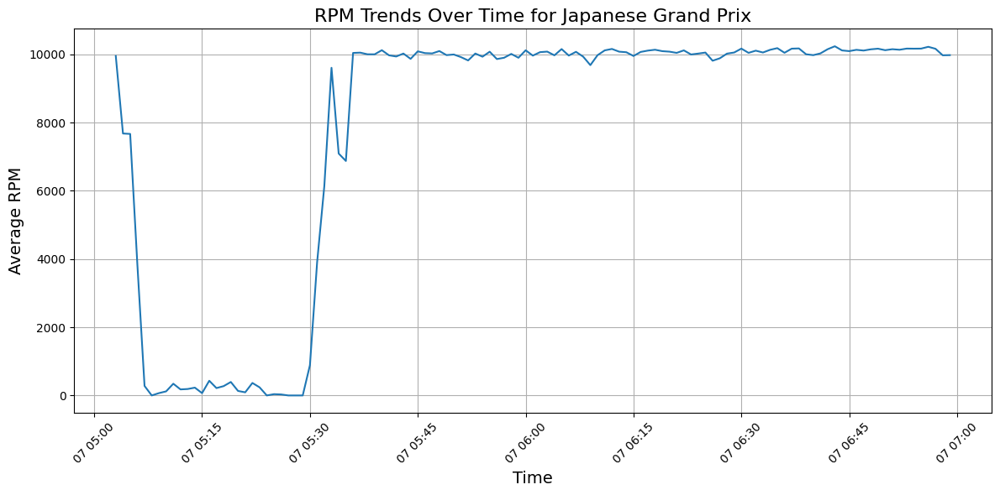

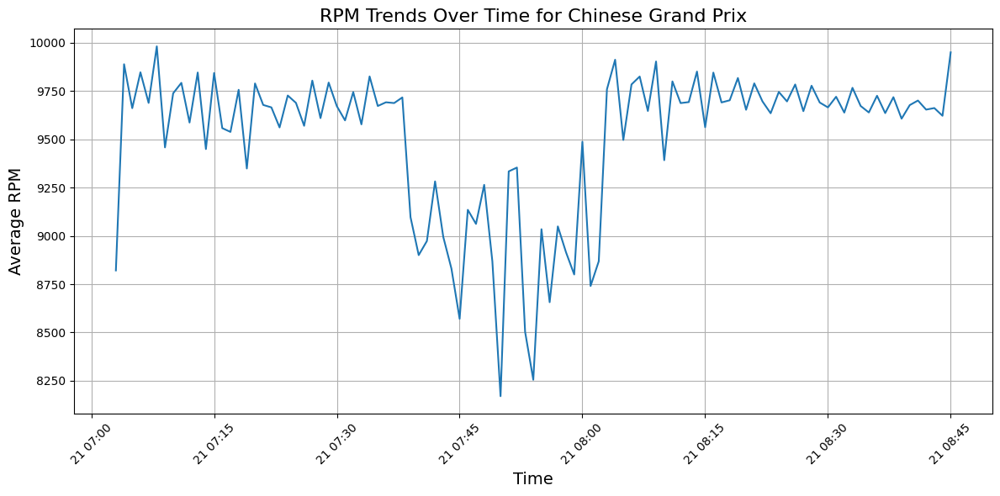

...

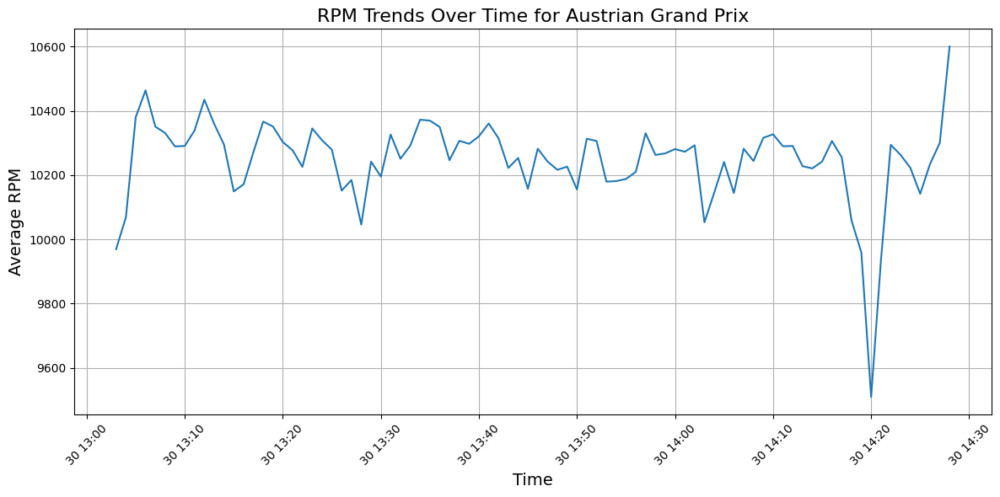

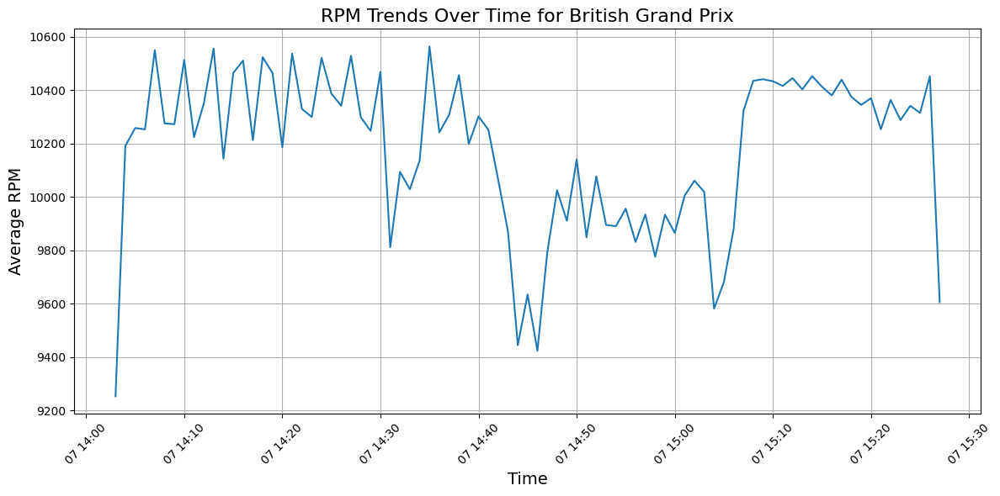

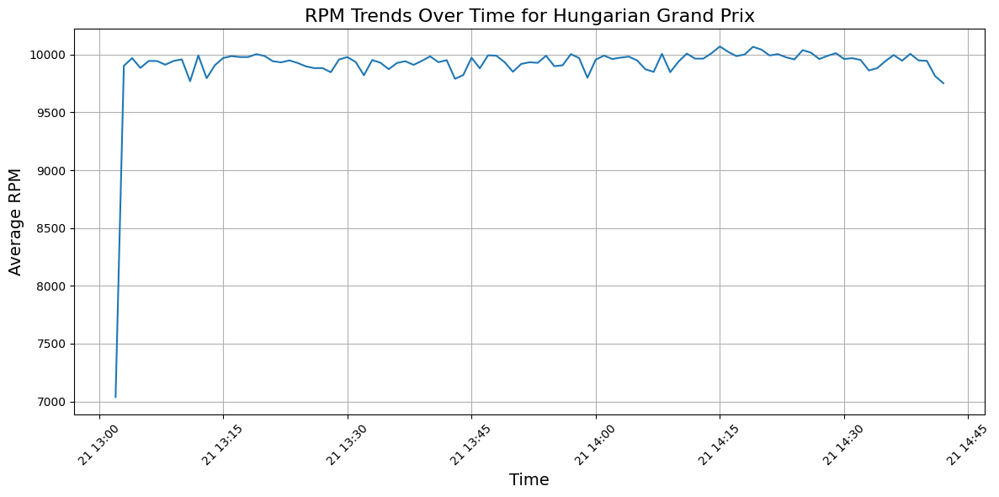

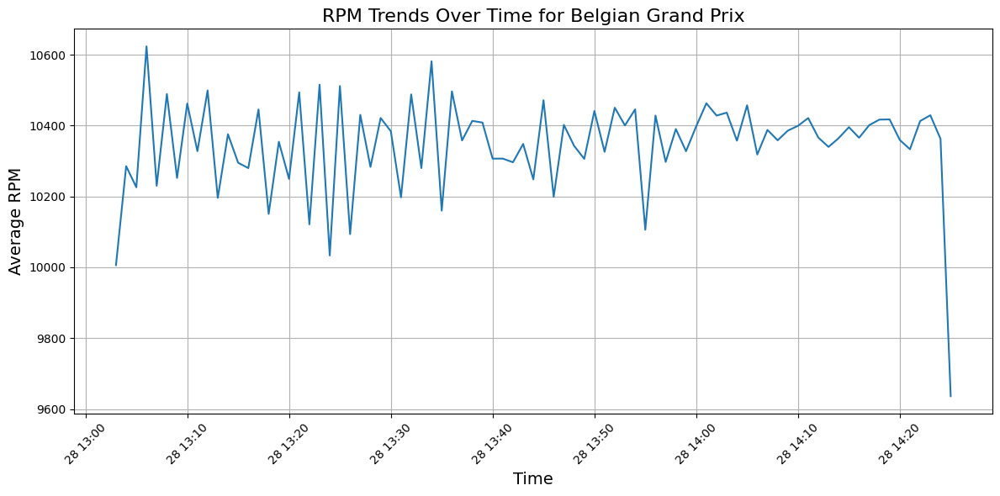

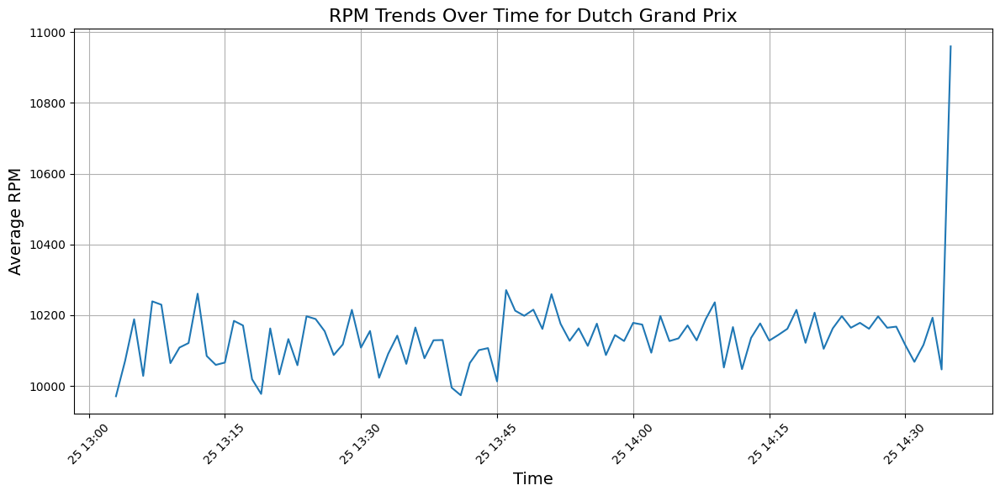

In [ ]:
for event in grouped_data['EventName'].unique():
    plt.figure(figsize=(12, 6))
    subset = grouped_data[grouped_data['EventName'] == event]
    plt.plot(subset['Date'], subset['RPM'], label=event)
    plt.title(f'RPM Trends Over Time for {event}', fontsize=16)
    plt.xlabel('Time', fontsize=14)
    plt.ylabel('Average RPM', fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid()
    plt.show()

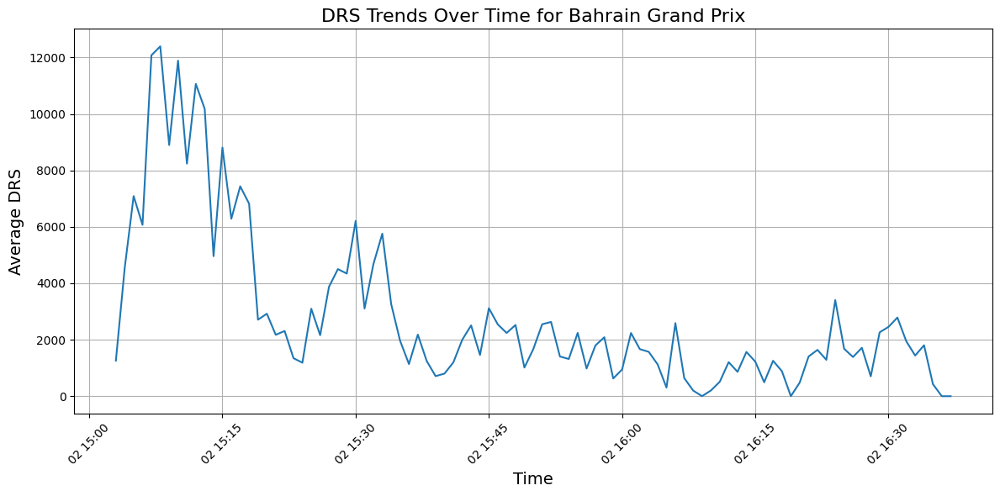

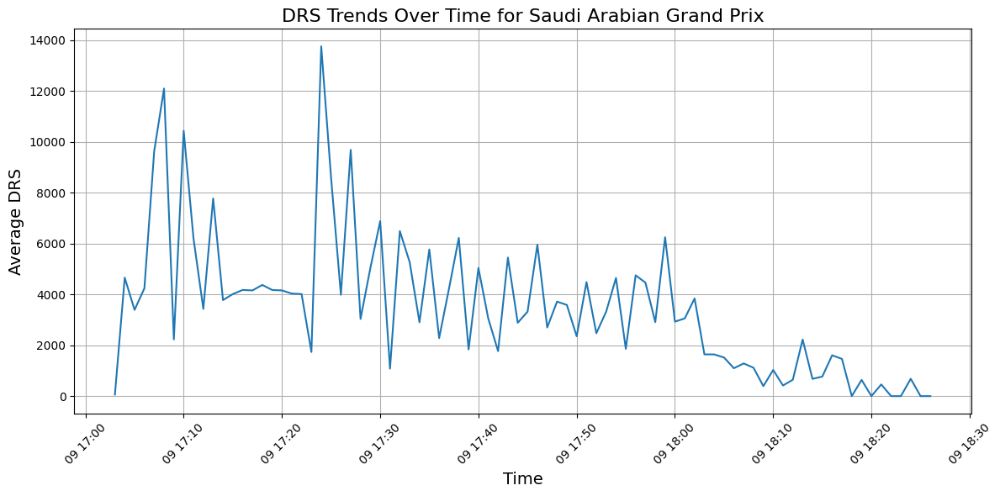

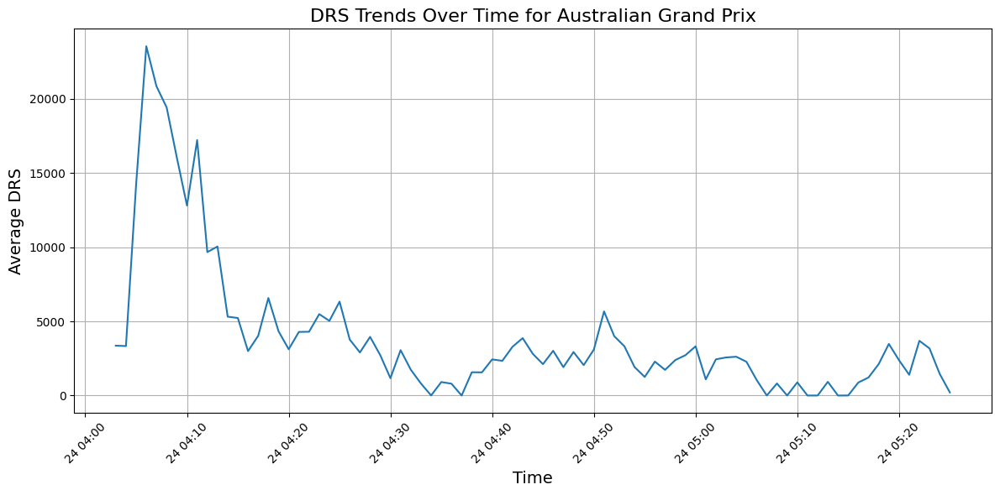

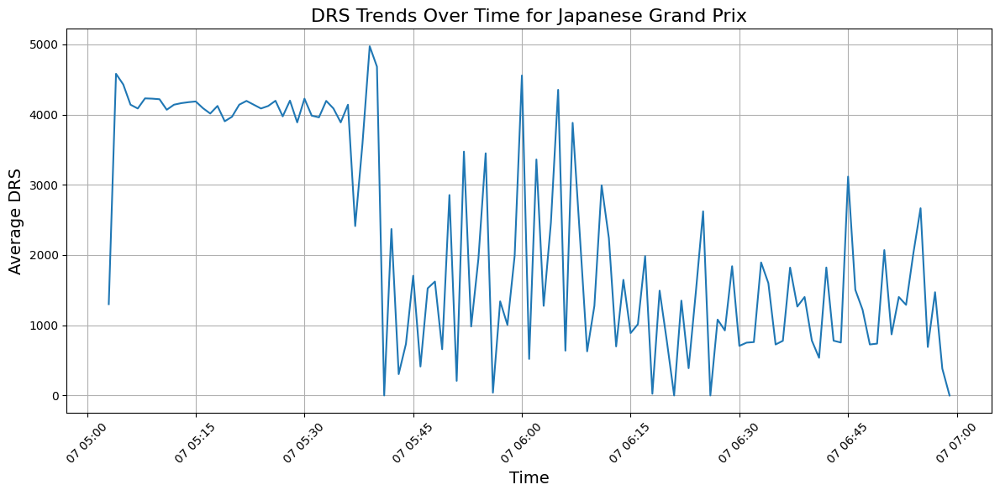

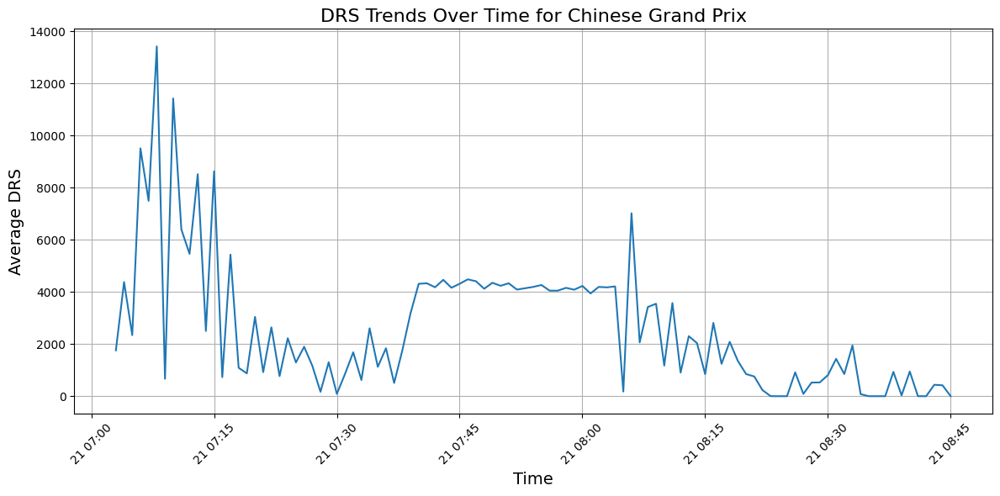

...

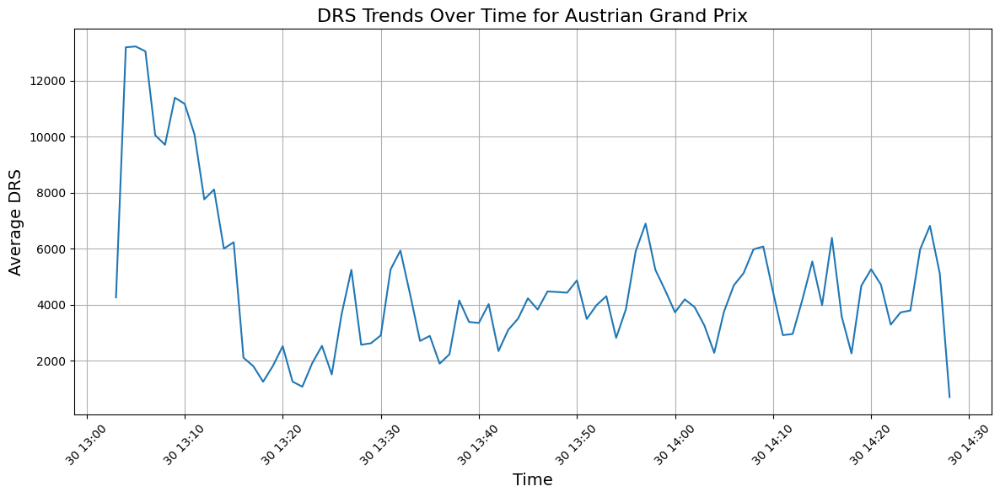

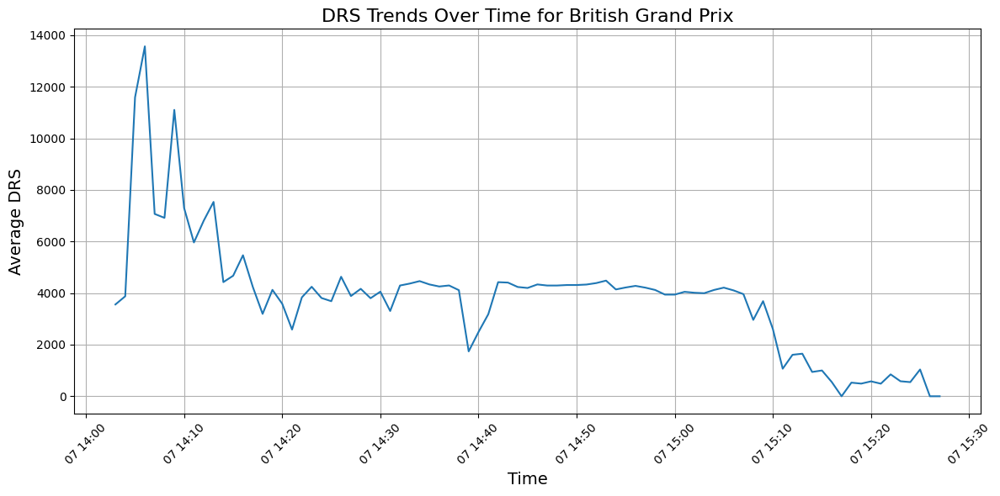

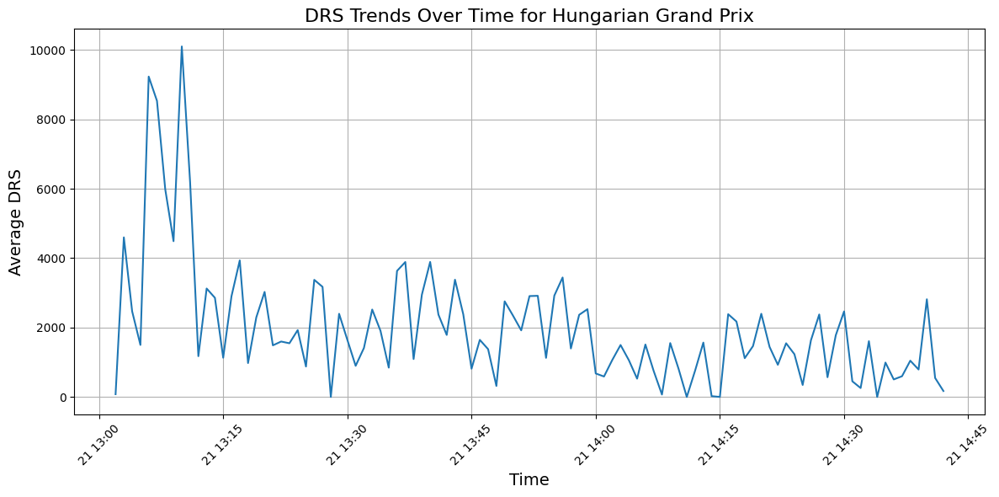

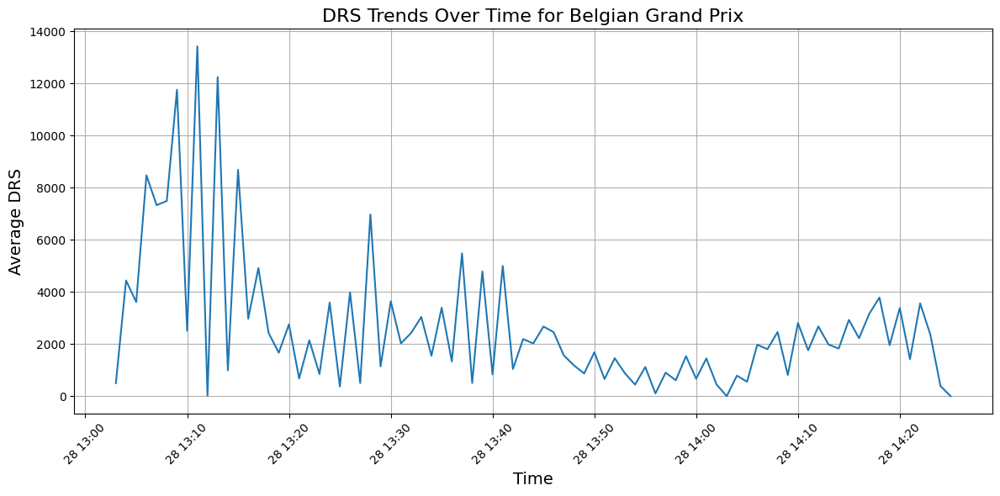

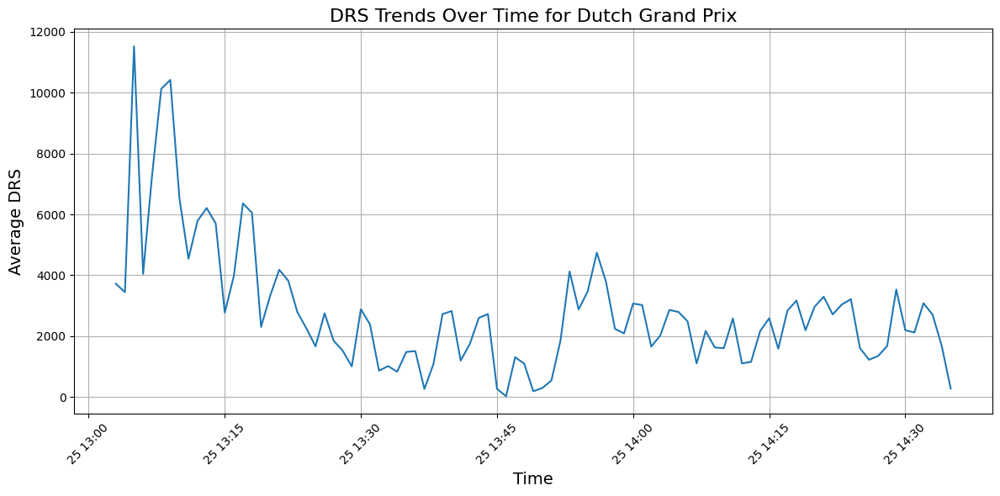

In [ ]:
for event in grouped_data['EventName'].unique():
    plt.figure(figsize=(12, 6))
    subset = grouped_data[grouped_data['EventName'] == event]
    plt.plot(subset['Date'], subset['DRS'], label=event)
    plt.title(f'DRS Trends Over Time for {event}', fontsize=16)
    plt.xlabel('Time', fontsize=14)
    plt.ylabel('Average DRS', fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid()
    plt.show()

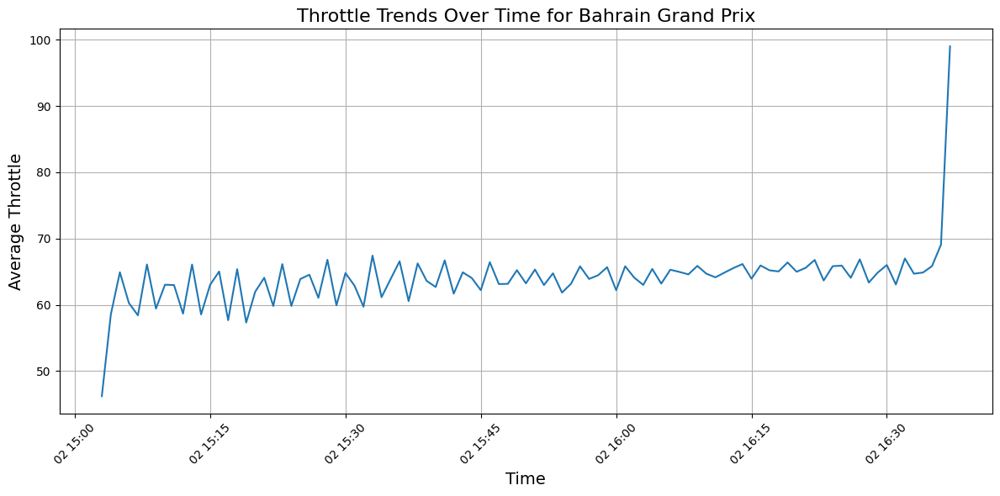

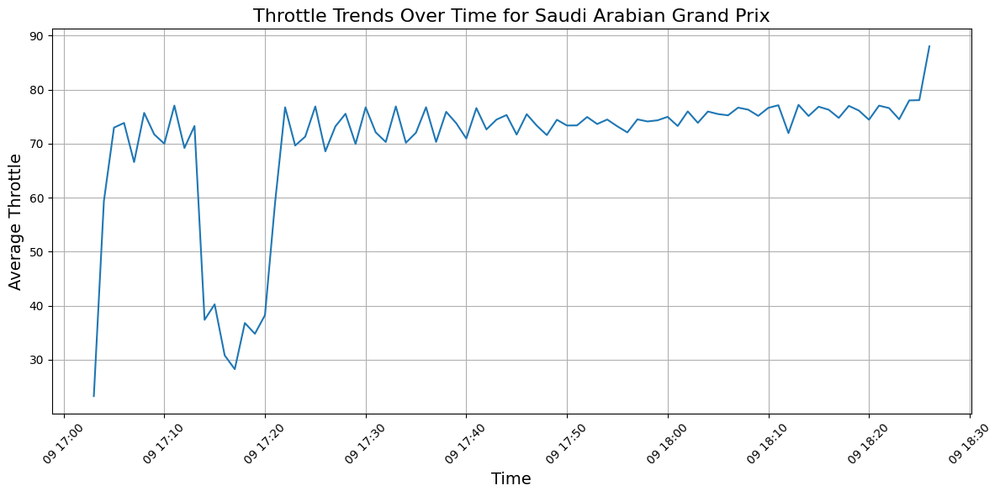

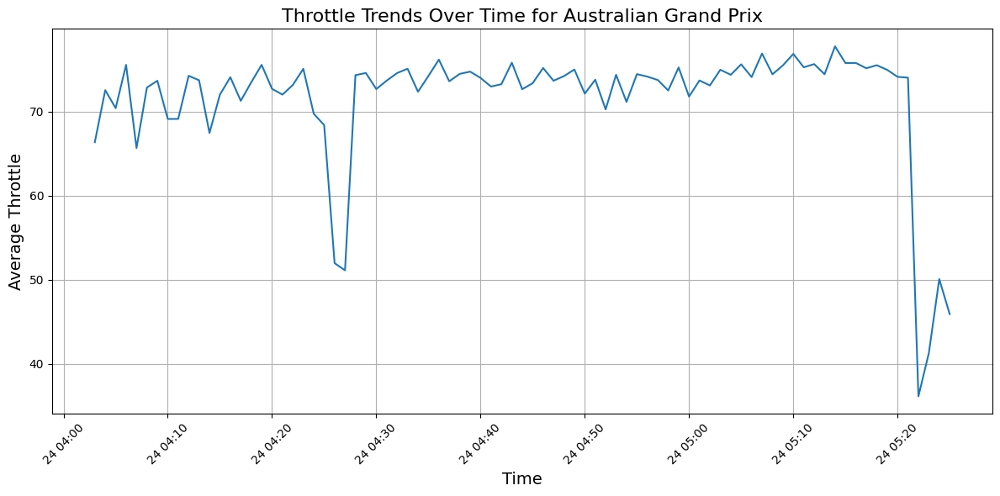

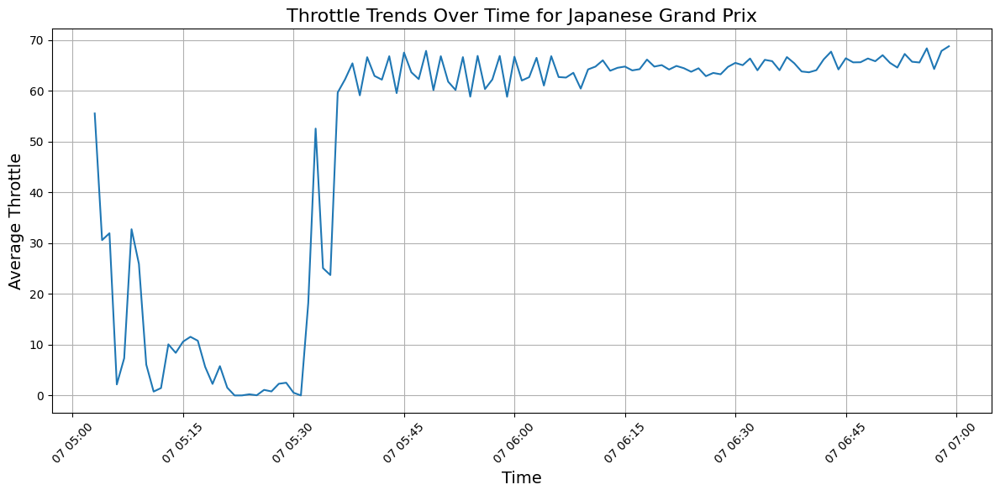

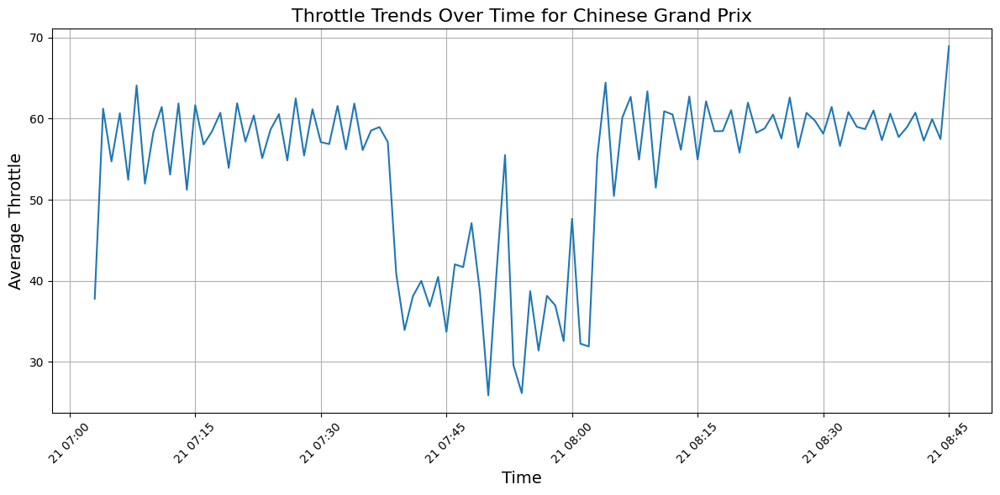

...

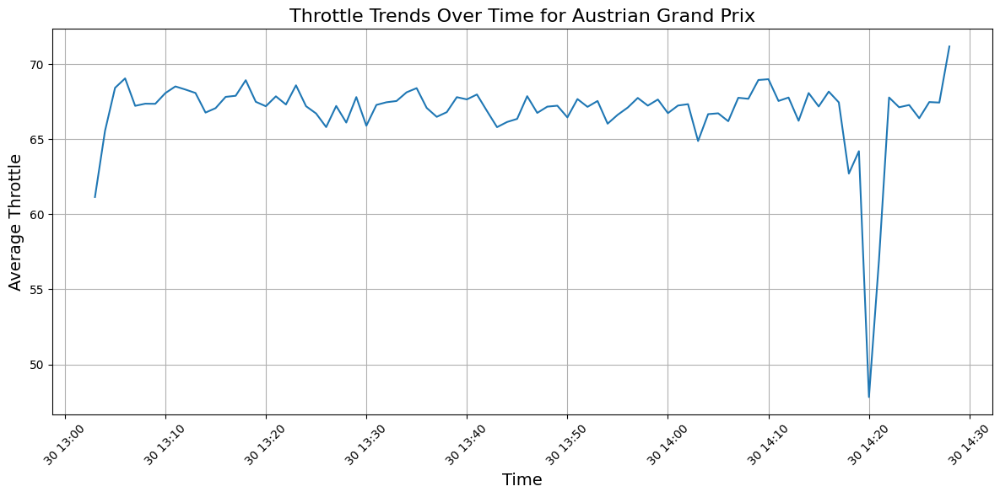

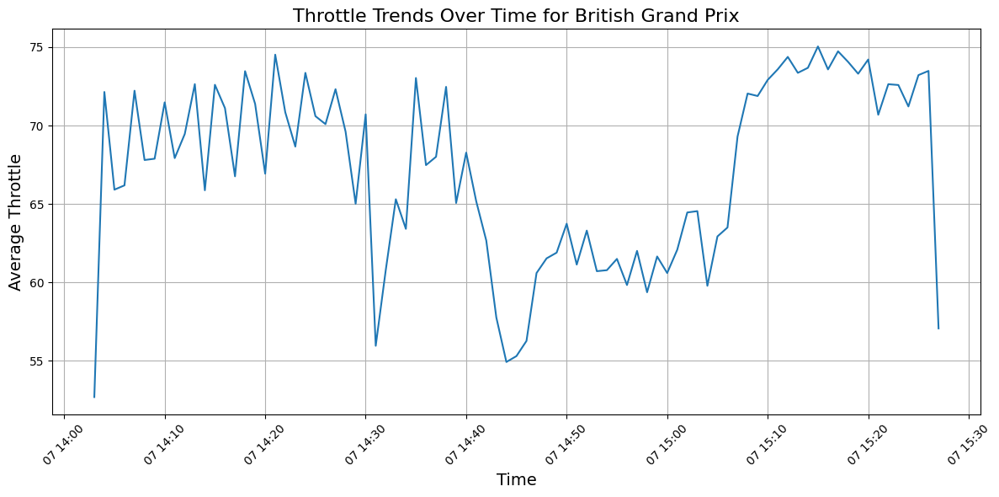

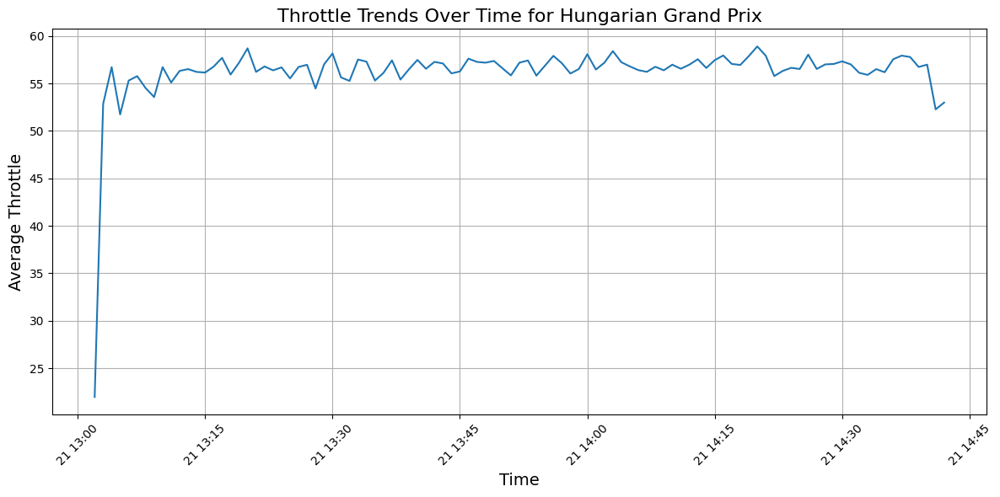

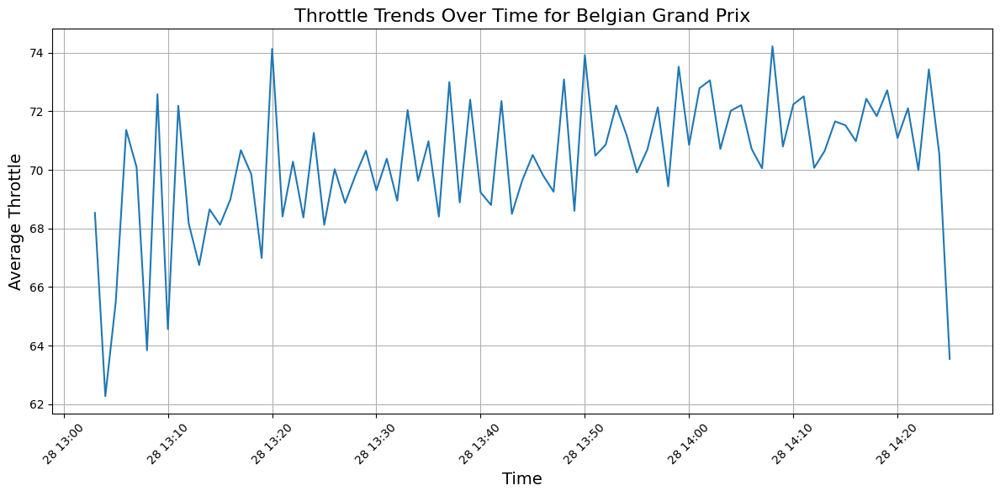

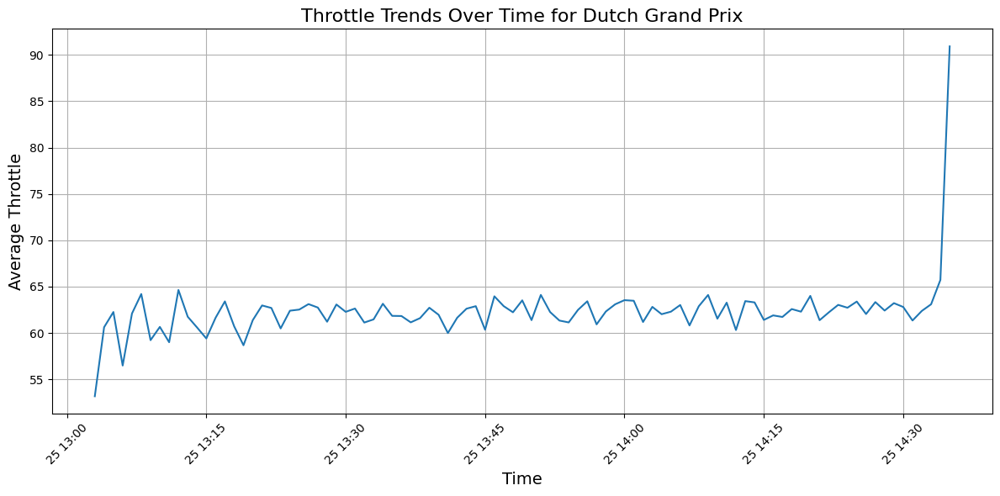

In [ ]:
for event in grouped_data['EventName'].unique():
    plt.figure(figsize=(12, 6))
    subset = grouped_data[grouped_data['EventName'] == event]
    plt.plot(subset['Date'], subset['Throttle'], label=event)
    plt.title(f'Throttle Trends Over Time for {event}', fontsize=16)
    plt.xlabel('Time', fontsize=14)
    plt.ylabel('Average Throttle', fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid()
    plt.show()

### **Result** 2024

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/formula-1/ocean_data_challenge_F1_data/races_2024/result_2024.csv')
df.head(5)

,EventName,DriverNumber,BroadcastName,Abbreviation,DriverId,TeamName,TeamColor,TeamId,FirstName,LastName,...,CountryCode,Position,ClassifiedPosition,GridPosition,Q1,Q2,Q3,Time,Status,Points
0,Bahrain Grand Prix,1,M VERSTAPPEN,VER,max_verstappen,Red Bull Racing,3671c6,red_bull,Max,Verstappen,...,NED,1.0,1,1.0,NaN,NaN,NaN,0 days 01:31:44.742000,Finished,26.0
1,Bahrain Grand Prix,11,S PEREZ,PER,perez,Red Bull Racing,3671c6,red_bull,Sergio,Perez,...,MEX,2.0,2,5.0,NaN,NaN,NaN,0 days 00:00:22.457000,Finished,18.0
2,Bahrain Grand Prix,55,C SAINZ,SAI,sainz,Ferrari,e8002d,ferrari,Carlos,Sainz,...,ESP,3.0,3,4.0,NaN,NaN,NaN,0 days 00:00:25.110000,Finished,15.0
3,Bahrain Grand Prix,16,C LECLERC,LEC,leclerc,Ferrari,e8002d,ferrari,Charles,Leclerc,...,MON,4.0,4,2.0,NaN,NaN,NaN,0 days 00:00:39.669000,Finished,12.0
4,Bahrain Grand Prix,63,G RUSSELL,RUS,russell,Mercedes,27f4d2,mercedes,George,Russell,...,GBR,5.0,5,3.0,NaN,NaN,NaN,0 days 00:00:46.788000,Finished,10.0


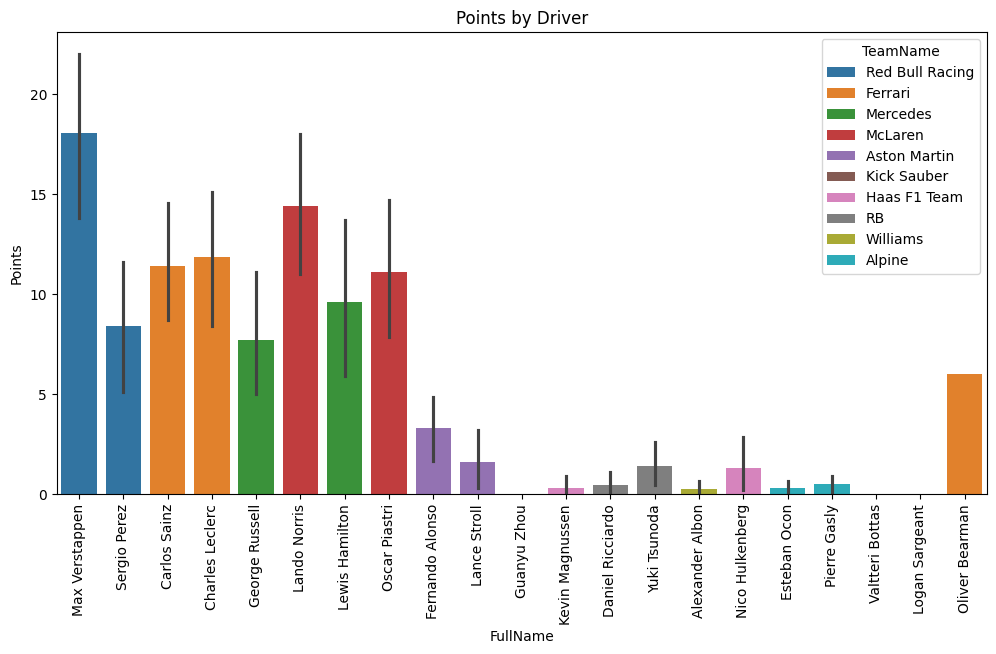

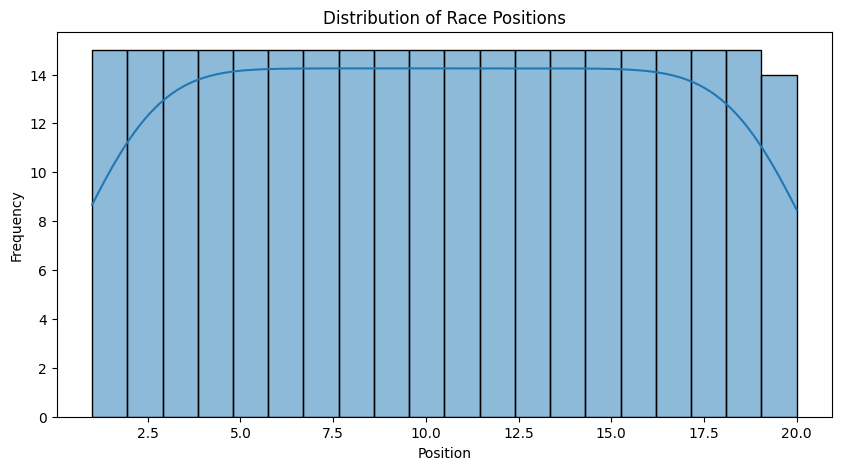

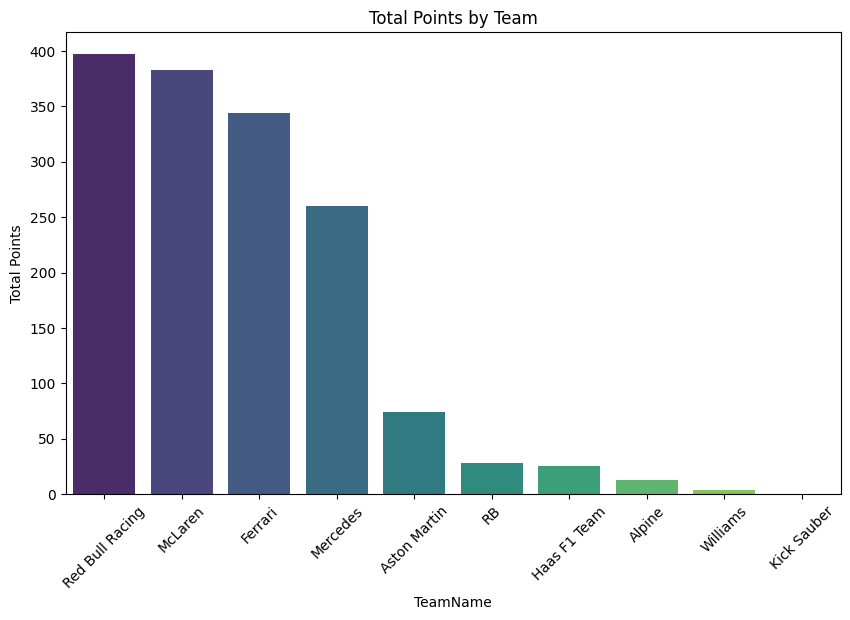

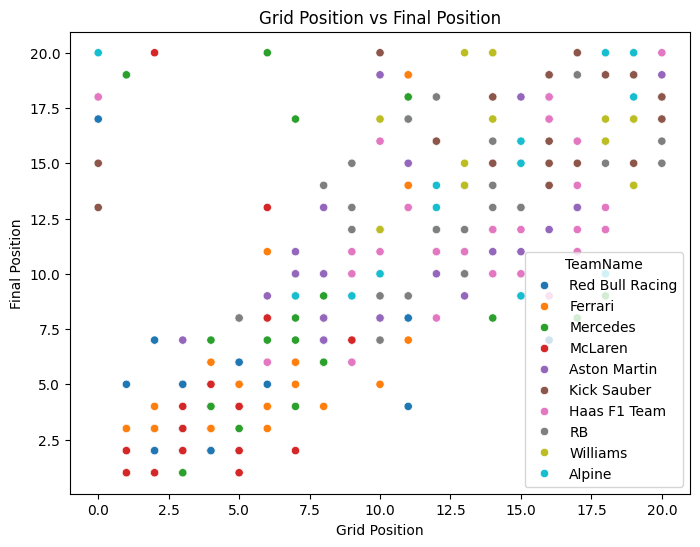

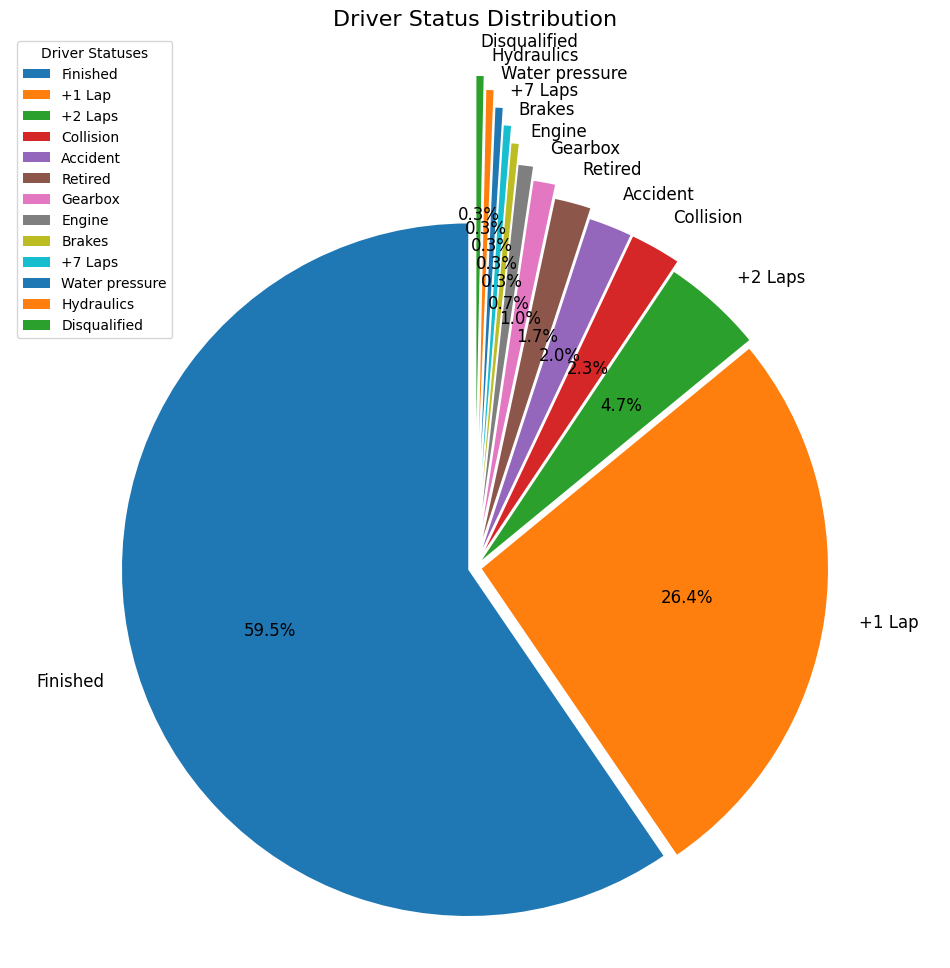

In [ ]:
data = df.copy()
# Bar plot of points by driver
plt.figure(figsize=(12, 6))
sns.barplot(data=data, x='FullName', y='Points', hue='TeamName', dodge=False)
plt.title('Points by Driver')
plt.xticks(rotation=90)
plt.ylabel('Points')
plt.show()

# Distribution of positions
plt.figure(figsize=(10, 5))
sns.histplot(data['Position'], bins=20, kde=True)
plt.title('Distribution of Race Positions')
plt.xlabel('Position')
plt.ylabel('Frequency')
plt.show()

# **3. Team Performance Analysis**
team_performance = data.groupby('TeamName')['Points'].sum().reset_index()
team_performance = team_performance.sort_values(by='Points', ascending=False)

# Bar plot for team performance
plt.figure(figsize=(10, 6))
sns.barplot(data=team_performance, x='TeamName', y='Points', palette='viridis')
plt.title('Total Points by Team')
plt.xticks(rotation=45)
plt.ylabel('Total Points')
plt.show()

# **4. Qualifying Analysis**
# Since Q1, Q2, Q3 have no data, skip this part or handle if data is available

# **5. Grid vs Final Position**
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data, x='GridPosition', y='Position', hue='TeamName')
plt.title('Grid Position vs Final Position')
plt.xlabel('Grid Position')
plt.ylabel('Final Position')
plt.show()

# **6. Driver Status Analysis**
status_counts = data['Status'].value_counts()

plt.figure(figsize=(12, 12))
explode = (0.02, 0.02, 0.03, 0.06, 0.06, 0.09 , 0.13, 0.17, 0.23, 0.28, 0.33, 0.38 , 0.42)
plt.pie(status_counts,
        autopct='%1.1f%%',
        startangle=90,
        explode=explode,
        shadow=False,
        labels=status_counts.index,
        textprops={'fontsize': 12}
        )

plt.title('Driver Status Distribution', fontsize=16)
plt.ylabel('')
plt.legend(title='Driver Statuses', loc='upper left')
plt.axis('equal')
plt.show()

In [ ]:
status_counts = data['Status'].value_counts()
(status_counts)

,count
Status,
Finished,178
+1 Lap,79
+2 Laps,14
Collision,7
Accident,6
Retired,5
Gearbox,3
Engine,2
Brakes,1


In [ ]:
df.groupby(['DriverNumber', 'EventName']).agg({
    'Points':'count'
}).reset_index()

,DriverNumber,EventName,Points
0,1,Australian Grand Prix,1
1,1,Austrian Grand Prix,1
2,1,Bahrain Grand Prix,1
3,1,Belgian Grand Prix,1
4,1,British Grand Prix,1
...,...,...,...
294,81,Japanese Grand Prix,1
295,81,Miami Grand Prix,1
296,81,Monaco Grand Prix,1
297,81,Saudi Arabian Grand Prix,1


In [ ]:
print(f'{orange}{bold}result_2024 : {reset} {df.shape} ')
for col in df.columns:
    print(f'{bold}{col} : {reset} |nnull: {yellow}{df[col].isnull().sum()} {reset} |nunique: {green}{df[col].nunique()} {reset} | {red}{df[col].dtype} {reset}|{blue}{list (df[col].unique())} {reset} ' )

result_2024 :  (299, 22) 
EventName :  |nnull: 0  |nunique: 15  | object |['Bahrain Grand Prix', 'Saudi Arabian Grand Prix', 'Australian Grand Prix', 'Japanese Grand Prix', 'Chinese Grand Prix', 'Miami Grand Prix', 'Emilia Romagna Grand Prix', 'Monaco Grand Prix', 'Canadian Grand Prix', 'Spanish Grand Prix', 'Austrian Grand Prix', 'British Grand Prix', 'Hungarian Grand Prix', 'Belgian Grand Prix', 'Dutch Grand Prix']  
DriverNumber :  |nnull: 0  |nunique: 21  | int64 |[1, 11, 55, 16, 63, 4, 44, 81, 14, 18, 24, 20, 3, 22, 23, 27, 31, 10, 77, 2, 38]  
BroadcastName :  |nnull: 0  |nunique: 21  | object |['M VERSTAPPEN', 'S PEREZ', 'C SAINZ', 'C LECLERC', 'G RUSSELL', 'L NORRIS', 'L HAMILTON', 'O PIASTRI', 'F ALONSO', 'L STROLL', 'G ZHOU', 'K MAGNUSSEN', 'D RICCIARDO', 'Y TSUNODA', 'A ALBON', 'N HULKENBERG', 'E OCON', 'P GASLY', 'V BOTTAS', 'L SARGEANT', 'O BEARMAN']  
Abbreviation :  |nnull: 0  |nunique: 21  | object |['VER', 'PER', 'SAI', 'LEC', 'RUS', 'NOR', 'HAM', 'PIA', 'ALO', 'STR', 

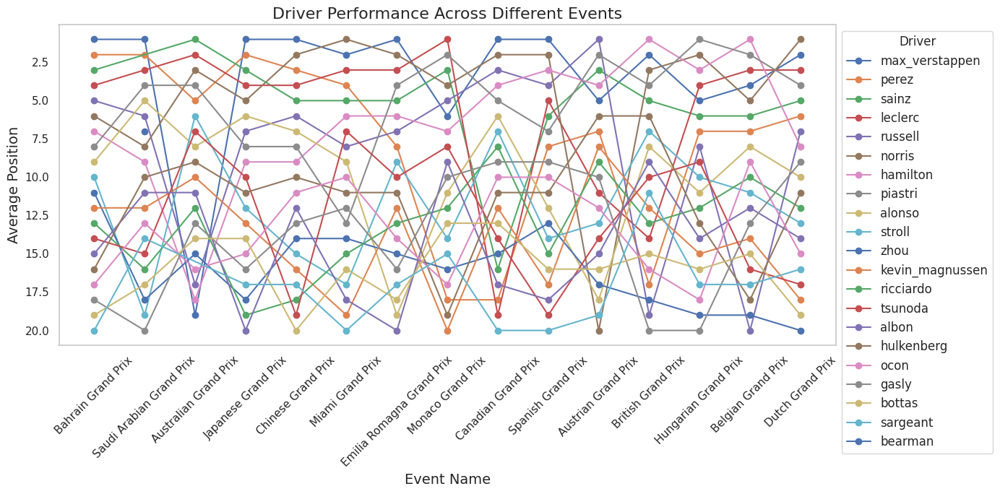

In [ ]:

# ----------------------------all drivers--------------------------------------

plt.figure(figsize=(14, 7))

for driver in df['DriverId'].unique():
    driver_data = df[df['DriverId'] == driver]
    plt.plot(driver_data['EventName'], driver_data['Position'].explode(), marker='o', label=driver)

plt.title('Driver Performance Across Different Events', fontsize=16)
plt.xlabel('Event Name', fontsize=14)
plt.ylabel('Average Position', fontsize=14)
plt.xticks(rotation=45)
plt.gca().invert_yaxis()  # Invert y-axis so that a lower position is better
plt.legend(title='Driver', fontsize=12, loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()


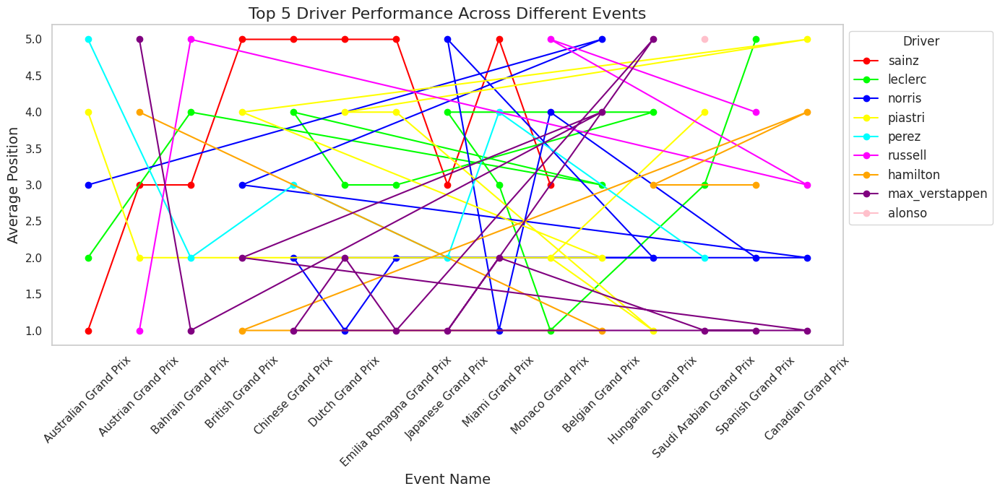

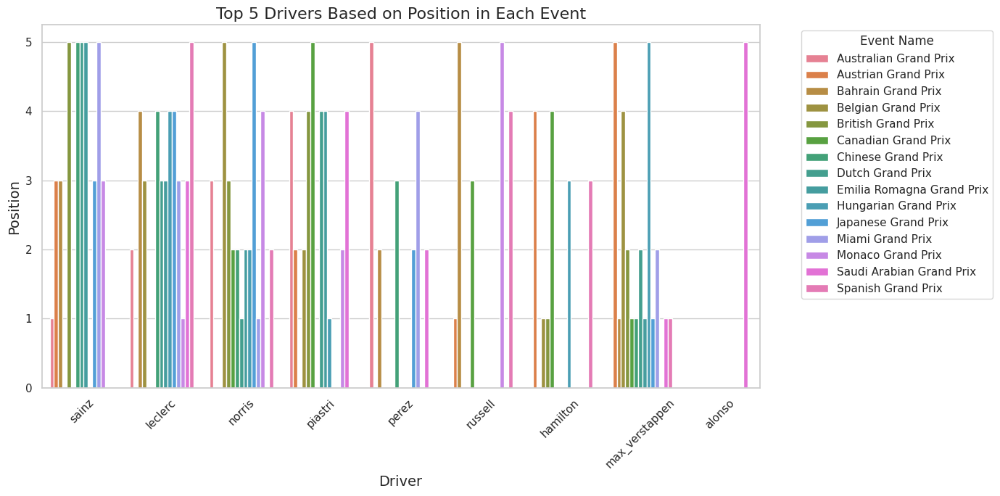

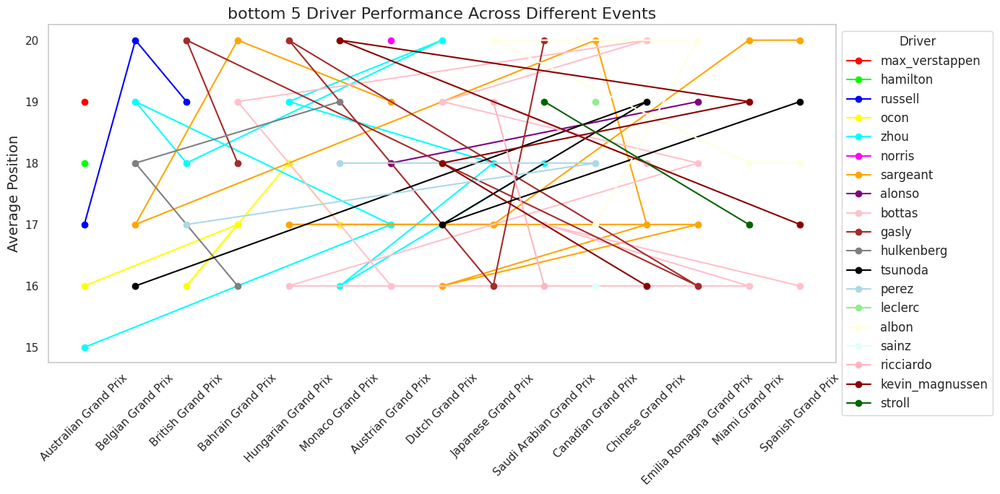

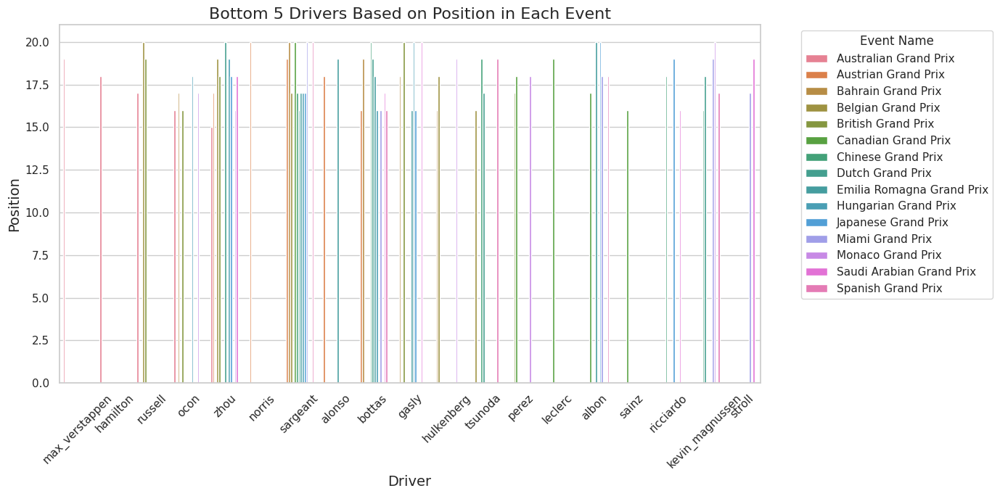

In [ ]:
# ---------------------------------top 5 by position ------------------------
top_10_drivers = df.sort_values(['EventName', 'Position']).groupby('EventName').head(5)

plt.figure(figsize=(14, 7))
i=0
for driver in top_10_drivers['DriverId'].unique():
    driver_data = top_10_drivers[top_10_drivers['DriverId'] == driver]
    plt.plot(driver_data['EventName'], driver_data['Position'].explode(), marker='o', label=driver,  color=list(colors.values())[i])
    i+=1
plt.title('Top 5 Driver Performance Across Different Events', fontsize=16)
plt.xlabel('Event Name', fontsize=14)
plt.ylabel('Average Position', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Driver', fontsize=12, loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.show()

sns.set(style='whitegrid')
plt.figure(figsize=(14, 7))
sns.barplot(data=top_10_drivers, x='DriverId', y='Position', hue='EventName', ci=None)

plt.title('Top 5 Drivers Based on Position in Each Event', fontsize=16)
plt.xlabel('Driver', fontsize=14)
plt.ylabel('Position', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Event Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()
# ---------------------------------bottom 5 by position ------------------------
bottom_5_drivers = df.sort_values(['EventName', 'Position'], ascending=[True, False]).groupby('EventName').head(5)
plt.figure(figsize=(14, 7))
i=0
for driver in bottom_5_drivers['DriverId'].unique():
    driver_data = bottom_5_drivers[bottom_5_drivers['DriverId'] == driver]
    plt.plot(driver_data['EventName'], driver_data['Position'].explode(), marker='o', label=driver,  color=list(colors.values())[i])
    i+=1
plt.title('bottom 5 Driver Performance Across Different Events', fontsize=16)
plt.ylabel('Average Position', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Driver', fontsize=12, loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.show()


sns.set(style='whitegrid')
plt.figure(figsize=(14, 7))
sns.barplot(data=bottom_5_drivers, x='DriverId', y='Position', hue='EventName', ci=None)
plt.title('Bottom 5 Drivers Based on Position in Each Event', fontsize=16)
plt.xlabel('Driver', fontsize=14)
plt.ylabel('Position', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Event Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

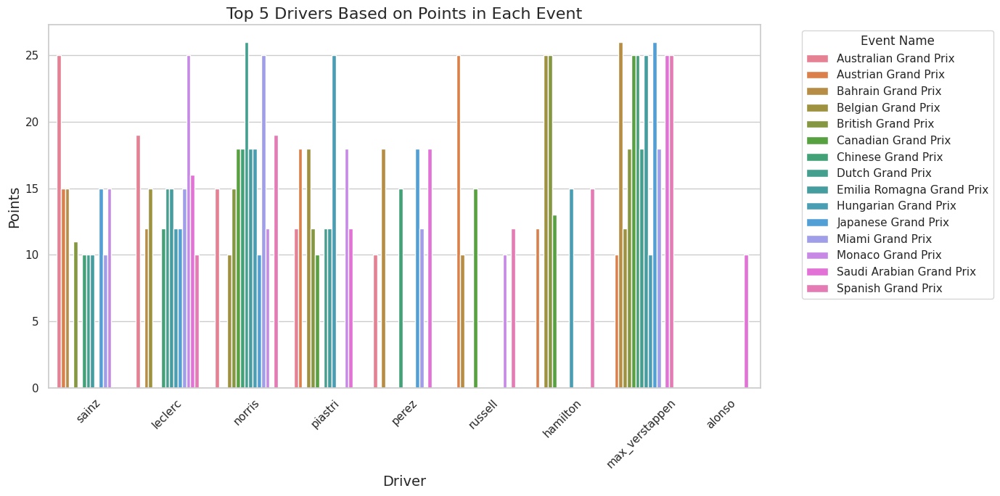

In [ ]:
# ------------------------------------points -----------------------------------------
top_5_drivers = df.sort_values(['EventName', 'Points'], ascending=[True, False]).groupby('EventName').head(5)
sns.set(style='whitegrid')
plt.figure(figsize=(14, 7))

sns.barplot(data=top_5_drivers, x='DriverId', y='Points', hue='EventName', ci=None)

plt.title('Top 5 Drivers Based on Points in Each Event', fontsize=16)
plt.xlabel('Driver', fontsize=14)
plt.ylabel('Points', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Event Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

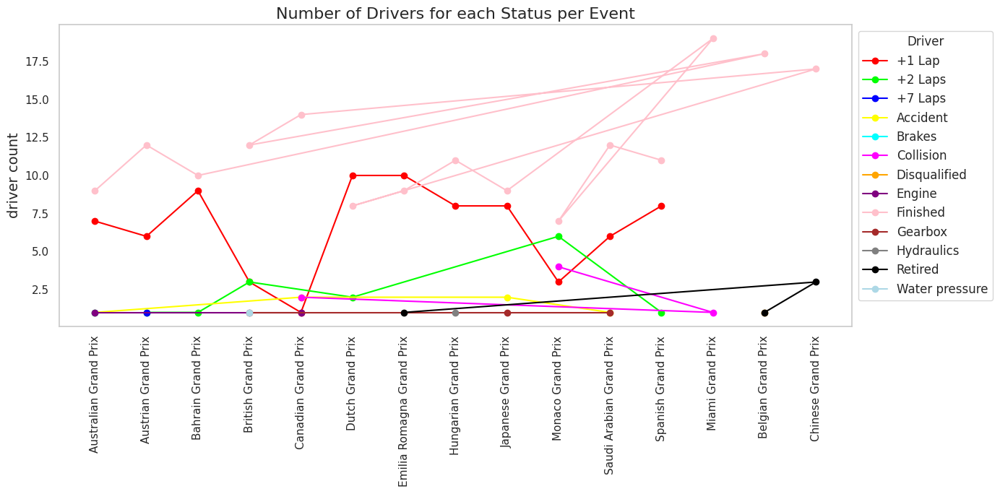

In [ ]:
grouped_df = df.groupby(['Status', 'EventName']).agg({
            'DriverId':  lambda x: np.count_nonzero(np.unique(x)),
            'TeamId' :lambda x: np.count_nonzero(np.unique(x)),
            }, dropna=False).reset_index()
grouped_df

plt.figure(figsize=(14, 7))
i= 0
for status in grouped_df['Status'].unique():
    data = grouped_df[grouped_df['Status'] == status]
    plt.plot(data['EventName'], data['DriverId'], marker='o', label=status, color=list(colors.values())[i])
    i+=1
plt.title('Number of Drivers for each Status per Event', fontsize=16)
plt.ylabel('driver count', fontsize=14)
plt.xticks(rotation=90)
plt.legend(title='Status', fontsize=12, loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.show()



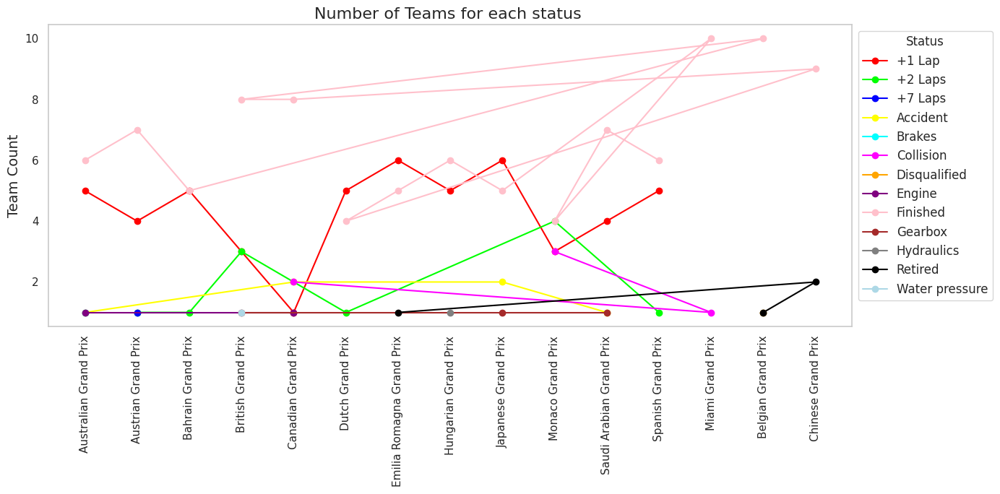

In [ ]:
grouped_df = df.groupby(['Status', 'EventName']).agg({
            'DriverId':  lambda x: np.count_nonzero(np.unique(x)),
            'TeamId' :lambda x: np.count_nonzero(np.unique(x)),
            }, dropna=False).reset_index()
grouped_df

plt.figure(figsize=(14, 7))
i= 0
for status in grouped_df['Status'].unique():
    data = grouped_df[grouped_df['Status'] == status]
    plt.plot(data['EventName'], data['TeamId'], marker='o', label=status, color=list(colors.values())[i])
    i+=1
plt.title('Number of Teams for each status ', fontsize=16)
plt.ylabel('Team Count', fontsize=14)
plt.xticks(rotation=90)
plt.legend(title='Status', fontsize=12, loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.show()



### **weather** 2024

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/formula-1/ocean_data_challenge_F1_data/races_2024/weather_2024.csv')
df.head(5)

,EventName,Time,AirTemp,Humidity,Pressure,Rainfall,TrackTemp,WindDirection,WindSpeed
0,Bahrain Grand Prix,0 days 00:00:14.093000,18.9,46.0,1017.1,False,26.5,162,0.9
1,Bahrain Grand Prix,0 days 00:01:14.084000,18.9,46.0,1017.0,False,26.5,55,1.0
2,Bahrain Grand Prix,0 days 00:02:14.093000,18.9,46.0,1017.0,False,26.5,55,1.0
3,Bahrain Grand Prix,0 days 00:03:14.090000,18.9,45.0,1017.0,False,26.2,85,1.1
4,Bahrain Grand Prix,0 days 00:04:14.091000,18.9,46.0,1017.0,False,26.2,178,1.0


In [ ]:
print(f'{orange}{bold}weather_2024 : {reset} {df.shape} ')
for col in df.columns:
    print(f'{bold}{col} : {reset} |nnull: {yellow}{df[col].isnull().sum()} {reset} |nunique: {green}{df[col].nunique()} {reset} | {red}{df[col].dtype} {reset}|{blue}{list (df[col].unique())} {reset} ' )

weather_2024 :  (2288, 9) 
EventName :  |nnull: 0  |nunique: 15  | object |['Bahrain Grand Prix', 'Saudi Arabian Grand Prix', 'Australian Grand Prix', 'Japanese Grand Prix', 'Chinese Grand Prix', 'Miami Grand Prix', 'Emilia Romagna Grand Prix', 'Monaco Grand Prix', 'Canadian Grand Prix', 'Spanish Grand Prix', 'Austrian Grand Prix', 'British Grand Prix', 'Hungarian Grand Prix', 'Belgian Grand Prix', 'Dutch Grand Prix']  
Time :  |nnull: 0  |nunique: 2288  | object |['0 days 00:00:14.093000', '0 days 00:01:14.084000', '0 days 00:02:14.093000', '0 days 00:03:14.090000', '0 days 00:04:14.091000', '0 days 00:05:14.093000', '0 days 00:06:14.087000', '0 days 00:07:14.097000', '0 days 00:08:14.086000', '0 days 00:09:14.100000', '0 days 00:10:14.093000', '0 days 00:11:14.093000', '0 days 00:12:14.090000', '0 days 00:13:14.099000', '0 days 00:14:14.093000', '0 days 00:15:14.091000', '0 days 00:16:14.102000', '0 days 00:17:14.102000', '0 days 00:18:14.104000', '0 days 00:19:14.121000', '0 days 00

In [ ]:
df.columns

Index(['EventName', 'Time', 'AirTemp', 'Humidity', 'Pressure', 'Rainfall',
       'TrackTemp', 'WindDirection', 'WindSpeed'],
      dtype='object')

In [ ]:
df = convert_to_timedelta(df, ['Time'])
df = conver_deltatime_to_second(df, ['Time'])
grouped_df = df.groupby(['EventName']).agg({
            'AirTemp': list,
            'Humidity' :list,
            'Pressure' :list,
            'Rainfall' :list,
            'Humidity' :list,
            'TrackTemp' : list,

            }, dropna=False).reset_index()
grouped_df.to_csv('weather.csv', index=False)


In [ ]:
grouped_df.head(5)

,EventName,AirTemp,Humidity,Pressure,Rainfall,TrackTemp
0,Australian Grand Prix,"[19.0, 19.0, 19.0, 19.0, 19.0, 19.1, 19.1, 19....","[49.0, 48.0, 48.0, 49.0, 49.0, 49.0, 48.0, 48....","[1021.6, 1021.6, 1021.5, 1021.5, 1021.5, 1021....","[False, False, False, False, False, False, Fal...","[37.0, 37.0, 37.0, 37.7, 38.0, 37.9, 37.8, 37...."
1,Austrian Grand Prix,"[29.1, 29.0, 29.0, 28.9, 28.9, 28.8, 28.8, 28....","[36.0, 35.0, 36.0, 36.0, 36.0, 36.0, 36.0, 36....","[932.9, 932.8, 932.9, 932.9, 933.0, 933.0, 932...","[False, False, False, False, False, False, Fal...","[46.2, 45.9, 45.5, 45.3, 45.2, 45.5, 45.8, 46...."
2,Bahrain Grand Prix,"[18.9, 18.9, 18.9, 18.9, 18.9, 18.9, 18.9, 18....","[46.0, 46.0, 46.0, 45.0, 46.0, 46.0, 46.0, 46....","[1017.1, 1017.0, 1017.0, 1017.0, 1017.0, 1017....","[False, False, False, False, False, False, Fal...","[26.5, 26.5, 26.5, 26.2, 26.2, 26.2, 26.1, 26...."
3,Belgian Grand Prix,"[21.0, 20.6, 20.6, 20.7, 20.7, 20.6, 20.8, 20....","[52.0, 53.0, 52.0, 51.0, 51.0, 51.0, 50.0, 50....","[978.1, 978.0, 978.0, 978.1, 978.1, 978.1, 978...","[False, False, False, False, False, False, Fal...","[42.1, 42.1, 42.2, 42.0, 41.1, 41.1, 40.5, 39...."
4,British Grand Prix,"[15.9, 15.9, 15.9, 15.9, 15.9, 15.9, 15.8, 15....","[67.0, 66.0, 65.0, 66.0, 64.0, 64.0, 64.0, 67....","[991.8, 991.7, 991.7, 991.8, 991.8, 991.9, 991...","[False, False, False, False, False, True, True...","[28.1, 27.6, 27.0, 27.0, 31.0, 31.3, 31.3, 31...."


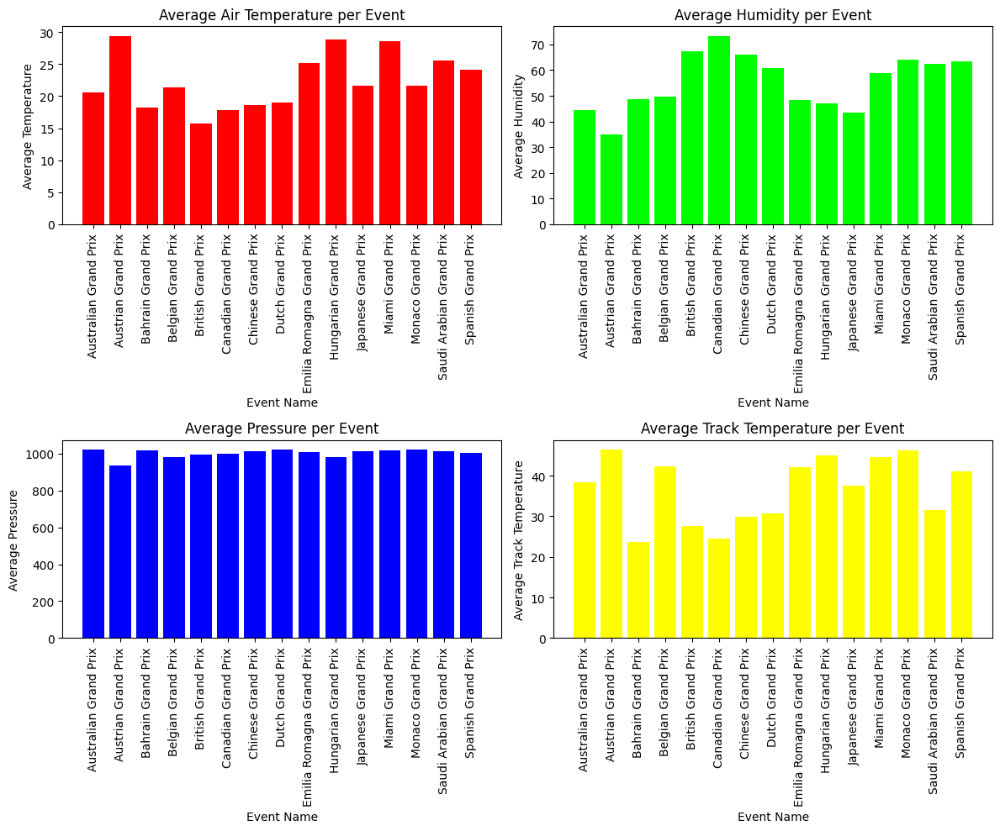

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Average Air Temperature per Event
avg_temp = grouped_df['AirTemp'].apply(lambda x: sum(x)/len(x))
axs[0, 0].bar(grouped_df['EventName'], avg_temp, color=list(colors.values())[0])
axs[0, 0].set_title('Average Air Temperature per Event')
axs[0, 0].set_xlabel('Event Name')
axs[0, 0].set_ylabel('Average Temperature')
axs[0, 0].tick_params(axis='x', rotation=90)

# Average Humidity per Event
avg_humidity = grouped_df['Humidity'].apply(lambda x: sum(x)/len(x))
axs[0, 1].bar(grouped_df['EventName'], avg_humidity, color=list(colors.values())[1])
axs[0, 1].set_title('Average Humidity per Event')
axs[0, 1].set_xlabel('Event Name')
axs[0, 1].set_ylabel('Average Humidity')
axs[0, 1].tick_params(axis='x', rotation=90)

# Average Pressure per Event
avg_pressure = grouped_df['Pressure'].apply(lambda x: sum(x)/len(x))
axs[1, 0].bar(grouped_df['EventName'], avg_pressure, color=list(colors.values())[2])
axs[1, 0].set_title('Average Pressure per Event')
axs[1, 0].set_xlabel('Event Name')
axs[1, 0].set_ylabel('Average Pressure')
axs[1, 0].tick_params(axis='x', rotation=90)

# Average Track Temperature per Event
avg_track_temp = grouped_df['TrackTemp'].apply(lambda x: sum(x)/len(x))
axs[1, 1].bar(grouped_df['EventName'], avg_track_temp, color=list(colors.values())[3])
axs[1, 1].set_title('Average Track Temperature per Event')
axs[1, 1].set_xlabel('Event Name')
axs[1, 1].set_ylabel('Average Track Temperature')
axs[1, 1].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()


### **circuit** 2024

In [ ]:
df  = pd.read_csv('/content/drive/MyDrive/formula-1/ocean_data_challenge_F1_data/races_2024/circuit_2024.csv')
df.head(5)

,EventName,TrackMarker,X,Y,Number,Letter,Angle,Distance
0,Bahrain Grand Prix,Corners,42.405939,8329.202564,1,NaN,-246.615311,710.617854
1,Bahrain Grand Prix,Corners,820.781621,7879.043841,2,NaN,-101.177469,810.105764
2,Bahrain Grand Prix,Corners,1912.969997,8065.442167,3,NaN,-261.394562,919.675665
3,Bahrain Grand Prix,Corners,7487.745293,6790.710716,4,NaN,-349.599066,1498.172766
4,Bahrain Grand Prix,Corners,5820.228443,4860.740936,5,NaN,-211.501597,1766.151578


In [ ]:
print(f'{orange}{bold}circuit_2024 : {reset} {df.shape} ')
for col in df.columns:
    print(f'{bold}{col} : {reset} |nnull: {yellow}{df[col].isnull().sum()} {reset} |nunique: {green}{df[col].nunique()} {reset} | {red}{df[col].dtype} {reset}|{blue}{list (df[col].unique())} {reset} ' )

circuit_2024 :  (810, 8) 
EventName :  |nnull: 0  |nunique: 15  | object |['Bahrain Grand Prix', 'Saudi Arabian Grand Prix', 'Australian Grand Prix', 'Japanese Grand Prix', 'Chinese Grand Prix', 'Miami Grand Prix', 'Emilia Romagna Grand Prix', 'Monaco Grand Prix', 'Canadian Grand Prix', 'Spanish Grand Prix', 'Austrian Grand Prix', 'British Grand Prix', 'Hungarian Grand Prix', 'Belgian Grand Prix', 'Dutch Grand Prix']  
TrackMarker :  |nnull: 0  |nunique: 3  | object |['Corners', 'Marshal Lights', 'Marshal Sectors']  
X :  |nnull: 0  |nunique: 803  | float64 |[42.40593929993702, 820.7816212551479, 1912.969997301606, 7487.745292571566, 5820.228442599813, 5180.404120509692, 4276.202937249183, 2490.099010685538, 2711.1552878922835, 2100.132715648695, 2120.985220517636, 4981.251161545602, 6665.934072283377, -145.4124578081196, -552.8126057447134, -403.0300099850047, -170.99778031790402, 2091.793057829815, 6028.332907666913, 6384.228519856786, 5401.364201039349, 3886.937743331719, 2977.38190

### **control message** 2024

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/formula-1/ocean_data_challenge_F1_data/races_2024/control_message_2024.csv')
df.head(5)

,EventName,Time,Category,Message,Status,Flag,Scope,Sector,RacingNumber,Lap
0,Bahrain Grand Prix,2024-03-02 14:06:41,Other,PINK HEAD PADDING MATERIAL MUST BE USED,NaN,NaN,NaN,NaN,NaN,1.0
1,Bahrain Grand Prix,2024-03-02 14:20:01,Flag,GREEN LIGHT - PIT EXIT OPEN,NaN,GREEN,Track,NaN,NaN,1.0
2,Bahrain Grand Prix,2024-03-02 14:30:01,Other,PIT EXIT CLOSED,NaN,NaN,NaN,NaN,NaN,1.0
3,Bahrain Grand Prix,2024-03-02 14:45:29,Other,RISK OF RAIN FOR F1 RACE IS 0%,NaN,NaN,NaN,NaN,NaN,1.0
4,Bahrain Grand Prix,2024-03-02 14:57:04,Drs,DRS DISABLED,DISABLED,NaN,NaN,NaN,NaN,1.0


In [ ]:
print(f'{orange}{bold}control_message_2024 : {reset} {df.shape} ')
for col in df.columns:
    print(f'{bold}{col} : {reset} |nnull: {yellow}{df[col].isnull().sum()} {reset} |nunique: {green}{df[col].nunique()} {reset} | {red}{df[col].dtype} {reset}|{blue}{list (df[col].unique())} {reset} ' )

control_message_2024 :  (1273, 10) 
EventName :  |nnull: 0  |nunique: 15  | object |['Bahrain Grand Prix', 'Saudi Arabian Grand Prix', 'Australian Grand Prix', 'Japanese Grand Prix', 'Chinese Grand Prix', 'Miami Grand Prix', 'Emilia Romagna Grand Prix', 'Monaco Grand Prix', 'Canadian Grand Prix', 'Spanish Grand Prix', 'Austrian Grand Prix', 'British Grand Prix', 'Hungarian Grand Prix', 'Belgian Grand Prix', 'Dutch Grand Prix']  
Time :  |nnull: 0  |nunique: 1245  | object |['2024-03-02 14:06:41', '2024-03-02 14:20:01', '2024-03-02 14:30:01', '2024-03-02 14:45:29', '2024-03-02 14:57:04', '2024-03-02 15:03:42', '2024-03-02 15:03:59', '2024-03-02 15:04:03', '2024-03-02 15:04:29', '2024-03-02 15:04:36', '2024-03-02 15:05:23', '2024-03-02 15:05:38', '2024-03-02 15:05:44', '2024-03-02 15:05:55', '2024-03-02 15:06:43', '2024-03-02 15:08:42', '2024-03-02 15:11:18', '2024-03-02 15:11:19', '2024-03-02 15:13:05', '2024-03-02 15:19:07', '2024-03-02 15:19:08', '2024-03-02 15:19:58', '2024-03-02 15:

### **track_status** 2024

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/formula-1/ocean_data_challenge_F1_data/races_2024/track_status_2024.csv')
df.head(5)

,EventName,Time,Status,Message
0,Bahrain Grand Prix,0 days 00:10:06.010000,1,AllClear
1,Bahrain Grand Prix,0 days 01:00:16.400000,2,Yellow
2,Bahrain Grand Prix,0 days 01:00:20.890000,1,AllClear
3,Bahrain Grand Prix,0 days 01:00:46.461000,2,Yellow
4,Bahrain Grand Prix,0 days 01:00:53.481000,1,AllClear


In [ ]:
print(f'{orange}{bold} track_status_2024 : {reset} {df.shape} ')
for col in df.columns:
    print(f'{bold}{col} : {reset} |nnull: {yellow}{df[col].isnull().sum()} {reset} |nunique: {green}{df[col].nunique()} {reset} | {red}{df[col].dtype} {reset}|{blue}{list (df[col].unique())} {reset} ' )

 track_status_2024 :  (106, 4) 
EventName :  |nnull: 0  |nunique: 15  | object |['Bahrain Grand Prix', 'Saudi Arabian Grand Prix', 'Australian Grand Prix', 'Japanese Grand Prix', 'Chinese Grand Prix', 'Miami Grand Prix', 'Emilia Romagna Grand Prix', 'Monaco Grand Prix', 'Canadian Grand Prix', 'Spanish Grand Prix', 'Austrian Grand Prix', 'British Grand Prix', 'Hungarian Grand Prix', 'Belgian Grand Prix', 'Dutch Grand Prix']  
Time :  |nnull: 0  |nunique: 99  | object |['0 days 00:10:06.010000', '0 days 01:00:16.400000', '0 days 01:00:20.890000', '0 days 01:00:46.461000', '0 days 01:00:53.481000', '0 days 01:15:24.819000', '0 days 01:16:15.962000', '0 days 00:00:00', '0 days 00:08:45.692000', '0 days 01:09:15.917000', '0 days 01:09:49.924000', '0 days 01:16:35.527000', '0 days 00:00:13.560000', '0 days 00:05:52.010000', '0 days 01:21:24.717000', '0 days 01:21:41.517000', '0 days 01:22:45.787000', '0 days 01:23:00.690000', '0 days 02:17:08.699000', '0 days 02:17:19.578000', '0 days 00:02:

### **session_status** 2024

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/formula-1/ocean_data_challenge_F1_data/races_2024/session_status_2024.csv')
df.head(5)

,EventName,Time,Status
0,Bahrain Grand Prix,0 days 00:00:09.193000,Inactive
1,Bahrain Grand Prix,0 days 00:59:59.911000,Started
2,Bahrain Grand Prix,0 days 02:31:44.878000,Finished
3,Bahrain Grand Prix,0 days 02:36:15.245000,Finalised
4,Bahrain Grand Prix,0 days 02:36:15.245000,Ends


In [ ]:
print(f'{orange}{bold}session_status_2024 : {reset} {df.shape} ')
for col in df.columns:
    print(f'{bold}{col} : {reset} |nnull: {yellow}{df[col].isnull().sum()} {reset} |nunique: {green}{df[col].nunique()} {reset} | {red}{df[col].dtype} {reset}|{blue}{list (df[col].unique())} {reset} ' )

session_status_2024 :  (79, 3) 
EventName :  |nnull: 0  |nunique: 15  | object |['Bahrain Grand Prix', 'Saudi Arabian Grand Prix', 'Australian Grand Prix', 'Japanese Grand Prix', 'Chinese Grand Prix', 'Miami Grand Prix', 'Emilia Romagna Grand Prix', 'Monaco Grand Prix', 'Canadian Grand Prix', 'Spanish Grand Prix', 'Austrian Grand Prix', 'British Grand Prix', 'Hungarian Grand Prix', 'Belgian Grand Prix', 'Dutch Grand Prix']  
Time :  |nnull: 0  |nunique: 74  | object |['0 days 00:00:09.193000', '0 days 00:59:59.911000', '0 days 02:31:44.878000', '0 days 02:36:15.245000', '0 days 00:00:11.745000', '0 days 00:59:43.836000', '0 days 02:20:27.332000', '0 days 02:25:11.339000', '0 days 00:00:11.132000', '0 days 00:58:29.232000', '0 days 02:18:56.262000', '0 days 02:23:19.503000', '0 days 02:38:17.180000', '0 days 00:00:04.725000', '0 days 01:02:40.422000', '0 days 01:03:22.840000', '0 days 01:30:58.774000', '0 days 02:57:04.188000', '0 days 03:01:21.531000', '0 days 00:00:04.052000', '0 days

### **positions** 2024

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/formula-1/ocean_data_challenge_F1_data/races_2024/track_status_2024.csv')
df.head(5)

,EventName,Time,Status,Message
0,Bahrain Grand Prix,0 days 00:10:06.010000,1,AllClear
1,Bahrain Grand Prix,0 days 01:00:16.400000,2,Yellow
2,Bahrain Grand Prix,0 days 01:00:20.890000,1,AllClear
3,Bahrain Grand Prix,0 days 01:00:46.461000,2,Yellow
4,Bahrain Grand Prix,0 days 01:00:53.481000,1,AllClear


In [ ]:
print(f'{orange}{bold}position_2024 : {reset} {df.shape} ')
for col in df.columns:
    print(f'{bold}{col} : {reset} |nnull: {yellow}{df[col].isnull().sum()} {reset} |nunique: {green}{df[col].nunique()} {reset} | {red}{df[col].dtype} {reset}|{blue}{list (df[col].unique())} {reset} ' )